In [91]:
from sklearn.metrics import root_mean_squared_error, accuracy_score, precision_recall_fscore_support
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.feature_selection import SelectKBest, chi2, RFE, mutual_info_regression
from tensorflow.keras.layers import Dense, LSTM, Dropout
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from tensorflow.keras.models import Sequential
from tensorflow.keras import regularizers
from sklearn.svm import SVC, LinearSVC
from keras.utils import to_categorical
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
import pandas as pd
import numpy as np
import joblib

# Feature Engineering

First, we will load the data into our DataFrame. Sort by date and denote which Season each match corresponds to. 

In [92]:
data_dir = "finalData.csv"
df = pd.read_csv(data_dir)

In [93]:
# renaming the columns
df.columns = ['Date', 'Home Team', 'Away Team', 'Full Time Home Goals', 'Full Time Away Goals', 'Full Time Result',       
'Half Time Home Goals', 'Half Time Away Goals', 'Half Time Result', 'Referee', 'Home Shots', 'Away Shots', 'Home Shots on Target',   
'Away Shots on Target', 'Home Corners', 'Away Corners', 'Home Fouls', 'Away Fouls', 'Home Yellow Cards', 'Away Yellow Cards',     
'Home Red Cards', 'Away Red Cards', 'Home Possession', 'Away Possession', 'Home Passes Completed', 'Home Passes PCT',
'Home Progressive Passes', 'Home Progressive Passing Distance', 'Home xG', 'Home Take Ons Won', 'Home Take Ons', 
'Home Interceptions', 'Home Blocks', 'Home Touches', 'Home Touches Def 3rd', 'Home Touches Mid 3rd', 'Home Touches Att 3rd',
'Home Carries', 'Home Carries Progressive Distance', 'Home Tackles', 'Home Tackles Won', 'Away Passes Completed',
'Away Passes PCT', 'Away Progressive Passes', 'Away Progressive Passing Distance', 'Away xG',
'Away Take Ons Won', 'Away Take Ons', 'Away Interceptions', 'Away Blocks', 'Away Touches', 'Away Touches Def 3rd',
'Away Touches Mid 3rd', 'Away Touches Att 3rd', 'Away Carries', 'Away Carries Progressive Distance', 'Away Tackles',
'Away Tackles Won']

In [94]:
# ensure sorted by date
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df.sort_values(by='Date')

# each season starts at 08 and ends at 05 of next year - 2000-2001 season will be the 2000 season
def get_season(date):
    if date.month >= 8:  
        return (date.year)
    else:  
        return (date.year - 1)

df['Season'] = df['Date'].apply(get_season)
df['Match Outcome'] = df['Full Time Result'].map({'H': 1, 'D': 0, 'A': -1})

Here, we begin engineering new features. The following function enables us to find the previous matches a team played (within this or the previous season). Using this key function, we created several features:

Average Goal Conversion Rate Difference, Average Attacking Intensity Difference, Average Disciplinary Pressure Difference, Recent Performances, Average Goals Scored Difference, Average Goals Conceded Difference, ...

Note: All averages use the previous RECENCY_NUM matches. If the number of previous matches in this season is too few, it will draw from the previous season as well. 

Note 2: After feature engineering, we will have to remove 101 matches that do not have RECENCY_NUM=5 matches prior. Unfortunately, this will reduce our dataset by 3.66%.

In [95]:
RECENCY_NUM = 5

In [96]:
# Team Points = total points in the game. win:3, draw:1, loss:0... DROPPED AFTERWARDS
# Total Points = cumulative sum of the team points, per team, per season
# Point Difference = difference between total points of the teams, per match
def calculate_season_points(df):
    df['Home Team Points'] = 0
    df['Away Team Points'] = 0

    for idx, row in df.iterrows():
        if row['Match Outcome'] == 1:  
            df.at[idx, 'Home Team Points'] = 3
            df.at[idx, 'Away Team Points'] = 0
        elif row['Match Outcome'] == 0: 
            df.at[idx, 'Home Team Points'] = 1
            df.at[idx, 'Away Team Points'] = 1
        elif row['Match Outcome'] == -1:  
            df.at[idx, 'Home Team Points'] = 0
            df.at[idx, 'Away Team Points'] = 3

    df['Home Total Seasonal Points'] = (df.groupby(['Home Team', 'Season'])['Home Team Points'].cumsum())
    df['Away Total Seasonal Points'] = (df.groupby(['Away Team', 'Season'])['Away Team Points'].cumsum())
    # df['Seasonal Point Difference'] = df['Home Total Seasonal Points'] - df['Away Total Seasonal Points']
    # df.drop(columns=['Home Team Points', 'Away Team Points'], inplace=True)

    return df
df = calculate_season_points(df)

In [97]:
def standardisation(df, terms=['Difference Average Goals Scored Last X Games', 'Difference Average Goals Conceded Last X Games', 'Point Difference', 'xG Difference']):
    scaler = StandardScaler()
    df[terms] = scaler.fit_transform(df[terms])
    return df

# normalises a specific set of columns
def normalisation(df, terms=['Difference Average Goals Scored Last X Games', 'Difference Average Goals Conceded Last X Games', 'Point Difference', 'xG Difference']):
    scaler = MinMaxScaler()
    df[terms] = scaler.fit_transform(df[terms])
    return df

# label encoding - use for boosting models
def label_encoding(df, col=['Home Team', 'Away Team'], dataframe=True):
    label_encoder = LabelEncoder()
    if dataframe:
        for c in col:
            df[c] = label_encoder.fit_transform(df[c])
    else:
        df = label_encoder.fit_transform(df)
    return df

Explained Variance Ratio:  [3.16576232e-01 8.45400333e-02 5.77480471e-02 4.98413595e-02
 3.97925540e-02 3.75659122e-02 3.41837323e-02 3.31313049e-02
 2.44209614e-02 2.42266364e-02 2.10247585e-02 1.90175701e-02
 1.81513320e-02 1.75881751e-02 1.65469751e-02 1.53220145e-02
 1.47904115e-02 1.39839348e-02 1.30258432e-02 1.25829526e-02
 1.18487923e-02 1.10295738e-02 1.02416566e-02 9.20479283e-03
 8.43066550e-03 7.85997645e-03 7.05260791e-03 6.22120658e-03
 5.48273633e-03 4.98185979e-03 4.62467530e-03 4.33793785e-03
 4.22584095e-03 4.05631205e-03 3.62936796e-03 3.54816995e-03
 3.00574141e-03 2.89590597e-03 2.75576708e-03 2.51615232e-03
 2.50223162e-03 2.20056031e-03 2.13312656e-03 1.82915504e-03
 1.59959876e-03 1.57101208e-03 1.52742630e-03 1.23717945e-03
 1.17426109e-03 1.06742370e-03 7.73061379e-04 2.30962891e-04
 1.20645223e-04 1.70988808e-05 2.93059148e-06 2.73610511e-06
 1.10141878e-07 0.00000000e+00]
Number of components to retain 95% variance: 31


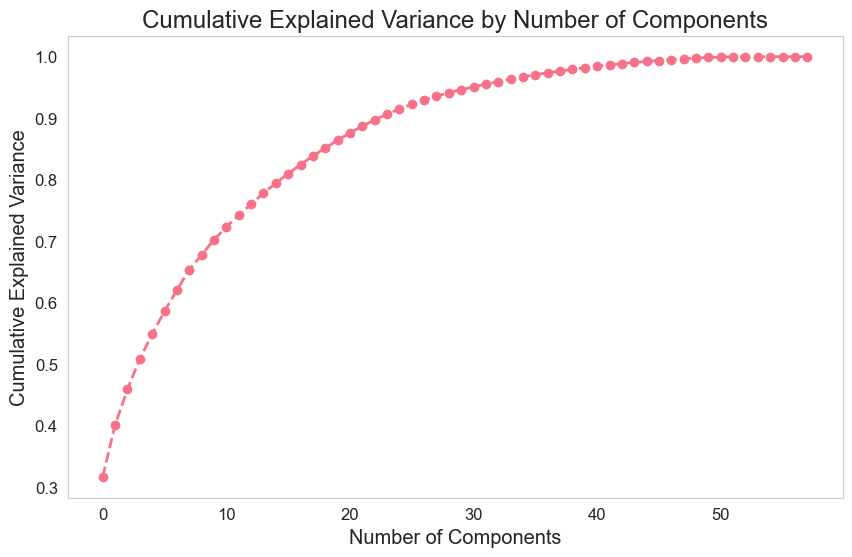

In [98]:
def pca(df):
    # drop the irrelevant terms
    featuresToDrop = ['Date', 'Home Team', 'Away Team', 'Full Time Result', 'Half Time Result', 'Referee']
    assert set(featuresToDrop).issubset(df.columns), "Some columns in featuresToDrop are missing in df"
    df2 = df.drop(featuresToDrop, axis=1)
    
    df2 = standardisation(df2, terms=list(df2.columns))
    
    pca = PCA()
    pca_components = pca.fit_transform(df2)
    
    # find the explained variance ratio
    explained_variance = pca.explained_variance_ratio_
    print("Explained Variance Ratio: ", explained_variance)

    # select number of components based on explained variance (e.g., 95% variance)
    cumulative_variance = explained_variance.cumsum()
    n_components = next(i for i, v in enumerate(cumulative_variance) if v >= 0.95) + 1
    print(f"Number of components to retain 95% variance: {n_components}")

    # visualize explained variance
    plt.figure(figsize=(10, 6))
    plt.plot(cumulative_variance, marker='o', linestyle='--')
    plt.title('Cumulative Explained Variance by Number of Components')
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.grid()
    plt.show()
    
    return n_components
    
number_of_components = pca(df)

Next, we reduced the feature data set to 5 sections of inputs: Home Advantage, Attacking Strength, Midfield Strength, Defensive Strength, and extras. 

Discarded features include: 

'Half Time Home Goals', 'Half Time Away Goals', 'Half Time Result', 'Referee', 'Home Shots', 'Away Shots', 'Home Fouls', 'Away Fouls', 'Home Yellow Cards', 'Away Yellow Cards', 'Home Red Cards', 'Away Red Cards', 'Home Possession', 'Away Possession', 'Home Progressive Passing Distance', 'Home xG', 'Home Take Ons', 'Home Touches', 'Home Touches Def 3rd', 'Home Carries Progressive Distance', 'Away Progressive Passing Distance', 'Away xG', 'Away Take Ons', 'Away Touches', 'Away Touches Def 3rd', 'Away Carries Progressive Distance', 'Season', 'Home Team Points', 'Away Team Points', 'Home Total Seasonal Points', 'Away Total Seasonal Points'

In [99]:
features = [
    # Home Advantage
    "Home Team",
    "Away Team",
    "Match Outcome",
    "Full Time Home Goals",
    "Full Time Away Goals",
    
    # Attacking Strength
    "Home Shots on Target", "Away Shots on Target",
    "Home Progressive Passes", "Away Progressive Passes",
    "Home Touches Att 3rd", "Away Touches Att 3rd",
    "Home Take Ons Won", "Away Take Ons Won",
    "Home Corners", "Away Corners",
    
    # Midfield Strength
    "Home Touches Mid 3rd", "Away Touches Mid 3rd",
    "Home Passes Completed", "Away Passes Completed",
    "Home Passes PCT", "Away Passes PCT",
    "Home Carries", "Away Carries",
    
    # Defensive Strength
    "Home Tackles", "Away Tackles",
    "Home Tackles Won", "Away Tackles Won",
    "Home Blocks", "Away Blocks",
    "Home Interceptions", "Away Interceptions",
    
    # Extra
    "Full Time Result",
    'Date'
]

new_df = df[features].copy()
new_df.dropna(inplace=True)

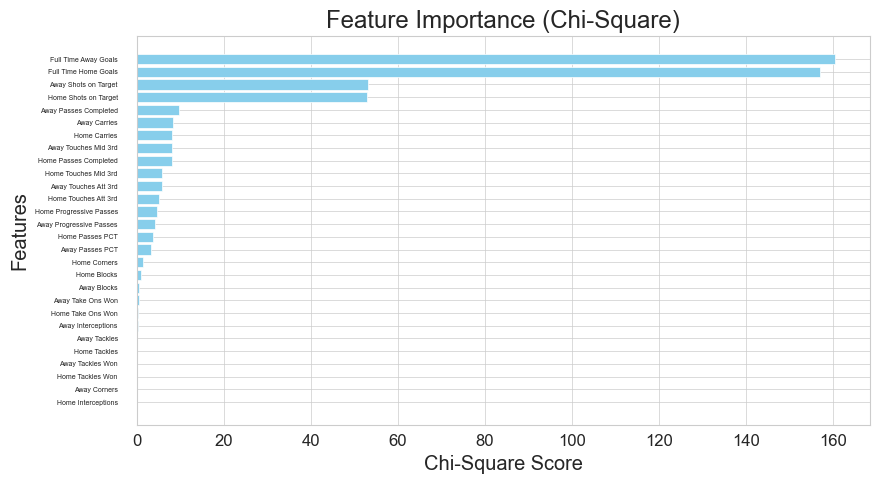

In [100]:
def chi_square(df):
    # organise dataset into X (training examples) and y (targets)
    featuresToDrop = ['Date', 'Home Team', 'Full Time Result', 'Away Team', 'Match Outcome']
    assert set(featuresToDrop).issubset(df.columns), "Some columns in featuresToDrop are missing in df"
    data = df.drop(featuresToDrop, axis=1)
    df['Match Outcome'] = df['Full Time Result'].map({'H': 1, 'D': 0, 'A': -1})
    target = df['Match Outcome']
    
    # chi2 scoring function requires non-negative input: normalisation
    data = normalisation(data, terms=list(data.columns))
    
    # collect the feature names
    feature_names = list(data.columns)
    
    # perform chi square selection    
    chi_select = SelectKBest(chi2, k=min(number_of_components, len(data.columns)))
    new_data = chi_select.fit_transform(data, target)
    
    # collect features
    selected_features = []
    for i, b in enumerate(chi_select.get_support()):
        if b:
            selected_features.append(feature_names[i])
    
    # get the chi-square scores for all features
    chi_scores = chi_select.scores_

    # create a dataFrame for easy visualization
    chi2_df = pd.DataFrame({'Feature': feature_names, 'Chi-Square Score': chi_scores})
    chi2_df = chi2_df.sort_values(by='Chi-Square Score', ascending=False)

    # plot the scores
    plt.figure(figsize=(10, 5))
    colours = ['skyblue' if i < number_of_components else 'gray' for i in range(len(chi2_df))]
    plt.barh(chi2_df['Feature'], chi2_df['Chi-Square Score'], color=colours)
    plt.xlabel('Chi-Square Score')
    plt.ylabel('Features')
    plt.title('Feature Importance (Chi-Square)')
    plt.gca().invert_yaxis()  # Invert y-axis to show the highest scores at the top
    plt.tight_layout()
    plt.tick_params(axis="y", pad=10, labelsize=5)
    plt.show()
    
    return chi2_df
    
chi2_df = chi_square(new_df)   

Now we will take the feature importance scores from the Chi-Square distribution and adjust the weights to approach a gradual steady decline. This will allow the less important features to contribute to our feature engineering later while preserving a hierarchical ranking. 

Note: the number 1/3 was chosen arbitrarily but it was observed to be a standard heuristic among Machine Learning papers.

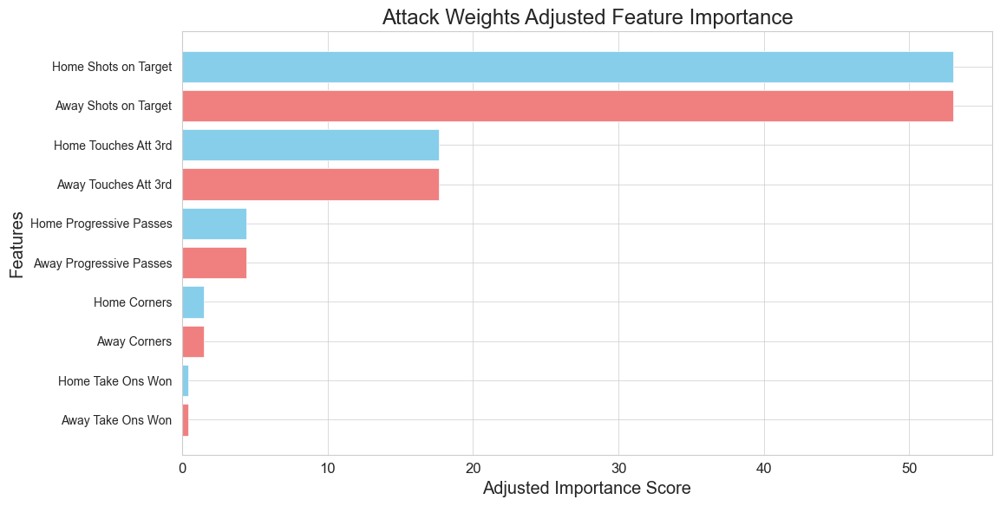

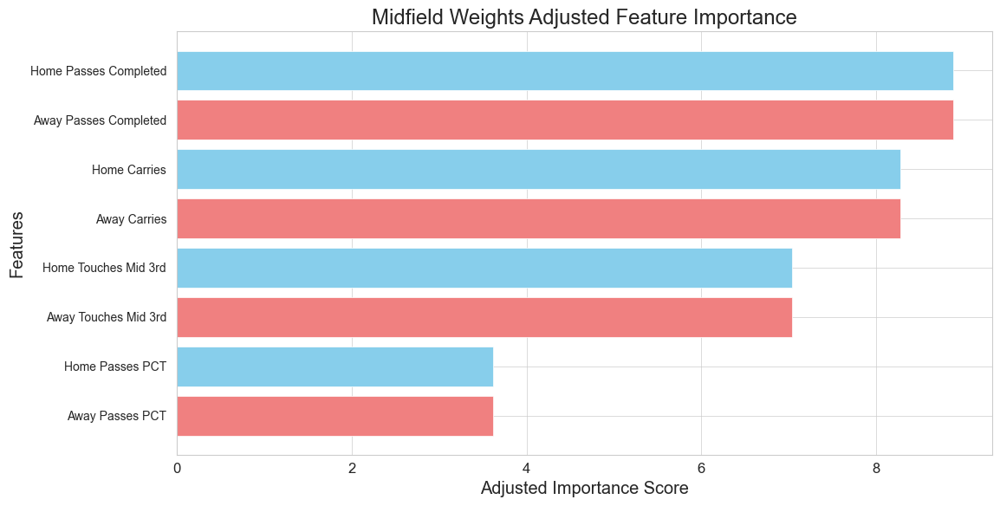

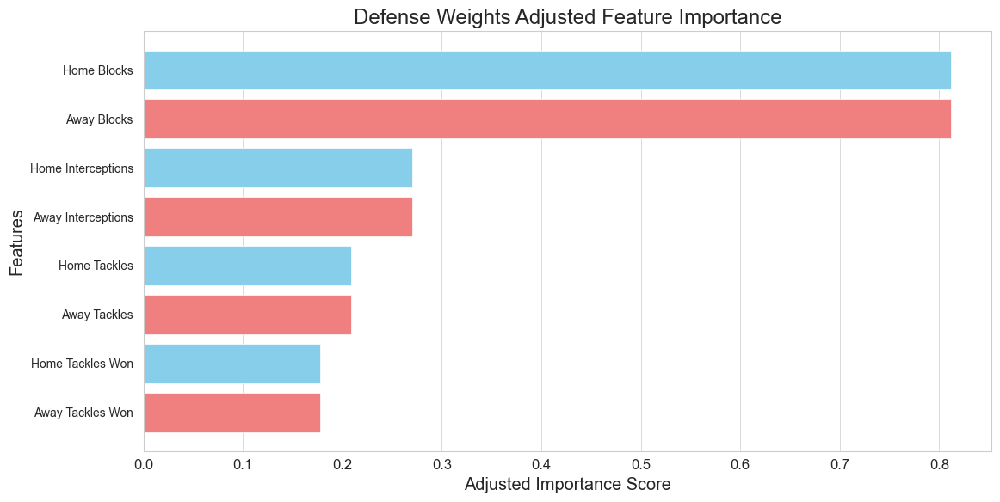

In [101]:
def adjust_feature_weights(features, chi2_df):
    # Aggregate Home and Away importance scores
    aggregated_scores = {}
    for feature_pair in features:
        home_feature, away_feature = feature_pair
        home_score = chi2_df.loc[chi2_df['Feature'] == home_feature, 'Chi-Square Score'].values[0]
        away_score = chi2_df.loc[chi2_df['Feature'] == away_feature, 'Chi-Square Score'].values[0]
        aggregated_scores[feature_pair] = home_score + away_score

    # Sort features by aggregated importance
    sorted_features = sorted(aggregated_scores.items(), key=lambda x: x[1], reverse=True)
    
    # Adjust scores using the /3 rule
    adjusted_scores = {}
    adjusted_scores[sorted_features[0][0]] = sorted_features[0][1]  # Most important feature remains unchanged
    
    for i in range(1, len(sorted_features)):
        current_feature, current_score = sorted_features[i]
        previous_feature, previous_score = sorted_features[i - 1]
        
        if current_score < previous_score / 3:
            current_score = previous_score / 3
        adjusted_scores[current_feature] = current_score

    # Assign adjusted scores equally to Home and Away features
    final_weights = {}
    for feature_pair, score in adjusted_scores.items():
        home_feature, away_feature = feature_pair
        final_weights[home_feature] = score / 2
        final_weights[away_feature] = score / 2
    
    return final_weights

def plot_adjusted_features(weights, title):
    # prepare data for plotting
    features = list(weights.keys())
    importance = list(weights.values())

    # create the plot
    plt.figure(figsize=(12, 6))
    colours = ['skyblue' if 'Home' in feature else 'lightcoral' for feature in features]
    plt.barh(features, importance, color=colours)

    # customize the plot
    plt.xlabel('Adjusted Importance Score')
    plt.ylabel('Features')
    plt.title(title)
    plt.gca().invert_yaxis()  # highest scores at the top
    plt.tight_layout()
    plt.tick_params(axis="y", pad=5, labelsize=10)  # adjust y-axis label size for better visibility
    plt.show()


def create_strength_features_separate(df, chi2_df):
    # Define feature pairs for each group
    attack_features = [
        ("Home Shots on Target", "Away Shots on Target"),
        ("Home Progressive Passes", "Away Progressive Passes"),
        ("Home Touches Att 3rd", "Away Touches Att 3rd"),
        ("Home Take Ons Won", "Away Take Ons Won"),
        ("Home Corners", "Away Corners")
    ]
    midfield_features = [
        ("Home Touches Mid 3rd", "Away Touches Mid 3rd"),
        ("Home Passes Completed", "Away Passes Completed"),
        ("Home Passes PCT", "Away Passes PCT"),
        ("Home Carries", "Away Carries")
    ]
    defense_features = [
        ("Home Tackles", "Away Tackles"),
        ("Home Tackles Won", "Away Tackles Won"),
        ("Home Blocks", "Away Blocks"),
        ("Home Interceptions", "Away Interceptions")
    ]
    
    # Adjust weights for each group
    attack_weights = adjust_feature_weights(attack_features, chi2_df)
    midfield_weights = adjust_feature_weights(midfield_features, chi2_df)
    defense_weights = adjust_feature_weights(defense_features, chi2_df)
    
    plot_adjusted_features(attack_weights, "Attack Weights Adjusted Feature Importance")
    plot_adjusted_features(midfield_weights, "Midfield Weights Adjusted Feature Importance")
    plot_adjusted_features(defense_weights, "Defense Weights Adjusted Feature Importance")
    
    # Calculate strength scores for Home and Away
    def calculate_strength(feature_pairs, weights, team_type):
        strength_score = 0
        for home_feature, away_feature in feature_pairs:
            feature = home_feature if team_type == "Home" else away_feature
            strength_score += df[feature] * weights[feature]
        return strength_score

    # Compute Home and Away strengths for Attack, Midfield, and Defense
    df['Home Attack Strength'] = calculate_strength(attack_features, attack_weights, "Home")
    df['Away Attack Strength'] = calculate_strength(attack_features, attack_weights, "Away")
    df['Home Midfield Strength'] = calculate_strength(midfield_features, midfield_weights, "Home")
    df['Away Midfield Strength'] = calculate_strength(midfield_features, midfield_weights, "Away")
    df['Home Defense Strength'] = calculate_strength(defense_features, defense_weights, "Home")
    df['Away Defense Strength'] = calculate_strength(defense_features, defense_weights, "Away")
    
    return df



strength_df = create_strength_features_separate(new_df, chi2_df)

In [102]:
def avg_stats_last_x_games(df):
    
    def calculate_running_avg(stats_list, x):
        if len(stats_list) < x:
            return None
        return sum(stats_list[-x:]) / x

    metrics = ['Goals Scored', 'Goals Conceded', 'Attack Strength', 'Midfield Strength', 'Defense Strength', 'Recent Performance']# , 'xG', 'Disciplinary Pressure']
    for metric in metrics:
        for x in range(1, RECENCY_NUM + 1):
            df[f'Avg {metric} Home Last {x} Games'] = None
            df[f'Avg {metric} Away Last {x} Games'] = None
    running_stats = {}

    for idx, row in df.iterrows():
        for team_type in ['Home Team', 'Away Team']:
            team = row[team_type]
            stat_type = team_type.split()[0]  # Home or Away

            if team not in running_stats:
                running_stats[team] = {
                    'Goals Scored': [],
                    'Goals Conceded': [],
                    'Attack Strength': [],
                    'Midfield Strength': [],
                    'Defense Strength': [],
                    #'Disciplinary Pressure': [],
                    'Recent Performance': []
                }

            team_stats = running_stats[team]

            for x in range(1, RECENCY_NUM + 1):
                for metric in metrics:
                    avg_stat = calculate_running_avg(team_stats[metric], x)
                    df.at[idx, f'Avg {metric} {stat_type} Last {x} Games'] = avg_stat
            team_stats['Goals Scored'].append(row['Full Time Home Goals'] if stat_type == 'Home' else row['Full Time Away Goals'])
            team_stats['Goals Conceded'].append(row['Full Time Away Goals'] if stat_type == 'Home' else row['Full Time Home Goals'])
            team_stats['Attack Strength'].append(row['Home Attack Strength'] if stat_type == 'Home' else row['Away Attack Strength'])
            team_stats['Midfield Strength'].append(row['Home Midfield Strength'] if stat_type == 'Home' else row['Away Midfield Strength'])
            team_stats['Defense Strength'].append(row['Home Defense Strength'] if stat_type == 'Home' else row['Away Defense Strength'])
            #team_stats['xG'].append(row['xG Home'] if stat_type == 'Home' else row['xG Away'])
            #team_stats['Disciplinary Pressure'].append(row['Home Disciplinary Pressure'] if stat_type == 'Home' else row['Away Disciplinary Pressure'])
            team_stats['Recent Performance'].append(1 if (row['Full Time Result'] == 'H' and stat_type == 'Home') or (row['Full Time Result'] == 'A' and stat_type == 'Away') else 0.5 if row['Full Time Result'] == 'D' else 0)
    return df

df = avg_stats_last_x_games(strength_df)
df.dropna(inplace=True)    # removes the matches without enough X previous data

The below code fixes our dataset to only include Recency features.

In [103]:
features = [
    'Avg Goals Scored Home Last 1 Games',
       'Avg Goals Scored Away Last 1 Games',
       'Avg Goals Scored Home Last 2 Games',
       'Avg Goals Scored Away Last 2 Games',
       'Avg Goals Scored Home Last 3 Games',
       'Avg Goals Scored Away Last 3 Games',
       'Avg Goals Scored Home Last 4 Games',
       'Avg Goals Scored Away Last 4 Games',
       'Avg Goals Scored Home Last 5 Games',
       'Avg Goals Scored Away Last 5 Games',
       'Avg Goals Conceded Home Last 1 Games',
       'Avg Goals Conceded Away Last 1 Games',
       'Avg Goals Conceded Home Last 2 Games',
       'Avg Goals Conceded Away Last 2 Games',
       'Avg Goals Conceded Home Last 3 Games',
       'Avg Goals Conceded Away Last 3 Games',
       'Avg Goals Conceded Home Last 4 Games',
       'Avg Goals Conceded Away Last 4 Games',
       'Avg Goals Conceded Home Last 5 Games',
       'Avg Goals Conceded Away Last 5 Games',
       'Avg Attack Strength Home Last 1 Games',
       'Avg Attack Strength Away Last 1 Games',
       'Avg Attack Strength Home Last 2 Games',
       'Avg Attack Strength Away Last 2 Games',
       'Avg Attack Strength Home Last 3 Games',
       'Avg Attack Strength Away Last 3 Games',
       'Avg Attack Strength Home Last 4 Games',
       'Avg Attack Strength Away Last 4 Games',
       'Avg Attack Strength Home Last 5 Games',
       'Avg Attack Strength Away Last 5 Games',
       'Avg Midfield Strength Home Last 1 Games',
       'Avg Midfield Strength Away Last 1 Games',
       'Avg Midfield Strength Home Last 2 Games',
       'Avg Midfield Strength Away Last 2 Games',
       'Avg Midfield Strength Home Last 3 Games',
       'Avg Midfield Strength Away Last 3 Games',
       'Avg Midfield Strength Home Last 4 Games',
       'Avg Midfield Strength Away Last 4 Games',
       'Avg Midfield Strength Home Last 5 Games',
       'Avg Midfield Strength Away Last 5 Games',
       'Avg Defense Strength Home Last 1 Games',
       'Avg Defense Strength Away Last 1 Games',
       'Avg Defense Strength Home Last 2 Games',
       'Avg Defense Strength Away Last 2 Games',
       'Avg Defense Strength Home Last 3 Games',
       'Avg Defense Strength Away Last 3 Games',
       'Avg Defense Strength Home Last 4 Games',
       'Avg Defense Strength Away Last 4 Games',
       'Avg Defense Strength Home Last 5 Games',
       'Avg Defense Strength Away Last 5 Games',
       'Avg Recent Performance Home Last 1 Games',
       'Avg Recent Performance Away Last 1 Games',
       'Avg Recent Performance Home Last 2 Games',
       'Avg Recent Performance Away Last 2 Games',
       'Avg Recent Performance Home Last 3 Games',
       'Avg Recent Performance Away Last 3 Games',
       'Avg Recent Performance Home Last 4 Games',
       'Avg Recent Performance Away Last 4 Games',
       'Avg Recent Performance Home Last 5 Games',
       'Avg Recent Performance Away Last 5 Games',
       'Home Team',
       'Match Outcome',
       'Date'
]
df = df[features]

# Feature Selection

In [104]:
with pd.option_context('display.max_rows', 10, 'display.max_columns', None): 
    display(df)

,Avg Goals Scored Home Last 1 Games,Avg Goals Scored Away Last 1 Games,Avg Goals Scored Home Last 2 Games,Avg Goals Scored Away Last 2 Games,Avg Goals Scored Home Last 3 Games,Avg Goals Scored Away Last 3 Games,Avg Goals Scored Home Last 4 Games,Avg Goals Scored Away Last 4 Games,Avg Goals Scored Home Last 5 Games,Avg Goals Scored Away Last 5 Games,Avg Goals Conceded Home Last 1 Games,Avg Goals Conceded Away Last 1 Games,Avg Goals Conceded Home Last 2 Games,Avg Goals Conceded Away Last 2 Games,Avg Goals Conceded Home Last 3 Games,Avg Goals Conceded Away Last 3 Games,Avg Goals Conceded Home Last 4 Games,Avg Goals Conceded Away Last 4 Games,Avg Goals Conceded Home Last 5 Games,Avg Goals Conceded Away Last 5 Games,Avg Attack Strength Home Last 1 Games,Avg Attack Strength Away Last 1 Games,Avg Attack Strength Home Last 2 Games,Avg Attack Strength Away Last 2 Games,Avg Attack Strength Home Last 3 Games,Avg Attack Strength Away Last 3 Games,Avg Attack Strength Home Last 4 Games,Avg Attack Strength Away Last 4 Games,Avg Attack Strength Home Last 5 Games,Avg Attack Strength Away Last 5 Games,Avg Midfield Strength Home Last 1 Games,Avg Midfield Strength Away Last 1 Games,Avg Midfield Strength Home Last 2 Games,Avg Midfield Strength Away Last 2 Games,Avg Midfield Strength Home Last 3 Games,Avg Midfield Strength Away Last 3 Games,Avg Midfield Strength Home Last 4 Games,Avg Midfield Strength Away Last 4 Games,Avg Midfield Strength Home Last 5 Games,Avg Midfield Strength Away Last 5 Games,Avg Defense Strength Home Last 1 Games,Avg Defense Strength Away Last 1 Games,Avg Defense Strength Home Last 2 Games,Avg Defense Strength Away Last 2 Games,Avg Defense Strength Home Last 3 Games,Avg Defense Strength Away Last 3 Games,Avg Defense Strength Home Last 4 Games,Avg Defense Strength Away Last 4 Games,Avg Defense Strength Home Last 5 Games,Avg Defense Strength Away Last 5 Games,Avg Recent Performance Home Last 1 Games,Avg Recent Performance Away Last 1 Games,Avg Recent Performance Home Last 2 Games,Avg Recent Performance Away Last 2 Games,Avg Recent Performance Home Last 3 Games,Avg Recent Performance Away Last 3 Games,Avg Recent Performance Home Last 4 Games,Avg Recent Performance Away Last 4 Games,Avg Recent Performance Home Last 5 Games,Avg Recent Performance Away Last 5 Games,Home Team,Match Outcome,Date
57,0.0,0.0,1.0,1.5,0.666667,1.333333,1.0,1.25,0.8,1.4,0.0,0.0,0.0,0.0,1.0,0.333333,1.5,0.75,2.0,0.6,2338.563864,7373.499636,2480.428027,5420.357247,2232.737788,5131.90289,2154.108463,4959.84971,2151.336594,4893.869181,9966.264294,14078.308575,7911.069366,10949.478857,8210.662851,11129.487086,7357.184523,11062.908373,7357.331228,11618.959617,8.503162,11.108236,15.674027,16.099665,15.468728,14.20933,15.062963,14.087415,16.418074,13.410971,0.5,0.5,0.75,0.75,0.5,0.666667,0.375,0.5,0.3,0.6,West Ham United,-1,2017-09-23
56,0.0,0.0,0.0,1.0,0.666667,0.666667,0.5,1.0,0.4,1.4,0.0,6.0,0.5,3.0,0.333333,2.0,1.25,1.5,1.0,1.8,981.719859,1409.002863,2212.388455,1921.923694,1998.655882,1986.03605,2131.178964,2312.735455,1927.824662,2321.983637,4306.124079,5945.601339,6941.381047,6525.882203,7454.622055,6494.387607,7523.299544,6589.574534,7189.7858,6713.116751,15.506406,20.126662,15.108822,21.860725,13.885335,19.746259,13.822637,19.474988,16.294055,19.83039,0.5,0.0,0.25,0.5,0.5,0.5,0.375,0.625,0.4,0.6,Swansea City,-1,2017-09-23
55,1.0,0.0,1.5,1.0,1.333333,1.333333,1.25,1.5,1.0,1.6,2.0,0.0,2.0,0.5,1.666667,0.333333,1.25,0.5,1.2,1.0,3143.343423,3193.083198,2489.198205,3425.108024,2828.755944,3596.765804,2485.235746,3086.067493,2508.728005,3294.971571,8207.975774,9568.581496,7373.180629,9574.058484,7768.177311,10075.528842,6741.590343,8846.887939,6439.217422,8997.809685,14.014933,20.186142,15.963085,17.254293,14.669081,16.076753,15.864435,19.387839,16.791959,17.673258,0.0,0.5,0.25,0.75,0.333333,0.833333,0.5,0.875,0.4,0.7,Stoke City,-1,2017-09-23
54,1.0,4.0,0.5,3.0,0.333333,2.666667,1.0,3.0,0.8,3.2,0.0,0.0,1.0,1.0,0.666667,0.666667,1.0,0.5,0.8,0.4,3212.678343,4268

The first method of feature selection that we will look at is Recursive Feature Engineering. This (supervised) wrapper method starts with the full model. RFE then uses the model’s feature importance (model weights, coefficients) to decide which feature to remove – recursively extracting features until the desired data table is reached. 

RFE fits the data to a specific model. Here we will look at feature selection in regard to Logistic Regression. Because of this model selection, our data is standardised beforehand. 

Selected Features by RFE (LR):
['Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 2 Games', 'Avg Goals Scored Away Last 2 Games', 'Avg Goals Scored Home Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Scored Home Last 5 Games', 'Avg Goals Conceded Away Last 1 Games', 'Avg Goals Conceded Away Last 2 Games', 'Avg Goals Conceded Home Last 3 Games', 'Avg Goals Conceded Home Last 4 Games', 'Avg Goals Conceded Away Last 4 Games', 'Avg Goals Conceded Away Last 5 Games', 'Avg Attack Strength Away Last 2 Games', 'Avg Attack Strength Away Last 3 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Attack Strength Away Last 4 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Away Last 2 Games', 'Avg Midfield Strength Home Last 3 Games', 'Avg Midfield Strength Away Last 3 Games', 'Avg Midfield Strength Home Last 4 Games', 'Avg Midfield Strength Away Last 4 Games', 'Avg Midfield Strength Home Last 5 Games', 'Avg Recent Performance Home Last 1 G

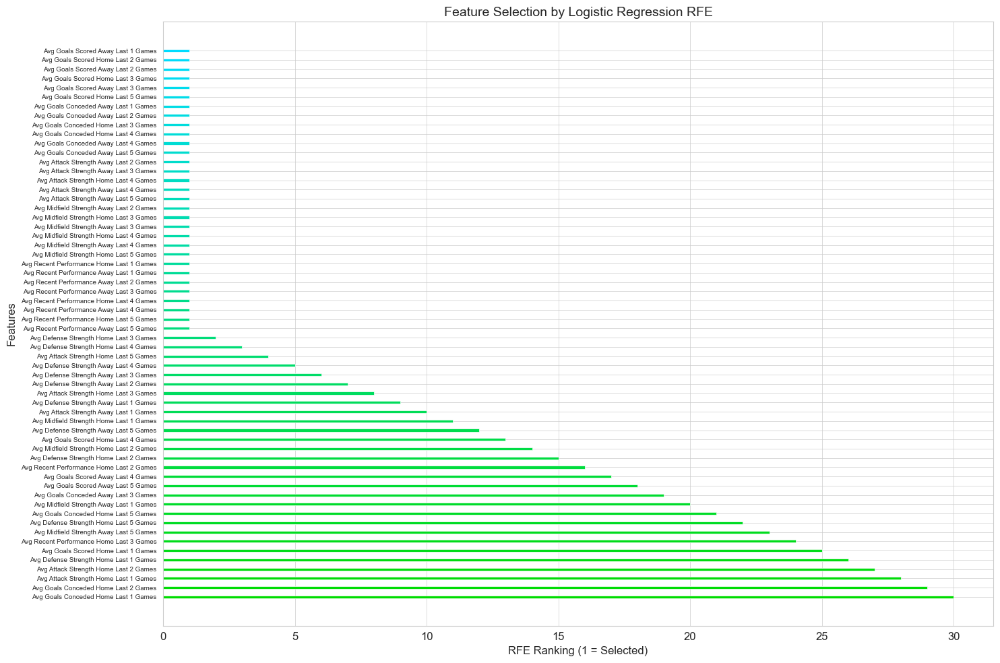

In [105]:
def recursive_feature_elimination_LR(df):
    # organise dataset into X (training examples) and y (targets)
    featuresToDrop = ['Date', 'Match Outcome', 'Home Team']
    assert set(featuresToDrop).issubset(df.columns), "Some columns in featuresToDrop are missing in df"
    data = df.drop(featuresToDrop, axis=1)
    target = df['Match Outcome']
    
    data = standardisation(data, terms=list(data.columns))
    
    # collect the feature names
    feature_names = list(data.columns)
        
    # perform RFE
    rfe = RFE(estimator=LogisticRegression(max_iter=500), n_features_to_select=number_of_components) # taken from PCA
    rfe.fit(data, target)
    
    # get feature rankings and selected features
    feature_ranking = rfe.ranking_
    selected_features = [feature for feature, rank in zip(feature_names, feature_ranking) if rank == 1]
    
    print("Selected Features by RFE (LR):")
    print(selected_features)
    
    # plot feature rankings
    plt.figure(figsize=(15, 10))
    sorted_features = sorted(zip(feature_names, feature_ranking), key=lambda x: x[1])
    sorted_names, sorted_ranks = zip(*sorted_features)

    # increase spacing between bars
    y_positions = np.arange(len(sorted_names)) * 2
    bar_height = 0.6

    # generate gradient colors from blue to green
    colors = [(0, 220/255, 1 - alpha) for alpha in np.linspace(0, 1, len(sorted_ranks))]

    # plot horizontal bar chart with gradient colors
    for ypos, rank, color in zip(y_positions, sorted_ranks, colors):
        plt.barh(ypos, rank, height=bar_height, color=color)

    plt.yticks(y_positions, sorted_names, fontsize=7)
    plt.xlabel("RFE Ranking (1 = Selected)", fontsize=12)
    plt.ylabel("Features", fontsize=12)
    plt.title("Feature Selection by Logistic Regression RFE", fontsize=14)

    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show() 
    
    return selected_features
            
    

logistic_features = recursive_feature_elimination_LR(df)

Next, we will look at feature selection methods for K Nearest Neighbours. As this model does not work with RFE, we will have to look at other methods. Predictions for KNN are based on the distance between data points and are therefore highly sensitive to redundant features. 

We will begin with Variance Thresholding (removing low variance features) and then apply a filter method Mutual Information (measuring non-linear relationships between the features and targets).

Variance Minimum:  0.013576172443849375  ---->  Variance Maximum:  0.19291592322287476


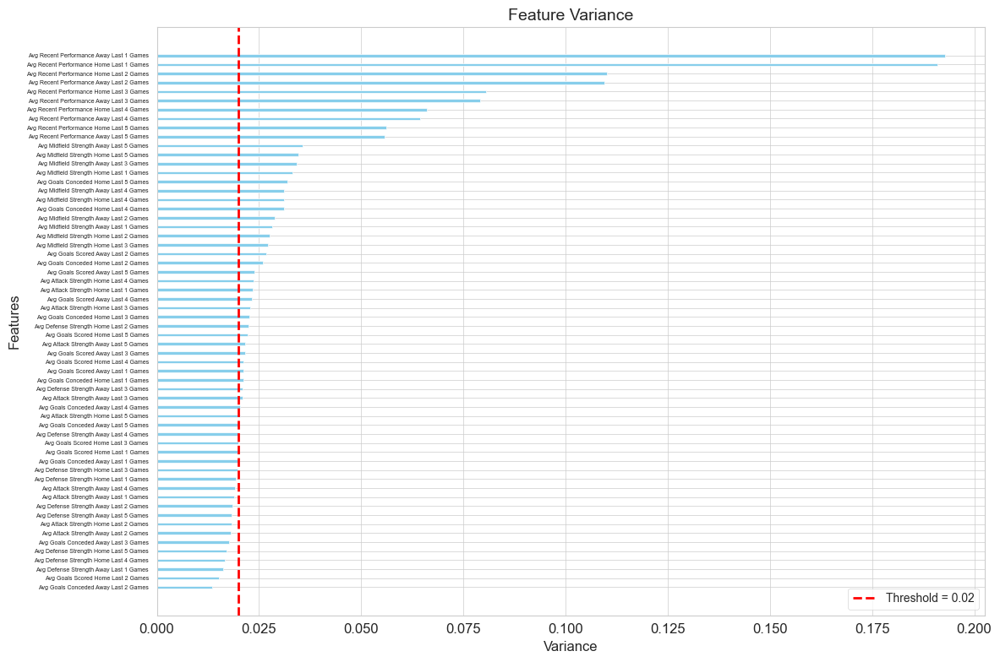

Reduced Data:  42 / 60

Removed Features and Their Variances:
---------------------------------------

Avg Defense Strength Away Last 4 Games    0.019936
Avg Goals Scored Home Last 3 Games        0.019916
Avg Goals Scored Home Last 1 Games        0.019838
Avg Goals Conceded Away Last 1 Games      0.019695
Avg Defense Strength Home Last 3 Games    0.019652
Avg Defense Strength Home Last 1 Games    0.019304
Avg Attack Strength Away Last 4 Games     0.019068
Avg Attack Strength Away Last 1 Games     0.018819
Avg Defense Strength Away Last 2 Games    0.018565
Avg Defense Strength Away Last 5 Games    0.018394
Avg Attack Strength Home Last 2 Games     0.018377
Avg Attack Strength Away Last 2 Games     0.018090
Avg Goals Conceded Away Last 3 Games      0.017666
Avg Defense Strength Home Last 5 Games    0.017037
Avg Defense Strength Home Last 4 Games    0.016667
Avg Defense Strength Away Last 1 Games    0.016143
Avg Goals Scored Home Last 2 Games        0.015106
Avg Goals Conceded Away Last 2

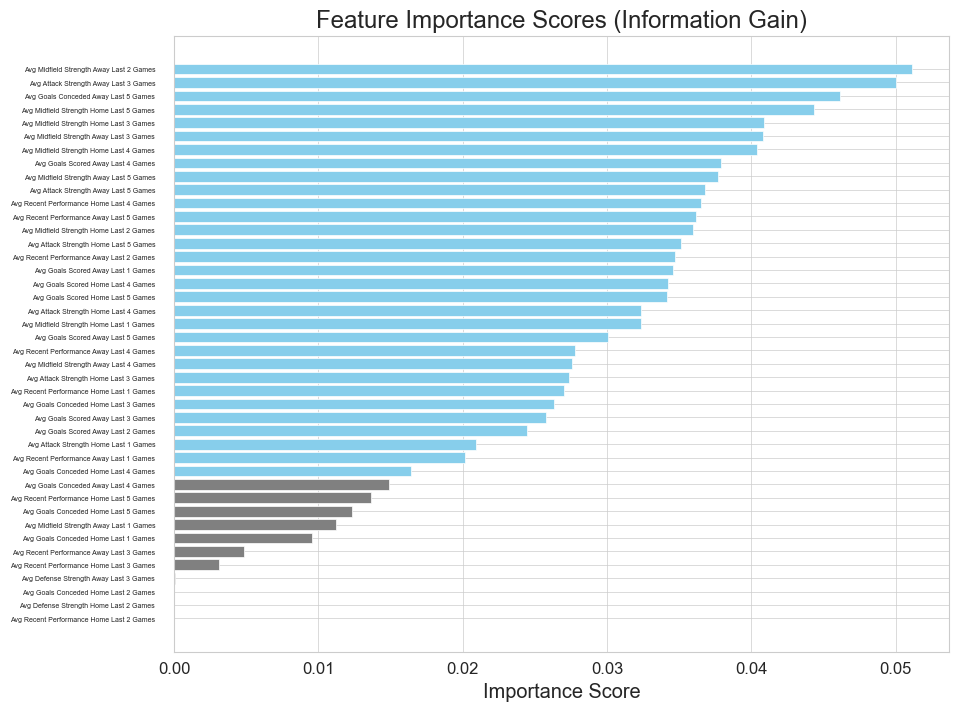


Selected Features for KNN:
['Avg Midfield Strength Away Last 2 Games', 'Avg Attack Strength Away Last 3 Games', 'Avg Goals Conceded Away Last 5 Games', 'Avg Midfield Strength Home Last 5 Games', 'Avg Midfield Strength Home Last 3 Games', 'Avg Midfield Strength Away Last 3 Games', 'Avg Midfield Strength Home Last 4 Games', 'Avg Goals Scored Away Last 4 Games', 'Avg Midfield Strength Away Last 5 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Recent Performance Home Last 4 Games', 'Avg Recent Performance Away Last 5 Games', 'Avg Midfield Strength Home Last 2 Games', 'Avg Attack Strength Home Last 5 Games', 'Avg Recent Performance Away Last 2 Games', 'Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 4 Games', 'Avg Goals Scored Home Last 5 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Goals Scored Away Last 5 Games', 'Avg Recent Performance Away Last 4 Games', 'Avg Midfield Strength Away Last 4 Games', 'Avg Attack St

In [106]:
def knn_feature_selection(df):
    
    # first step is calculating minimal variance features
    def variance_thresholding(data, threshold=0.02):
        variances = data.var()
        print("Variance Minimum: ", variances.min(), " ---->  Variance Maximum: ", variances.max())
    
        # filter features based on the threshold
        retained_features = variances[variances >= threshold].index
        reduced_data = data[retained_features]
        sorted_variances = variances.sort_values(ascending=False)

        # plot horizontal bar graph for feature variances
        plt.figure(figsize=(12, 8))
        y_positions = np.arange(len(sorted_variances)) * 3  # increase spacing between bars
        plt.barh(y_positions, sorted_variances, color='skyblue', height=1.0)
        plt.gca().invert_yaxis()
        
        # add a threshold line
        plt.axvline(x=threshold, color='red', linestyle='--', label=f'Threshold = {threshold}')
        
        plt.yticks(y_positions, sorted_variances.index, fontsize=5)
        plt.xlabel('Variance', fontsize=12)
        plt.ylabel('Features', fontsize=12)
        plt.title('Feature Variance', fontsize=14)
        plt.legend(fontsize=10)
        plt.tight_layout()
        plt.show()
        

        # print removed features and their variances
        removed_features = sorted_variances[sorted_variances < threshold]
        print("Reduced Data: ", len(reduced_data.columns), "/", len(data.columns))
        print("\nRemoved Features and Their Variances:")
        print("---------------------------------------\n")
        print(removed_features, "\n")
        
        return reduced_data
    
    # second step is mutual information between features and target
    def mutual_info(data, target):
        # apply information gain
        gain = mutual_info_regression(data, target)

        # dictionary of feature importance scores
        feature_names = list(data.columns)
        scores = {}
        for i in range(len(feature_names)):
            scores[feature_names[i]] = gain[i]

        # descending sort by importance score
        sorted_features = sorted(scores.items(), key=lambda x:x[1], reverse=True)

#         print("\nMutual Information Importance Score: ")
#         print("------------------------------------\n")
#         for feature, score in sorted_features:
#             print(f"{feature + ' score:':55}\t{score:.16f}")

        # plot a bar chat of feature importance scores
        fig, ax = plt.subplots(figsize=(10, 8))
        y_pos = np.arange(len(sorted_features))
        colours = ['skyblue' if i < number_of_components else 'gray' for i in range(len(sorted_features))]
        ax.barh(y_pos, [score for feature, score in sorted_features], align="center", color=colours)
        ax.set_yticks(y_pos)
        ax.set_yticklabels([feature for feature, score in sorted_features])
        ax.invert_yaxis()  # Labels read top-to-bottom
        ax.set_xlabel("Importance Score")
        ax.set_title("Feature Importance Scores (Information Gain)")
        ax.tick_params(axis="y", pad=10, labelsize=5)
        plt.show()
        
        # returns most important features
        selected_features = [feature for feature, _ in sorted_features[:number_of_components]]
        print("\nSelected Features for KNN:")
        print(selected_features)
        return selected_features
        
    
    # organise dataset into X (training examples) and y (targets)
    featuresToDrop = ['Date', 'Match Outcome', 'Home Team']
    assert set(featuresToDrop).issubset(df.columns), "Some columns in featuresToDrop are missing in df"
    data = df.drop(featuresToDrop, axis=1)
    
    # normalise the data to put all the variances on the same scale
    # otherwise the difference between variances would be 0.0558 to 8728992.4427
    data = normalisation(data, terms=list(data.columns))
    
    variance_data = variance_thresholding(data)
    
    # use label encoding on the target data, keep it discrete
    target = df['Match Outcome']
    target = label_encoding(target, dataframe=False)
    
    return mutual_info(variance_data, target)
    

knn_features = knn_feature_selection(df)

Next is Recursive Feature Engineering for SVM. It will be a repeat of the last function, this time using a SVM model for feature selection. 

Selected Features by RFE (SVM):
['Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 2 Games', 'Avg Goals Scored Away Last 2 Games', 'Avg Goals Scored Home Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Conceded Away Last 1 Games', 'Avg Goals Conceded Away Last 2 Games', 'Avg Goals Conceded Away Last 4 Games', 'Avg Attack Strength Away Last 2 Games', 'Avg Attack Strength Home Last 3 Games', 'Avg Attack Strength Away Last 3 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Attack Strength Away Last 4 Games', 'Avg Attack Strength Home Last 5 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Away Last 2 Games', 'Avg Midfield Strength Home Last 3 Games', 'Avg Midfield Strength Home Last 4 Games', 'Avg Midfield Strength Home Last 5 Games', 'Avg Midfield Strength Away Last 5 Games', 'Avg Defense Strength Home Last 3 Games', 'Avg Defense Strength Home Last 4 Games', 'Avg Defense Strength Away Last 4 Games', 'Avg Defense Strength Away La

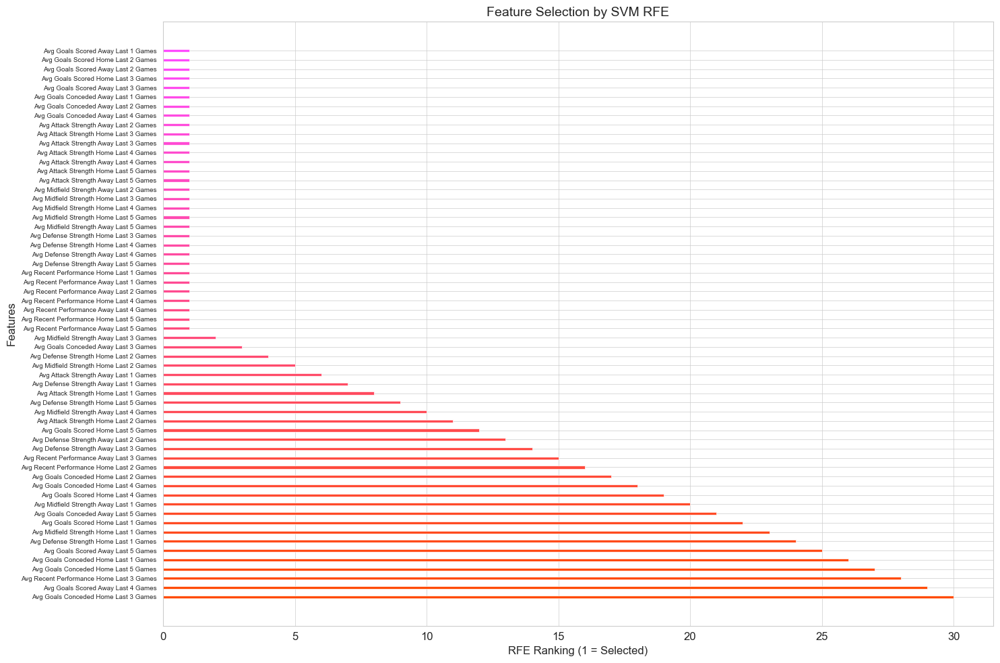

In [107]:
def recursive_feature_elimination_svm(df):
    # organise dataset into X (training examples) and y (targets)
    featuresToDrop = ['Date', 'Match Outcome', 'Home Team']
    assert set(featuresToDrop).issubset(df.columns), "Some columns in featuresToDrop are missing in df"
    data = df.drop(featuresToDrop, axis=1)
    target = df['Match Outcome']
    
    data = standardisation(data, terms=list(data.columns))
    
    # collect the feature names
    feature_names = list(data.columns)
        
    # perform RFE
    rfe = RFE(estimator=SVC(kernel="linear"), n_features_to_select=number_of_components) # taken from PCA
    rfe.fit(data, target)
    
    # get feature rankings and selected features
    feature_ranking = rfe.ranking_
    selected_features = [feature for feature, rank in zip(feature_names, feature_ranking) if rank == 1]
    
    print("Selected Features by RFE (SVM):")
    print(selected_features)
    
    # plot feature rankings
    plt.figure(figsize=(15, 10))
    sorted_features = sorted(zip(feature_names, feature_ranking), key=lambda x: x[1])
    sorted_names, sorted_ranks = zip(*sorted_features)

    # increase spacing between bars
    y_positions = np.arange(len(sorted_names)) * 2
    bar_height = 0.6

    # generate gradient colors from blue to green
    colors = [(1, 75/255, 1 - alpha) for alpha in np.linspace(0, 1, len(sorted_ranks))]

    # plot horizontal bar chart with gradient colors
    for ypos, rank, color in zip(y_positions, sorted_ranks, colors):
        plt.barh(ypos, rank, height=bar_height, color=color)

    plt.yticks(y_positions, sorted_names, fontsize=7)
    plt.xlabel("RFE Ranking (1 = Selected)", fontsize=12)
    plt.ylabel("Features", fontsize=12)
    plt.title("Feature Selection by SVM RFE", fontsize=14)

    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()
    
    return selected_features
            
    
svm_features = recursive_feature_elimination_svm(df)

For data to be used by an LSTM model, we must consider temporal dependencies during feature selection. First we will apply Mutual Information. MI measures the dependency between data and targets, capturing both linear and nonlinear relationships. LSTMs are sensitive to noise, so we should remove irrelevant features by using MI. We will then use RFE with a tree based model to rank the rest of the features. Tree based models excel at identifying patterns, which is useful for LSTMs. This allows the LSTM to focus on high-signal features. 

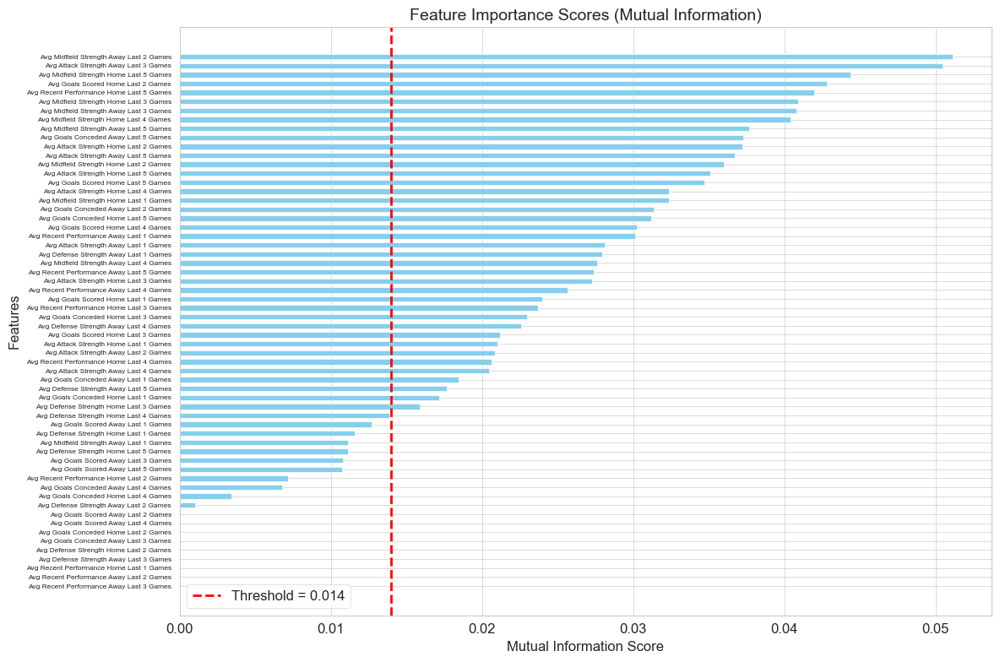


Selected Features based on Mutual Information Threshold: 40 / 60

Selected Features by RFE (RF):
['Avg Midfield Strength Away Last 2 Games', 'Avg Attack Strength Away Last 3 Games', 'Avg Midfield Strength Home Last 5 Games', 'Avg Recent Performance Home Last 5 Games', 'Avg Midfield Strength Home Last 3 Games', 'Avg Midfield Strength Away Last 3 Games', 'Avg Midfield Strength Home Last 4 Games', 'Avg Midfield Strength Away Last 5 Games', 'Avg Goals Conceded Away Last 5 Games', 'Avg Attack Strength Home Last 2 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Home Last 2 Games', 'Avg Attack Strength Home Last 5 Games', 'Avg Goals Scored Home Last 5 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Goals Conceded Home Last 5 Games', 'Avg Goals Scored Home Last 4 Games', 'Avg Attack Strength Away Last 1 Games', 'Avg Defense Strength Away Last 1 Games', 'Avg Midfield Strength Away Last 4 Games', 'Avg Recent Performance Aw

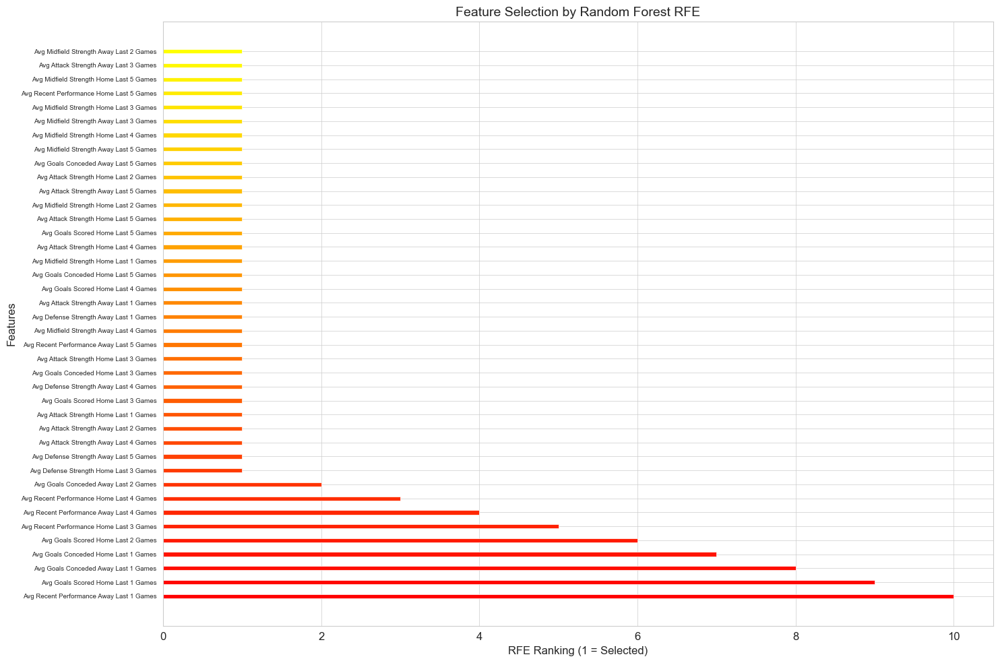

In [108]:
def lstm_feature_selection(df):
    # first applies mutual information and removes the redundant features
    def mutual_info(data, target, threshold=0.014):
        gain = mutual_info_regression(data, target)

        # dictionary of feature importance scores
        feature_names = list(data.columns)
        scores = {}
        for i in range(len(feature_names)):
            scores[feature_names[i]] = gain[i]

        # sort features by importance score in descending order
        sorted_features = sorted(scores.items(), key=lambda x: x[1], reverse=True)

        # plot a bar chart of feature importance scores
        fig, ax = plt.subplots(figsize=(12, 8))
        y_pos = np.arange(len(sorted_features))
        ax.barh(y_pos, [score for _, score in sorted_features], align="center", color="skyblue", height=0.6)
        ax.set_yticks(y_pos)
        ax.set_yticklabels([feature for feature, _ in sorted_features], fontsize=6)
        ax.invert_yaxis()
        ax.set_xlabel("Mutual Information Score", fontsize=12)
        ax.set_ylabel("Features", fontsize=12)
        ax.set_title("Feature Importance Scores (Mutual Information)", fontsize=14)
        plt.axvline(x=threshold, color="red", linestyle="--", label=f"Threshold = {threshold}")
        plt.legend()
        plt.tight_layout()
        plt.show()

        # filter features based on the threshold
        selected_features = [feature for feature, score in sorted_features if score >= threshold]
        print("\nSelected Features based on Mutual Information Threshold:", len(selected_features), "/", len(data.columns))

        return data[selected_features].copy()
    
    # perform tree based RFE on the remaining features
    def recursive_feature_elimination_RF(data, target):
        data = standardisation(data, terms=list(data.columns))

        # collect the feature names
        feature_names = list(data.columns)

        # perform RFE
        rfe = RFE(estimator=RandomForestClassifier(), n_features_to_select=number_of_components) # taken from PCA
        rfe.fit(data, target)

        # get feature rankings and selected features
        feature_ranking = rfe.ranking_
        selected_features = [feature for feature, rank in zip(feature_names, feature_ranking) if rank == 1]

        print("\nSelected Features by RFE (RF):")
        print(selected_features)

        # plot feature rankings
        plt.figure(figsize=(15, 10))
        sorted_features = sorted(zip(feature_names, feature_ranking), key=lambda x: x[1])
        sorted_names, sorted_ranks = zip(*sorted_features)

        # increase spacing between bars
        y_positions = np.arange(len(sorted_names)) * 2
        bar_height = 0.6

        # generate gradient colors from blue to green
        colors = [(1, 1 - alpha, 0) for alpha in np.linspace(0, 1, len(sorted_ranks))]

        # plot horizontal bar chart with gradient colors
        for ypos, rank, color in zip(y_positions, sorted_ranks, colors):
            plt.barh(ypos, rank, height=bar_height, color=color)

        plt.yticks(y_positions, sorted_names, fontsize=7)
        plt.xlabel("RFE Ranking (1 = Selected)", fontsize=12)
        plt.ylabel("Features", fontsize=12)
        plt.title("Feature Selection by Random Forest RFE", fontsize=14)

        plt.gca().invert_yaxis()
        plt.tight_layout()
        plt.show() 

        return selected_features
    
    
    # organise dataset into X (training examples) and y (targets)
    featuresToDrop = ['Date', 'Match Outcome', 'Home Team']
    assert set(featuresToDrop).issubset(df.columns), "Some columns in featuresToDrop are missing in df"
    data = df.drop(featuresToDrop, axis=1)
    
    # use label encoding on the target data, keep it discrete
    target = df['Match Outcome']
    target = label_encoding(target, dataframe=False)
    
    reduced_data = mutual_info(data, target)
    
    return recursive_feature_elimination_RF(reduced_data, target)


    
lstm_features = lstm_feature_selection(df)

Finally, we perform feature selection for Random Forest- we consider Variance Threshold, ANOVA F-value, and Mutual information.
    
Variance Threshold removes features with near-zero variance because RF performs poorly with constant or near-constant features - threshold of 0.01 removes features that are almost constant
    
ANOVA F-value measures the linear relationship between features and the target which is particularly useful for RF as it helps identify features that can be used for clean splits
    
Mutual Information - Captures both linear and non-linear relationships and complements F-test by finding non-linear patterns. Important for RF as it can utilize non-linear relationships in tree splits
    

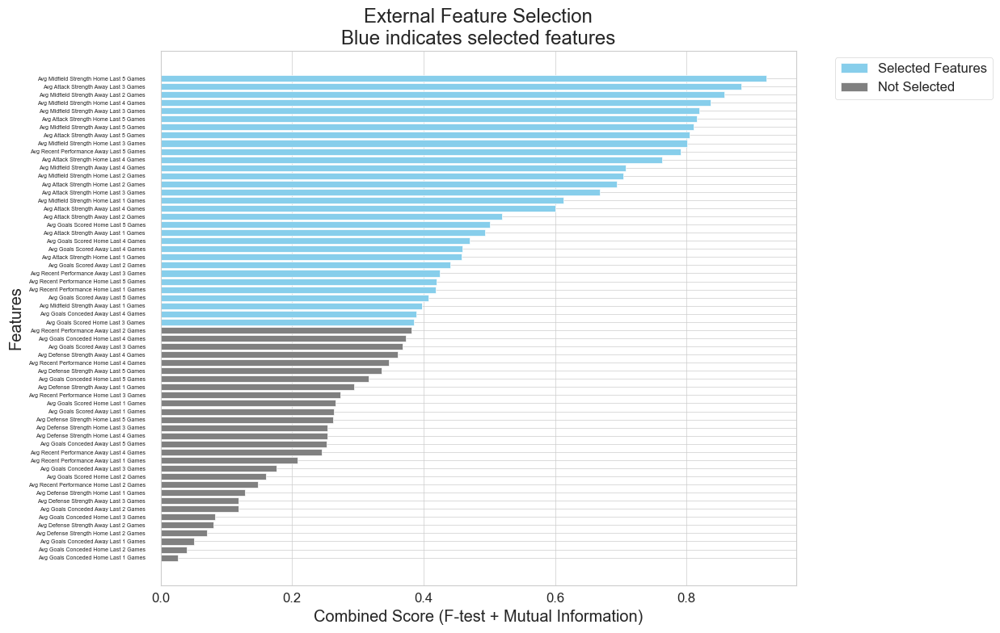


Selected 31 features that passed variance threshold
and had highest combined F-test and Mutual Information scores:
['Avg Midfield Strength Home Last 5 Games', 'Avg Attack Strength Away Last 3 Games', 'Avg Midfield Strength Away Last 2 Games', 'Avg Midfield Strength Home Last 4 Games', 'Avg Midfield Strength Away Last 3 Games', 'Avg Attack Strength Home Last 5 Games', 'Avg Midfield Strength Away Last 5 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Home Last 3 Games', 'Avg Recent Performance Away Last 5 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Midfield Strength Away Last 4 Games', 'Avg Midfield Strength Home Last 2 Games', 'Avg Attack Strength Home Last 2 Games', 'Avg Attack Strength Home Last 3 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Attack Strength Away Last 4 Games', 'Avg Attack Strength Away Last 2 Games', 'Avg Goals Scored Home Last 5 Games', 'Avg Attack Strength Away Last 1 Games', 'Avg Goals Scored Home Last 4 Games', 'Avg Go

In [109]:
def random_forest_external_selection(df):
    from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
    from sklearn.feature_selection import VarianceThreshold
    
    featuresToDrop = ['Date', 'Match Outcome', 'Home Team'] 
    assert set(featuresToDrop).issubset(df.columns), "Some columns in featuresToDrop are missing in df"
    data = df.drop(featuresToDrop, axis=1)
    target = df['Match Outcome'] 
    feature_names = list(data.columns)
    
    # 1. Variance Threshold
    selector_variance = VarianceThreshold(threshold=0.01)  # Remove features with low variance
    data_variance = selector_variance.fit_transform(data)
    variance_mask = selector_variance.get_support()
    
    # 2. ANOVA F-value
    selector_f = SelectKBest(score_func=f_classif, k=number_of_components)
    selector_f.fit(data, target)
    f_scores = selector_f.scores_
    
    # 3. Mutual Information
    selector_mi = SelectKBest(score_func=mutual_info_classif, k=number_of_components)
    selector_mi.fit(data, target)
    mi_scores = selector_mi.scores_
    
    # Combine results into DataFrame
    feature_scores = pd.DataFrame({
        'Feature': feature_names,
        'Variance_Selected': variance_mask,
        'F_Score': f_scores,
        'MI_Score': mi_scores
    })
    
    # Normalize F and MI scores to 0-1 range
    feature_scores['F_Score_Norm'] = (feature_scores['F_Score'] - feature_scores['F_Score'].min()) / \
                                   (feature_scores['F_Score'].max() - feature_scores['F_Score'].min())
    feature_scores['MI_Score_Norm'] = (feature_scores['MI_Score'] - feature_scores['MI_Score'].min()) / \
                                    (feature_scores['MI_Score'].max() - feature_scores['MI_Score'].min())
    
    # Calculate combined score
    feature_scores['Combined_Score'] = (feature_scores['F_Score_Norm'] + 
                                      feature_scores['MI_Score_Norm']) / 2
    
    # Sort by combined score
    feature_scores = feature_scores.sort_values('Combined_Score', ascending=False)
    
    # Select features that pass variance threshold and have highest combined scores
    final_selected = feature_scores[feature_scores['Variance_Selected']]\
        .head(number_of_components)['Feature'].tolist()
    
    plt.figure(figsize=(12, 8))
    
    colors = ['skyblue' if feature in final_selected else 'gray' 
             for feature in feature_scores['Feature']]
    
    plt.barh(feature_scores['Feature'], 
            feature_scores['Combined_Score'],
            color=colors)
    
    plt.xlabel('Combined Score (F-test + Mutual Information)')
    plt.ylabel('Features')
    plt.title('External Feature Selection\nBlue indicates selected features')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.tick_params(axis="y", pad=10, labelsize=5)
    
    # Add legend
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='skyblue', label='Selected Features'),
        Patch(facecolor='gray', label='Not Selected')
    ]
    plt.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.show()
    
    print(f"\nSelected {len(final_selected)} features that passed variance threshold")
    print("and had highest combined F-test and Mutual Information scores:")
    print(final_selected)
    
    return final_selected

rf_features = random_forest_external_selection(df)

# Model Training and Testing

## RDNBoost Implementation
Instead of manually building RDN based on domain expertise, we attempt to automaticaly discover them using mutual information scores, cross-validation, and statistical validation (`build_feature_rdn()`). These discovered relationships are stored in our RDN structure and used to engineer additional features (`create_relational_features()`). 

The original features and these engineered relational features are then combined and fed into XGBoost for the final prediction model, similar to the paper's approach. 

In [110]:

import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, KBinsDiscretizer
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import mutual_info_score
import xgboost as xgb

class RDNBoost:
    def __init__(self, n_iterations=50, learning_rate=0.3, max_depth=3,
                 mi_threshold=0.2, validation_threshold=0.2, use_feature_selection=True):
        self.n_iterations = n_iterations
        self.learning_rate = learning_rate
        self.max_depth = max_depth
        # threshhold for mutual info
        #self.mi_threshold = mi_threshold
        self.mi_threshold = 0.03

        #self.validation_threshold = validation_threshold
        self.validation_threshold = 0.03

        self.use_feature_selection = use_feature_selection

        self.feature_names = None
        self.selected_features = []
        self.rdn = {
            'direct_deps': {},
            'temporal_deps': {},
            'strengths': {}
        }
        # normalize features
        self.scaler = StandardScaler()
        self.discretizer = KBinsDiscretizer(n_bins=10, encode='ordinal', strategy='quantile')

        # was overgitting so muhc, so used heavy regularization
        self.xgb_model = xgb.XGBClassifier(
            n_estimators=n_iterations,
            learning_rate=0.15,           
            max_depth=3,                   
            objective='multi:softprob',
            num_class=3,
            subsample=0.8,              
            min_child_weight=25,          
            colsample_bytree=0.7,       
            colsample_bylevel=0.7,         
            colsample_bynode=0.7,     
            gamma=3,                       
            reg_alpha=5.0,                 
            reg_lambda=7.0,                
            scale_pos_weight=1,
            max_leaves=4,                 
            random_state=42
        )


    def calculate_mutual_info(self, X_feature, y):
        if isinstance(X_feature, pd.Series):
            X_feature = X_feature.values.reshape(-1, 1)
        elif len(X_feature.shape) == 1:
            X_feature = X_feature.reshape(-1, 1)

        X_discrete = self.discretizer.fit_transform(X_feature)
        return mutual_info_score(X_discrete.ravel(), y)

    def evaluate_feature(self, X_feature, y):
        if isinstance(X_feature, pd.Series):
            X_feature = X_feature.values

        if len(X_feature.shape) == 1:
            X_feature = X_feature.reshape(-1, 1)
        elif isinstance(X_feature, pd.DataFrame):
            X_feature = X_feature.values

        simple_model = DecisionTreeClassifier(
            max_depth=2,
            min_samples_leaf=20,
            min_samples_split=50,
            random_state=42
        )
        cv_scores = cross_val_score(simple_model, X_feature, y, cv=5)
        return np.mean(cv_scores)

    def evaluate_feature_combination(self, X_features, y):
        if isinstance(X_features, pd.DataFrame):
            X_features = X_features.values

        simple_model = DecisionTreeClassifier(
            max_depth=2,
            min_samples_leaf=20,
            min_samples_split=50,
            random_state=42
        )
        
        # Use cross_val_score instead of fitting directly
        cv_scores = cross_val_score(simple_model, X_features, y, cv=5)
        return np.mean(cv_scores)

    def _get_base_feature(self, feature_name):
        for indicator in ['Last', 'Avg', 'Recent']:
            if indicator in feature_name:
                return feature_name.split(indicator)[0].strip()
        return feature_name

    
    def build_feature_rdn(self, X_train, feature_names, y_train):
        self.feature_names = feature_names

        if not isinstance(X_train, pd.DataFrame):
            X_train = pd.DataFrame(X_train, columns=feature_names)

        # Initial split remains the same
        X_select, X_temp, y_select, y_temp = train_test_split(
            X_train, y_train, test_size=0.4, random_state=42)
        X_validate, X_test, y_validate, y_test = train_test_split(
            X_temp, y_temp, test_size=0.5, random_state=42)

        temporal_features = [f for f in feature_names if any(
            t in f for t in ['Last', 'Avg', 'Recent'])]

        # Use k-fold CV for feature selection
        kf = KFold(n_splits=5, shuffle=True, random_state=42)
        
        for feature in feature_names:
            mi_scores = []
            cv_scores = []
            
            for train_idx, val_idx in kf.split(X_select):
                X_fold, X_val = X_select.iloc[train_idx], X_select.iloc[val_idx]
                y_fold, y_val = y_select.iloc[train_idx], y_select.iloc[val_idx]
                
                # Calculate MI score
                mi_scores.append(self.calculate_mutual_info(X_fold[feature], y_fold))
                
                # Calculate validation score
                cv_scores.append(self.evaluate_feature(X_val[feature], y_val))

            mi_score = np.mean(mi_scores)
            cv_score = np.mean(cv_scores)
            cv_std = np.std(cv_scores)

            # Select features that are consistently good
            if (mi_score > self.mi_threshold and 
                cv_score > self.validation_threshold and 
                cv_std < 0.1):
                
                # Final validation on held-out set
                val_score = self.evaluate_feature(X_validate[feature], y_validate)
                if val_score > self.validation_threshold:
                    self.selected_features.append(feature)

        # Build feature relationships with cross-validation
        for feature in self.selected_features:
            self.rdn['direct_deps'][feature] = []
            self.rdn['temporal_deps'][feature] = []

            if feature in temporal_features:
                base_feature = self._get_base_feature(feature)
                if base_feature in self.selected_features:
                    self.rdn['temporal_deps'][feature].append(base_feature)

            n_deps = 0
            for other_feature in self.selected_features:
                if other_feature != feature and n_deps < 2:
                    cv_base_scores = []
                    cv_combined_scores = []
                    
                    for train_idx, val_idx in kf.split(X_select):
                        X_fold, X_val = X_select.iloc[train_idx], X_select.iloc[val_idx]
                        y_fold, y_val = y_select.iloc[train_idx], y_select.iloc[val_idx]
                        
                        base_score = self.evaluate_feature(X_val[feature], y_val)
                        combined_score = self.evaluate_feature_combination(
                            X_val[[feature, other_feature]], y_val)
                        
                        cv_base_scores.append(base_score)
                        cv_combined_scores.append(combined_score)
                    
                    avg_base_score = np.mean(cv_base_scores)
                    avg_combined_score = np.mean(cv_combined_scores)
                    combined_std = np.std(cv_combined_scores)

                    # Only add dependency if improvement is consistent
                    if (avg_combined_score > avg_base_score * 1.2 and 
                        combined_std < 0.1):
                        self.rdn['direct_deps'][feature].append(other_feature)
                        n_deps += 1
                        self.rdn['strengths'][(feature, other_feature)] = (
                            avg_combined_score - avg_base_score)

        return self

    def fit(self, X, y):
        if not isinstance(X, pd.DataFrame):
            if self.feature_names is None:
                self.feature_names = [f'feature_{i}' for i in range(X.shape[1])]
            X = pd.DataFrame(X, columns=self.feature_names)
        else:
            self.feature_names = list(X.columns)

        y_mapped = pd.Series(y).map({-1: 0, 0: 1, 1: 2}).values

        class_weights = compute_class_weight('balanced',
                                        classes=np.unique(y_mapped),
                                        y=y_mapped)
        sample_weights = class_weights[y_mapped]
        print(f"Class weights: {dict(zip(range(3), class_weights))}")

        if self.use_feature_selection:
            self.build_feature_rdn(X, self.feature_names, y)

            if len(self.selected_features) == 0:
                self.mi_threshold /= 2
                self.validation_threshold /= 2
                self.build_feature_rdn(X, self.feature_names, y)

        if len(self.selected_features) == 0:
            raise ValueError("No features were selected. Please check your feature selection criteria.")

        relational_features = self.create_relational_features(X, is_training=True)
        combined_features = np.hstack([X, relational_features])

        X_train, X_val, y_train, y_val = train_test_split(
            combined_features, y_mapped, test_size=0.3, random_state=42
        )

        # Simple fit without early stopping
        self.xgb_model.fit(
            X_train,
            y_train,
            sample_weight=sample_weights[:len(y_train)],
            eval_set=[(X_train, y_train), (X_val, y_val)],
            verbose=True
        )

        return self
        

    def create_relational_features(self, X, is_training=True):
        if not isinstance(X, pd.DataFrame):
            X = pd.DataFrame(X, columns=self.feature_names)

        if not self.selected_features:
            raise ValueError("No features have been selected. Ensure feature selection is enabled and fit() has been called.")

        if is_training:
            self.scaler.fit(X[self.selected_features])

        X_scaled = self.scaler.transform(X[self.selected_features])
        relational_features = np.zeros((X.shape[0], len(self.selected_features)))

        for i, feature in enumerate(self.selected_features):
            feature_deps = []

            if feature in self.rdn['direct_deps']:
                deps = self.rdn['direct_deps'][feature]
                if deps:
                    deps_idx = [self.selected_features.index(d) for d in deps]
                    weights = [self.rdn['strengths'].get((feature, d), 1.0)
                            for d in deps]
                    weighted_deps = np.average(X_scaled[:, deps_idx],
                                            weights=weights, axis=1)
                    feature_deps.append(weighted_deps)

            if feature in self.rdn['temporal_deps']:
                temp_deps = self.rdn['temporal_deps'][feature]
                if temp_deps:
                    temp_idx = [self.selected_features.index(d) for d in temp_deps]
                    temp_features = np.mean(X_scaled[:, temp_idx], axis=1)
                    feature_deps.append(temp_features)

            if feature_deps:
                combined = np.mean(feature_deps, axis=0)
                relational_features[:, i] = combined / (1 + 2 * np.abs(combined))

        return relational_features

    def predict(self, X):
        if not isinstance(X, pd.DataFrame):
            X = pd.DataFrame(X, columns=self.feature_names)

        relational_features = self.create_relational_features(X, is_training=False)
        combined_features = np.hstack([X, relational_features])

        predictions = self.xgb_model.predict(combined_features)
        return pd.Series(predictions).map({0: -1, 1: 0, 2: 1}).values

    def predict_proba(self, X):
        if not isinstance(X, pd.DataFrame):
            X = pd.DataFrame(X, columns=self.feature_names)

        relational_features = self.create_relational_features(X, is_training=False)
        combined_features = np.hstack([X, relational_features])
        return self.xgb_model.predict_proba(combined_features)

    def get_selected_features_df(self, X):
        if not self.selected_features:
            raise ValueError("No features have been selected. Ensure feature selection is enabled and fit() has been called.")
        
        return X[self.selected_features]

In [130]:
import numpy as np
import pandas as pd
from sklearn.base import BaseEstimator, ClassifierMixin
import xgboost as xgb
from collections import defaultdict
import networkx as nx
from typing import Dict, List, Tuple
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, KBinsDiscretizer
from sklearn.model_selection import KFold, train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import mutual_info_score

class RelationalDependencyNetwork:
    def __init__(self):
        """Initialize the RDN with improved feature processing"""
        self.network = nx.DiGraph()
        self.team_stats = defaultdict(lambda: defaultdict(list))
        self.team_relationships = defaultdict(lambda: defaultdict(list))
        self.seasonal_stats = defaultdict(lambda: defaultdict(dict))
        self.relationship_strengths = {}
        
        # Feature processing
        self.discretizer = KBinsDiscretizer(n_bins=10, encode='ordinal', strategy='quantile')
        self.scaler = StandardScaler()
        
        # Feature importance tracking
        self.feature_importance = defaultdict(float)

    
    def plot_network(self, min_games=2, figsize=(15, 10)):
        """Plot the network with relationship strengths shown by edge colors"""
        plt.figure(figsize=figsize)
        
        # Create a subgraph of only team nodes and their relationships
        team_graph = nx.Graph()
        
        # Add edges with weights based on number of matches played
        for (team1, team2), rel_data in self.relationship_strengths.items():
            if rel_data['recent_matches'] >= min_games:
                weight = rel_data['recent_matches']
                # Add historical advantage to edge attributes
                team_graph.add_edge(team1, team2, 
                                  weight=weight,
                                  advantage=rel_data['historical_advantage'])
        
        # Position nodes using spring layout
        pos = nx.spring_layout(team_graph, k=1, iterations=50)
        
        # Draw edges with color based on historical advantage
        edges = team_graph.edges()
        weights = [team_graph[u][v]['weight'] for u, v in edges]
        advantages = [team_graph[u][v]['advantage'] for u, v in edges]
        
        # Normalize weights for edge widths
        max_weight = max(weights) if weights else 1
        edge_widths = [2 * w / max_weight for w in weights]
        
        # Create colormap for advantages
        edge_colors = plt.cm.RdYlBu(np.array(advantages) * 0.5 + 0.5)  # Scale to [0,1]
        
        # Draw the network
        nx.draw_networkx_edges(team_graph, pos, 
                             width=edge_widths,
                             edge_color=edge_colors,
                             alpha=0.6)
        
        # Draw nodes
        nx.draw_networkx_nodes(team_graph, pos,
                             node_size=1000,
                             node_color='lightblue',
                             alpha=0.6)
        
        # Add labels
        nx.draw_networkx_labels(team_graph, pos, font_size=8)
        
        # Add colorbar
        sm = plt.cm.ScalarMappable(cmap=plt.cm.RdYlBu, 
                                  norm=plt.Normalize(vmin=-1, vmax=1))
        plt.colorbar(sm, label='Historical Advantage')
        
        plt.title('Team Relationship Network\nEdge width = Number of matches played\n'
                 'Edge color = Historical advantage')
        plt.axis('off')
        plt.tight_layout()
        plt.show()

        
    def evaluate_feature_importance(self, feature_values, y):
        """Evaluate feature importance using mutual information and cross-validation"""
        if len(feature_values) == 0:
            return 0.0
        
        feature_values = np.array(feature_values).reshape(-1, 1)
        X_discrete = self.discretizer.fit_transform(feature_values)
        return mutual_info_score(X_discrete.ravel(), y)
    
    def _calculate_historical_advantage(self, team1: str, team2: str) -> float:
        """Calculate historical advantage between teams"""
        matches = self.team_relationships[team1][team2]
        if not matches:
            return 0.0
        
        results = [m['result'] for m in matches]
        return np.mean(results)
    
    def _calculate_form(self, team: str, date: pd.Timestamp, window: int = 5) -> Dict:
        """Calculate recent form metrics with error handling"""
        recent_matches = [n for n in self.network.neighbors(team)
                        if self.network.nodes[n]['type'] == 'match' 
                        and self.network.nodes[n]['date'] < date]
        recent_matches = sorted(recent_matches, 
                            key=lambda x: self.network.nodes[x]['date'])[-window:]
        
        form_metrics = {}
        for stat_name in self.team_stats[team]:
            recent_stats = [self.team_stats[team][stat_name][i] 
                        for i in range(len(recent_matches))]
            if recent_stats:
                form_metrics[f'recent_{stat_name}_mean'] = np.mean(recent_stats)
                # Add error handling for trend calculation
                try:
                    if len(recent_stats) > 1:  # Need at least 2 points for trend
                        trend = np.polyfit(range(len(recent_stats)), recent_stats, 1)[0]
                        form_metrics[f'recent_{stat_name}_trend'] = trend
                    else:
                        form_metrics[f'recent_{stat_name}_trend'] = 0.0
                except (np.linalg.LinAlgError, ValueError):
                    form_metrics[f'recent_{stat_name}_trend'] = 0.0
        
        return form_metrics
    
    def _transform_features(self, X: pd.DataFrame) -> pd.DataFrame:
        """Transform features with relationship information and error handling"""
        features_list = []
        
        for idx, row in X.iterrows():
            try:
                match_features = {}
                
                # Get team-specific features
                home_features = self.rdn.get_team_features(row['Home Team'], row['Date'])
                away_features = self.rdn.get_team_features(row['Away Team'], row['Date'])
                
                # Add relationship strength features
                rel_strength = self.rdn.relationship_strengths.get(
                    (row['Home Team'], row['Away Team']), 
                    {'recent_matches': 0, 'historical_advantage': 0}
                )
                
                # Combine all features
                match_features.update({f'home_{k}': v for k, v in home_features.items()})
                match_features.update({f'away_{k}': v for k, v in away_features.items()})
                match_features.update(rel_strength)
                
                # Ensure all values are finite
                for k, v in match_features.items():
                    if not np.isfinite(v):
                        match_features[k] = 0.0
                
                features_list.append(match_features)
            except Exception as e:
                print(f"Error processing row {idx}: {e}")
                # Add a row of zeros if there's an error
                if features_list:
                    features_list.append({k: 0.0 for k in features_list[0].keys()})
                else:
                    continue
        
        df_features = pd.DataFrame(features_list)
        
        # Fill any remaining NaN values
        df_features = df_features.fillna(0.0)
        
        return df_features
    
    def _calculate_seasonal_stats(self, team: str, date: pd.Timestamp) -> Dict:
        """Calculate seasonal performance metrics"""
        season = date.year if date.month >= 8 else date.year - 1
        season_matches = [n for n in self.network.neighbors(team)
                         if self.network.nodes[n]['type'] == 'match' 
                         and self.network.nodes[n]['date'].year == season]
        
        seasonal_metrics = {}
        for stat_name in self.team_stats[team]:
            season_stats = [self.team_stats[team][stat_name][i] 
                          for i in range(len(season_matches))]
            if season_stats:
                seasonal_metrics[f'season_{stat_name}_mean'] = np.mean(season_stats)
        return seasonal_metrics

    def add_match_data(self, match_row: pd.Series):
        """Add match data with improved relationship tracking"""
        home_team = match_row['Home Team']
        away_team = match_row['Away Team']
        season = match_row['Season']
        date = match_row['Date']
        result = match_row['Match Outcome']
        
        # Add teams
        for team in [home_team, away_team]:
            if not self.network.has_node(team):
                self.network.add_node(team, type='team')
        
        # Add match node with extended attributes
        match_id = f"match_{date}_{home_team}_{away_team}"
        self.network.add_node(match_id, 
                            type='match',
                            date=date,
                            season=season,
                            result=result)
        
        # Add relationships with strengths
        self.network.add_edge(home_team, match_id, role='home')
        self.network.add_edge(away_team, match_id, role='away')
        
        # Store match statistics with validation
        for prefix in ['Home', 'Away']:
            team = match_row[f'{prefix} Team']
            for col in match_row.index:
                if col.startswith(prefix):
                    try:
                        stat_name = col.replace(f'{prefix} ', '')
                        value = float(match_row[col])
                        self.team_stats[team][stat_name].append(value)
                    except (ValueError, TypeError):
                        continue
        
        # Update relationship strengths
        self.relationship_strengths[(home_team, away_team)] = {
            'recent_matches': len(self.team_relationships[home_team][away_team]),
            'historical_advantage': self._calculate_historical_advantage(home_team, away_team)
        }
        
        # Store head-to-head relationship
        self.team_relationships[home_team][away_team].append({
            'date': date,
            'result': result,
            'season': season
        })

    def get_team_features(self, team: str, date: pd.Timestamp, lookback: int = 5) -> Dict:
        """Get team features with cross-validation and importance weighting"""
        features = {}
        
        # Get basic stats
        team_matches = [n for n in self.network.neighbors(team)
                       if self.network.nodes[n]['type'] == 'match' 
                       and self.network.nodes[n]['date'] < date]
        recent_matches = sorted(team_matches, 
                              key=lambda x: self.network.nodes[x]['date'])[-lookback:]
        
        # Calculate stats with cross-validation
        kf = KFold(n_splits=5, shuffle=True, random_state=42)
        
        for stat_name in self.team_stats[team]:
            recent_stats = [self.team_stats[team][stat_name][i] 
                          for i in range(len(recent_matches))]
            if recent_stats:
                features[f'avg_{stat_name}'] = np.mean(recent_stats)
                features[f'std_{stat_name}'] = np.std(recent_stats)
        
        # Add form and seasonal features
        features.update(self._calculate_form(team, date, window=lookback))
        features.update(self._calculate_seasonal_stats(team, date))
        
        return features

class RDNBoost(BaseEstimator, ClassifierMixin):
    def __init__(self, n_iterations=200, learning_rate=0.05, max_depth=4):
        self.n_iterations = n_iterations
        self.learning_rate = learning_rate
        self.max_depth = max_depth
        self.rdn = RelationalDependencyNetwork()
        
        # Improved XGBoost configuration
        self.xgb_model = xgb.XGBClassifier(
            n_estimators=n_iterations,
            learning_rate=learning_rate,
            max_depth=max_depth,
            objective='multi:softprob',
            num_class=3,
            subsample=0.8,
            min_child_weight=25,
            colsample_bytree=0.7,
            colsample_bylevel=0.7,
            colsample_bynode=0.7,
            gamma=3,
            reg_alpha=2.0,
            reg_lambda=2.0,
            scale_pos_weight=1,
            max_leaves=8,
            random_state=42
        )
        
    def fit(self, X: pd.DataFrame, y: pd.Series):
        """Fit the model with improved feature processing and class balancing"""
        # Build the relational network
        for idx, row in X.iterrows():
            self.rdn.add_match_data(row)
        
        # Generate relational features
        X_transformed = self._transform_features(X)
        
        # Transform target and compute class weights
        y_transformed = y + 1  # Convert from [-1,0,1] to [0,1,2]
        class_weights = compute_class_weight('balanced',
                                           classes=np.unique(y_transformed),
                                           y=y_transformed)
        sample_weights = class_weights[y_transformed]
        
        # Split for validation
        X_train, X_val, y_train, y_val = train_test_split(
            X_transformed, y_transformed, test_size=0.2, random_state=42
        )
        
        # Fit with sample weights and validation
        self.xgb_model.fit(
            X_train, y_train,
            sample_weight=sample_weights[:len(y_train)],
            eval_set=[(X_val, y_val)],
            verbose=True
        )
        
        return self
    
    def predict(self, X: pd.DataFrame) -> np.ndarray:
        """Make predictions with proper scaling"""
        X_transformed = self._transform_features(X)
        predictions = self.xgb_model.predict(X_transformed)
        return predictions - 1  # Convert back to [-1,0,1]
    
    def predict_proba(self, X: pd.DataFrame) -> np.ndarray:
        """Make probability predictions"""
        X_transformed = self._transform_features(X)
        return self.xgb_model.predict_proba(X_transformed)
    
    def _transform_features(self, X: pd.DataFrame) -> pd.DataFrame:
        """Transform features with relationship information"""
        features_list = []
        
        for idx, row in X.iterrows():
            match_features = {}
            
            # Get team-specific features
            home_features = self.rdn.get_team_features(row['Home Team'], row['Date'])
            away_features = self.rdn.get_team_features(row['Away Team'], row['Date'])
            
            # Add relationship strength features
            rel_strength = self.rdn.relationship_strengths.get(
                (row['Home Team'], row['Away Team']), 
                {'recent_matches': 0, 'historical_advantage': 0}
            )
            
            # Combine all features
            match_features.update({f'home_{k}': v for k, v in home_features.items()})
            match_features.update({f'away_{k}': v for k, v in away_features.items()})
            match_features.update(rel_strength)
            
            features_list.append(match_features)
        
        return pd.DataFrame(features_list)



In [131]:
class RecencyModelTrainingNew:
    def __init__(self):
        pass

    from sklearn.feature_selection import SelectFromModel, RFE
    from sklearn.ensemble import RandomForestClassifier
    import numpy as np
    from sklearn.metrics import accuracy_score, precision_recall_fscore_support
    # logistic regression model
    def train_with_iterations(self, X_train, y_train, X_test, y_test, iterations):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        for max_iter in iterations:
            model = LogisticRegression(
                multi_class='multinomial', solver='lbfgs', max_iter=max_iter,
                random_state=31
            )
            model.fit(X_train, y_train)

            train_predictions = model.predict(X_train)
            test_predictions = model.predict(X_test)

            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics
    
    
    # logistic regression model with LASSO regression - regularisation strength C
    def train_with_iterations_l1(self, X_train, y_train, X_test, y_test, iterations, C=1.0):        
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }
        
        feature_names = list(X_train.columns)
        selected_features = []

        for max_iter in iterations:
            model = LogisticRegression(
                penalty='l1', solver='liblinear', max_iter=max_iter, C=C, random_state=31
            )
            model.fit(X_train, y_train)

            train_predictions = model.predict(X_train)
            test_predictions = model.predict(X_test)

            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

            # get selected features (non-zero coefficients)
            non_zero_indices = np.where(model.coef_[0] != 0)[0]
            selected_features = [feature_names[i] for i in non_zero_indices if "Home Team" not in feature_names[i]]
            #print(f"Selected Features (max_iter={max_iter}): {selected_features}\n")

        print(f"Logistic Regression => LASSO Regularisation Selected Features (max_iter={iterations[-1]}): {selected_features}\n")

        return metrics
    
    
    # logistic regression model with Ridge regression - regularisation strength C
    def train_with_iterations_l2(self, X_train, y_train, X_test, y_test, iterations, C=1.0):        
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }
        
        feature_names = list(X_train.columns)

        for max_iter in iterations:
            model = LogisticRegression(
                penalty='l2', solver='lbfgs', max_iter=max_iter, C=C, random_state=31
            )
            model.fit(X_train, y_train)

            train_predictions = model.predict(X_train)
            test_predictions = model.predict(X_test)

            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        print(f"Logistic Regression => Ridge Regression Selected Features (max_iter={iterations[-1]}): Every feature. Just different weights.")
            
        return metrics
    
    
    #  logistic regression model with Elastic Net regularisation - regularisation strength C
    def train_with_iterations_l1_l2(self, X_train, y_train, X_test, y_test, iterations, C=1.0, l1_ratio=0.5):        
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }
        
        feature_names = list(X_train.columns)
        selected_features = []

        for max_iter in iterations:
            model = LogisticRegression(
                penalty='elasticnet', solver='saga', max_iter=max_iter, C=C, 
                l1_ratio=l1_ratio, random_state=31
            )
            model.fit(X_train, y_train)

            train_predictions = model.predict(X_train)
            test_predictions = model.predict(X_test)

            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

            # Get selected features (non-zero coefficients)
            non_zero_indices = np.where(model.coef_[0] != 0)[0]
            selected_features = [feature_names[i] for i in non_zero_indices if "Home Team" not in feature_names[i]]
        
        print(f"Logistic Regression => Elastic Net Selected Features (max_iter={iterations[-1]}): {selected_features}\n")
        return metrics

    
    # k nearest neighbours model
    def train_and_evaluate_knn(self, X_train, y_train, X_test, y_test, neighbors_range):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        for n_neighbors in neighbors_range:
            knn = KNeighborsClassifier(n_neighbors=n_neighbors)
            knn.fit(X_train, y_train)

            train_predictions = knn.predict(X_train)
            test_predictions = knn.predict(X_test)

            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics

    
    # support vector machine model
    def train_and_evaluate_svm(self, X_train, y_train, X_test, y_test, C_range=[0.1, 0.5, 1.0, 2.0, 5.0, 10.0]):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        for C in C_range:
            svm = SVC(kernel='linear', C=C, random_state=31)
            svm.fit(X_train, y_train)

            train_predictions = svm.predict(X_train)
            test_predictions = svm.predict(X_test)

            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics, C_range
    
    
    # support vector model with l1 regression - regularisation strength C
    def train_and_evaluate_svm_l1(self, X_train, y_train, X_test, y_test, C_range=[0.1, 0.5, 1.0, 2.0, 5.0, 10.0]):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        for C in C_range:
            svm = LinearSVC(penalty='l1', dual=False, C=C, random_state=31)
            svm.fit(X_train, y_train)

            train_predictions = svm.predict(X_train)
            test_predictions = svm.predict(X_test)

            # print selected features
            feature_names = X_train.columns
            selected_features = [feature_names[i] for i in range(len(feature_names)) if svm.coef_[0, i] != 0 and "Home Team" not in feature_names[i]]
            original_feature_num = len([col for col in list(X_train.columns) if "Home Team" not in col])
            print(f"SVM => Selected Features with L1 Regularization (C={C}): {len(selected_features)}/{original_feature_num}\n\n{selected_features}\n")

            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics, C_range
    
    
    # support vector model with l2 regression - regularisation strength C
    def train_and_evaluate_svm_l2(self, X_train, y_train, X_test, y_test, C_range=[0.1, 0.5, 1.0, 2.0, 5.0, 10.0]):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        for C in C_range:
            # SVM with L2 regularization
            svm = LinearSVC(penalty='l2', dual=True, C=C, random_state=31)
            svm.fit(X_train, y_train)

            train_predictions = svm.predict(X_train)
            test_predictions = svm.predict(X_test)

            print(f"SVM => Selected Features with L2 Regularisation (C={C}): Every feature. Just different weights.")
            
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics, C_range


    def train_and_evaluate_lstm(self, X_train, y_train, X_test, y_test, max_epochs=10):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        # Prepare data once
        y_train_one_hot = to_categorical(y_train, num_classes=3)
        y_test_one_hot = to_categorical(y_test, num_classes=3)
        X_train_reshaped = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
        X_test_reshaped = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

        # Base LSTM model
        lstm_model = Sequential([
            LSTM(64, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]), return_sequences=True),
            LSTM(64, return_sequences=False),
            Dense(3, activation='softmax')
        ])
        
        lstm_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

        # Train and evaluate after each epoch
        for _ in range(max_epochs):
            lstm_model.fit(X_train_reshaped, y_train_one_hot, epochs=1, batch_size=32, verbose=1)
            train_predictions = lstm_model.predict(X_train_reshaped).argmax(axis=1)
            test_predictions = lstm_model.predict(X_test_reshaped).argmax(axis=1)
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics, range(1, max_epochs + 1)

    def train_and_evaluate_lstm_l1(self, X_train, y_train, X_test, y_test, max_epochs=10, l1_penalty=0.01):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        # Prepare data
        y_train_one_hot = to_categorical(y_train, num_classes=3)
        y_test_one_hot = to_categorical(y_test, num_classes=3)
        X_train_reshaped = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
        X_test_reshaped = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

        # L1 regularized LSTM
        lstm_model = Sequential([
            LSTM(64, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]), 
                return_sequences=True, kernel_regularizer=regularizers.l1(l1_penalty)),
            LSTM(64, return_sequences=False, kernel_regularizer=regularizers.l1(l1_penalty)),
            Dense(3, activation='softmax')
        ])
        
        lstm_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

        # Train and evaluate
        for _ in range(max_epochs):
            lstm_model.fit(X_train_reshaped, y_train_one_hot, epochs=1, batch_size=32, verbose=1)
            train_predictions = lstm_model.predict(X_train_reshaped).argmax(axis=1)
            test_predictions = lstm_model.predict(X_test_reshaped).argmax(axis=1)
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics, range(1, max_epochs + 1)

    def train_and_evaluate_lstm_l2(self, X_train, y_train, X_test, y_test, max_epochs=10, l2_penalty=0.01):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        # Prepare data
        y_train_one_hot = to_categorical(y_train, num_classes=3)
        y_test_one_hot = to_categorical(y_test, num_classes=3)
        X_train_reshaped = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
        X_test_reshaped = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

        # L2 regularized LSTM
        lstm_model = Sequential([
            LSTM(64, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]), 
                return_sequences=True, kernel_regularizer=regularizers.l2(l2_penalty)),
            LSTM(64, return_sequences=False, kernel_regularizer=regularizers.l2(l2_penalty)),
            Dense(3, activation='softmax')
        ])
        
        lstm_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

        # Train and evaluate
        for _ in range(max_epochs):
            lstm_model.fit(X_train_reshaped, y_train_one_hot, epochs=1, batch_size=32, verbose=1)
            train_predictions = lstm_model.predict(X_train_reshaped).argmax(axis=1)
            test_predictions = lstm_model.predict(X_test_reshaped).argmax(axis=1)
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics, range(1, max_epochs + 1)

    def train_and_evaluate_lstm_l1_l2(self, X_train, y_train, X_test, y_test, max_epochs=10, l1_l2_penalty=0.01):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        # Prepare data
        y_train_one_hot = to_categorical(y_train, num_classes=3)
        y_test_one_hot = to_categorical(y_test, num_classes=3)
        X_train_reshaped = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
        X_test_reshaped = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

        # L1L2 regularized LSTM
        lstm_model = Sequential([
            LSTM(64, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]), 
                return_sequences=True, kernel_regularizer=regularizers.l1_l2(l1=l1_l2_penalty, l2=l1_l2_penalty)),
            LSTM(64, return_sequences=False, kernel_regularizer=regularizers.l1_l2(l1=l1_l2_penalty, l2=l1_l2_penalty)),
            Dense(3, activation='softmax')
        ])
        
        lstm_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

        # Train and evaluate
        for _ in range(max_epochs):
            lstm_model.fit(X_train_reshaped, y_train_one_hot, epochs=1, batch_size=32, verbose=1)
            train_predictions = lstm_model.predict(X_train_reshaped).argmax(axis=1)
            test_predictions = lstm_model.predict(X_test_reshaped).argmax(axis=1)
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics, range(1, max_epochs + 1)

    def train_and_evaluate_lstm_dropout(self, X_train, y_train, X_test, y_test, max_epochs=10, dropout_rate=0.2):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        # Prepare data
        y_train_one_hot = to_categorical(y_train, num_classes=3)
        y_test_one_hot = to_categorical(y_test, num_classes=3)
        X_train_reshaped = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
        X_test_reshaped = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

        # Dropout LSTM
        lstm_model = Sequential([
            LSTM(64, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]), return_sequences=True),
            Dropout(dropout_rate),
            LSTM(64, return_sequences=False),
            Dropout(dropout_rate),
            Dense(3, activation='softmax')
        ])
        
        lstm_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

        # Train and evaluate
        for _ in range(max_epochs):
            lstm_model.fit(X_train_reshaped, y_train_one_hot, epochs=1, batch_size=32, verbose=1)
            train_predictions = lstm_model.predict(X_train_reshaped).argmax(axis=1)
            test_predictions = lstm_model.predict(X_test_reshaped).argmax(axis=1)
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics, range(1, max_epochs + 1)
    def train_and_evaluate_rdnboost(self, X_train, y_train, X_test, y_test, n_iterations_range=range(10, 210, 10)):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }
        
        feature_counts = []  # Track number of selected features
        rdn_structures = []  # Track RDN structures

        for n_iter in n_iterations_range:
            model = RDNBoost(n_iterations=100, learning_rate=0.15, max_depth=3)

            try:
                # First build RDN structure and select features
                if isinstance(X_train, pd.DataFrame):
                    feature_names = X_train.columns
                else:
                    feature_names = [f'feature_{i}' for i in range(X_train.shape[1])]
                    
                model.build_feature_rdn(X_train, feature_names, y_train)
                
                # Store feature selection results
                feature_counts.append(len(model.selected_features))
                rdn_structures.append({
                    'selected_features': model.selected_features.copy(),
                    'direct_deps': model.rdn['direct_deps'].copy(),
                    'temporal_deps': model.rdn['temporal_deps'].copy(),
                    'strengths': model.rdn['strengths'].copy()
                })

                # Train the model
                model.fit(X_train, y_train)

                # Get predictions
                train_predictions = model.predict(X_train)
                test_predictions = model.predict(X_test)

                # Compute metrics
                self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

                # Print information for this iteration
                print(f"\nIteration {n_iter}:")
                print(f"Number of selected features: {len(model.selected_features)}")
                print(f"Selected features: {model.selected_features}")
                print(f"Test accuracy: {metrics['test_accuracy'][-1]:.4f}")
                
                # Print some RDN structure information
                print("\nDirect Dependencies:")
                for feat in model.rdn['direct_deps']:
                    if model.rdn['direct_deps'][feat]:
                        print(f"{feat} -> {model.rdn['direct_deps'][feat]}")
                
                print("\nTemporal Dependencies:")
                for feat in model.rdn['temporal_deps']:
                    if model.rdn['temporal_deps'][feat]:
                        print(f"{feat} -> {model.rdn['temporal_deps'][feat]}")

            except ValueError as e:
                print(f"Warning at iteration {n_iter}: {str(e)}")
                # Fill metrics with None or previous value to maintain alignment
                for metric_list in metrics.values():
                    if len(metric_list) > 0:
                        metric_list.append(metric_list[-1])
                    else:
                        metric_list.append(None)
                feature_counts.append(None)
                rdn_structures.append(None)
                continue

        # Add feature selection information to the return values
        return metrics, n_iterations_range, {
            'feature_counts': feature_counts,
            'rdn_structures': rdn_structures
        }
       
    from sklearn.utils.class_weight import compute_sample_weight

    def train_and_evaluate_rf(self, X_train, y_train, X_test, y_test, n_estimators_range=[10, 50, 100, 150, 200, 250, 300]):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }
        
        for n_estimators in n_estimators_range:
            # Basic Random Forest without any feature selection
            rf = self.RandomForestClassifier(
                n_estimators=n_estimators,
                max_depth=4,
                min_samples_split=50,
                min_samples_leaf=25,
                max_features='sqrt',
                class_weight='balanced',
                random_state=42
            )
            rf.fit(X_train, y_train)
            
            train_predictions = rf.predict(X_train)
            test_predictions = rf.predict(X_test)
            
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)
        
        return metrics, n_estimators_range

    def train_and_evaluate_rf_importance(self, X_train, y_train, X_test, y_test, n_estimators_range=[10, 50, 100, 150, 200, 250, 300]):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }
        
        for n_estimators in n_estimators_range:
            # Train initial RF to get feature importances
            rf = self.RandomForestClassifier(
                n_estimators=n_estimators,
                max_depth=4,
                min_samples_split=50,
                min_samples_leaf=25,
                max_features='sqrt',
                class_weight='balanced',
                random_state=42
            )
            rf.fit(X_train, y_train)
            
            # Get feature importances
            importances = rf.feature_importances_
            feature_importance = pd.DataFrame({
                'feature': X_train.columns,
                'importance': importances
            })
            feature_importance = feature_importance.sort_values('importance', ascending=False)
            
            # Select top features
            top_features = feature_importance.head(number_of_components)['feature'].tolist()
            print(f"\nRandom Forest => Top {number_of_components} Important Features (n_estimators={n_estimators}):")
            for feat, imp in zip(feature_importance.head(number_of_components)['feature'], 
                            feature_importance.head(number_of_components)['importance']):
                print(f"{feat}: {imp:.4f}")
            
            # Train final model with selected features
            X_train_selected = X_train[top_features]
            X_test_selected = X_test[top_features]
            
            final_rf = self.RandomForestClassifier(
                n_estimators=n_estimators,
                max_depth=4,
                min_samples_split=50,
                min_samples_leaf=25,
                max_features='sqrt',
                class_weight='balanced',
                random_state=42
            )
            final_rf.fit(X_train_selected, y_train)
            
            train_predictions = final_rf.predict(X_train_selected)
            test_predictions = final_rf.predict(X_test_selected)
            
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)
            
            # Optional: Plot feature importances for the last iteration
            if n_estimators == n_estimators_range[-1]:
                plt.figure(figsize=(10, 6))
                plt.bar(range(len(importances)), importances)
                plt.xticks(range(len(importances)), X_train.columns, rotation=90)
                plt.title(f'Feature Importances (n_estimators={n_estimators})')
                plt.tight_layout()
                plt.show()
        
        return metrics, n_estimators_range

    def train_and_evaluate_rf_selectfrommodel(self, X_train, y_train, X_test, y_test, n_estimators_range=[10, 50, 100, 150, 200, 250, 300]):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }
        
        for n_estimators in n_estimators_range:
            # SelectFromModel Method with regularized RF
            base_rf = self.RandomForestClassifier(
                n_estimators=n_estimators,
                max_depth=4,
                min_samples_split=50,
                min_samples_leaf=25,
                max_features='sqrt',
                class_weight='balanced',
                random_state=42
            )
            
            selector = self.SelectFromModel(
                base_rf,
                max_features=number_of_components,
                threshold=-self.np.inf
            )
            selector.fit(X_train, y_train)
            
            selected_features = X_train.columns[selector.get_support()].tolist()
            print(f"Random Forest => Selected Features with SelectFromModel (n_estimators={n_estimators}): {len(selected_features)}")
            print(selected_features)
            
            # Train and evaluate with selected features
            X_train_selected = X_train[selected_features]
            X_test_selected = X_test[selected_features]
            
            final_rf = self.RandomForestClassifier(
                n_estimators=n_estimators,
                max_depth=4,
                min_samples_split=50,
                min_samples_leaf=25,
                max_features='sqrt',
                class_weight='balanced',
                random_state=42
            )
            final_rf.fit(X_train_selected, y_train)
            
            train_predictions = final_rf.predict(X_train_selected)
            test_predictions = final_rf.predict(X_test_selected)
            
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)
        
        return metrics, n_estimators_range

    def train_and_evaluate_rf_rfe(self, X_train, y_train, X_test, y_test, n_estimators_range=[10, 50, 100, 150, 200, 250, 300]):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }
        
        for n_estimators in n_estimators_range:
            # Recursive Feature Elimination with regularized RF
            base_rf = self.RandomForestClassifier(
                n_estimators=n_estimators,
                max_depth=4,
                min_samples_split=50,
                min_samples_leaf=25,
                max_features='sqrt',
                class_weight='balanced',
                random_state=42
            )
            
            rfe = self.RFE(
                estimator=base_rf,
                n_features_to_select=number_of_components
            )
            rfe.fit(X_train, y_train)
            
            selected_features = X_train.columns[rfe.support_].tolist()
            print(f"Random Forest => Selected Features with RFE (n_estimators={n_estimators}): {len(selected_features)}")
            print(selected_features)
            
            # Train and evaluate with selected features
            X_train_selected = X_train[selected_features]
            X_test_selected = X_test[selected_features]
            
            final_rf = self.RandomForestClassifier(
                n_estimators=n_estimators,
                max_depth=4,
                min_samples_split=50,
                min_samples_leaf=25,
                max_features='sqrt',
                class_weight='balanced',
                random_state=42
            )
            final_rf.fit(X_train_selected, y_train)
            
            train_predictions = final_rf.predict(X_train_selected)
            test_predictions = final_rf.predict(X_test_selected)
            
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)
        
        return metrics, n_estimators_range  
    
    def _compute_metrics(self, metrics, train_predictions, test_predictions, y_train, y_test):
        train_accuracy = accuracy_score(y_train, train_predictions)
        test_accuracy = accuracy_score(y_test, test_predictions)

        metrics['train_accuracy'].append(train_accuracy)
        metrics['test_accuracy'].append(test_accuracy)

        metrics['train_rmse'].append(np.sqrt(np.mean((y_train - train_predictions) ** 2)))
        metrics['test_rmse'].append(np.sqrt(np.mean((y_test - test_predictions) ** 2)))

        train_precision, train_recall, train_f1, _ = precision_recall_fscore_support(
            y_train, train_predictions, average='weighted'
        )
        test_precision, test_recall, test_f1, _ = precision_recall_fscore_support(
            y_test, test_predictions, average='weighted'
        )

        metrics['train_precision'].append(train_precision)
        metrics['test_precision'].append(test_precision)
        metrics['train_recall'].append(train_recall)
        metrics['test_recall'].append(test_recall)
        metrics['train_f1'].append(train_f1)
        metrics['test_f1'].append(test_f1)

        
    def plot_metrics(self, metrics, model_name, param_values=None, param_name="Parameter Value"):
        metric_keys = list(metrics.keys())
        n_metrics = len(metric_keys)

        plt.figure(figsize=(15, 10))
        for i, key in enumerate(metric_keys, 1):
            plt.subplot((n_metrics + 1) // 2, 2, i)

            # Print the metric data for debugging
            print(f"Plotting Metric: {key}")
            print(f"Metric Data: {metrics[key]}")
            
            if param_values is not None:
                print(f"Parameter Values: {param_values}")
                # Ensure that param_values and metrics match in length
                if len(metrics[key]) != len(param_values):
                    print(f"Warning: Length mismatch between param_values and {key} metric")
                plt.plot(param_values, metrics[key], label=key, marker='o')
                x_vals = param_values
            else:
                plt.plot(metrics[key], label=key, marker='o')
                x_vals = range(len(metrics[key]))

            # Check if there are multiple values to plot
            if len(x_vals) > 1:
                for x, y in zip(x_vals, metrics[key]):
                    plt.text(x, y, f'{y:.2f}', fontsize=8, ha='center', va='bottom')
            else:
                print(f"Warning: Only one data point for {key}. This may indicate an issue with data collection.")

            plt.xlabel(param_name)
            plt.ylabel(f'{key}')
            plt.title(f'{model_name} - {key} over {param_name}')
            plt.grid()

        plt.tight_layout()
        plt.show()
        
    def save_model(self, filename):
        joblib.dump(self.model, filename)

        
    def load_model(self, filename):
        self.model = joblib.load(filename)


## Recency Model Training

The first model training will be focused solely on Recency. Features based on past games will be used to train the model.

In [132]:
print('Preprocessing Data...')
first_df = encode_teams(df)
numerical_features = [col for col in first_df.columns if 'Avg' in col]
first_df = standardize_features(first_df, numerical_features)

first_train_df, first_test_df = chronological_split(first_df)

first_X_train, first_y_train = first_train_df.drop('Match Outcome', axis=1), first_train_df['Match Outcome']
first_X_test, first_y_test = first_test_df.drop('Match Outcome', axis=1), first_test_df['Match Outcome']

Preprocessing Data...


ValueError: at least one array or dtype is required

In [114]:
# Model Training
print('Starting Training...')
trainer = RecencyModelTrainingNew()

iterations = np.arange(0, 200, 10)
neighbors_range = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49, 51]
n_estimators_range = [10, 50, 100, 150, 200, 250, 300]
metrics_logistic = trainer.train_with_iterations(first_X_train, first_y_train, first_X_test, first_y_test, iterations)
metrics_knn = trainer.train_and_evaluate_knn(first_X_train, first_y_train, first_X_test, first_y_test, neighbors_range)
metrics_svm = trainer.train_and_evaluate_svm(first_X_train, first_y_train, first_X_test, first_y_test)
metrics_lstm = trainer.train_and_evaluate_lstm(first_X_train, first_y_train, first_X_test, first_y_test)
metrics_rf = trainer.train_and_evaluate_rf(first_X_train, first_y_train, first_X_test, first_y_test, n_estimators_range)
metrics_rdnboost = trainer.train_and_evaluate_rdnboost(first_X_train, first_y_train, first_X_test, first_y_test, iterations)


Starting Training...


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being s

 3/67 [>.............................] - ETA: 2s - loss: 1.0977 - accuracy: 0.3854  

2024-12-09 13:57:25.115861: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


11/67 [===>..........................] - ETA: 0s 

2024-12-09 13:57:26.513240: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:57:26.573760: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:57:26.618578: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


10/67 [===>..........................] - ETA: 0s - loss: 1.0041 - accuracy: 0.5063

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.9651 - accuracy: 0.5035

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

10/67 [===>..........................] - ETA: 0s - loss: 0.9422 - accuracy: 0.5656

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

11/67 [===>..........................] - ETA: 0s - loss: 0.9371 - accuracy: 0.5568

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

13/67 [====>.........................] - ETA: 0s - loss: 0.9146 - accuracy: 0.5889

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.9423 - accuracy: 0.5312

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

11/67 [===>..........................] - ETA: 0s - loss: 0.9229 - accuracy: 0.5739

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.9336 - accuracy: 0.5729

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.8980 - accuracy: 0.6007

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

17/17 [==============================] - 0s 3ms/step


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

Plotting Metric: train_accuracy
Metric Data: [0.45347744360902253, 0.5502819548872181, 0.5718984962406015, 0.5714285714285714, 0.5700187969924813, 0.5700187969924813, 0.5737781954887218, 0.5718984962406015, 0.5733082706766918, 0.5728383458646616, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218]
Parameter Values: [  0  10  20  30  40  50  60  70  80  90 100 110 120 130 140 150 160 170
 180 190]
Plotting Metric: test_accuracy
Metric Data: [0.42105263157894735, 0.5338345864661654, 0.5338345864661654, 0.5300751879699248, 0.5375939849624061, 0.5394736842105263, 0.5357142857142857, 0.5375939849624061, 0.5375939849624061, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263]
Parame

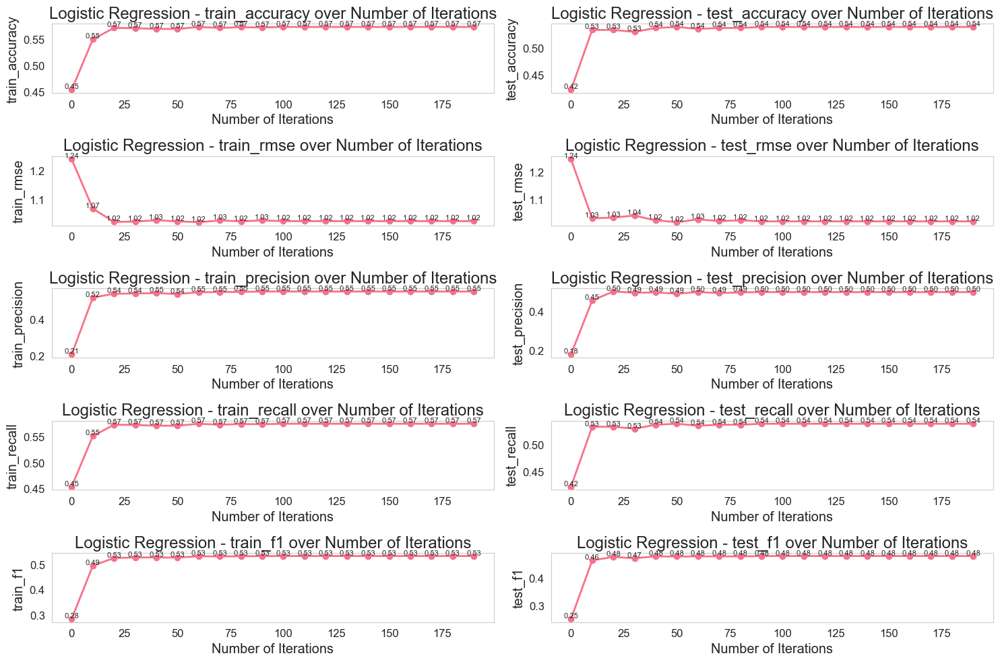

Plotting Metric: train_accuracy
Metric Data: [1.0, 0.6954887218045113, 0.6461466165413534, 0.6146616541353384, 0.6015037593984962, 0.5939849624060151, 0.5972744360902256, 0.5888157894736842, 0.5892857142857143, 0.5770676691729323, 0.5841165413533834, 0.5770676691729323, 0.5728383458646616, 0.5765977443609023, 0.5714285714285714, 0.5615601503759399, 0.5667293233082706, 0.5648496240601504, 0.5620300751879699, 0.5625, 0.5648496240601504, 0.5601503759398496, 0.5596804511278195, 0.5535714285714286, 0.5526315789473685, 0.5512218045112782]
Parameter Values: [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49, 51]
Plotting Metric: test_accuracy
Metric Data: [0.42105263157894735, 0.4718045112781955, 0.45300751879699247, 0.4830827067669173, 0.4868421052631579, 0.5056390977443609, 0.5112781954887218, 0.5112781954887218, 0.5, 0.4943609022556391, 0.4981203007518797, 0.5169172932330827, 0.5206766917293233, 0.5169172932330827, 0.5225563909774437, 0.526315789

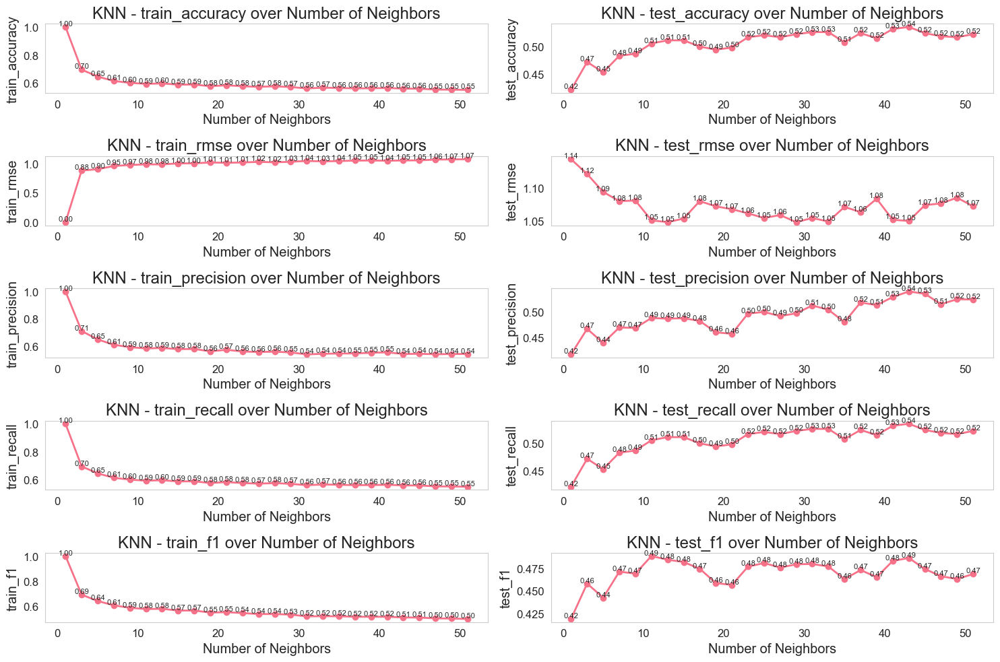

Plotting Metric: train_accuracy
Metric Data: [0.5639097744360902, 0.569078947368421, 0.5718984962406015, 0.5709586466165414, 0.5714285714285714, 0.5681390977443609]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: test_accuracy
Metric Data: [0.5469924812030075, 0.5394736842105263, 0.5375939849624061, 0.5394736842105263, 0.5357142857142857, 0.5357142857142857]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: train_rmse
Metric Data: [1.0454879783058029, 1.027351511323923, 1.021847802919215, 1.0243740065343117, 1.0227671443583566, 1.0291795403697983]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: test_rmse
Metric Data: [1.022307576982039, 1.0314600207647848, 1.0241446091500594, 1.0204672378173865, 1.0305484341786026, 1.027808823392565]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: train_precision
Metric Data: [0.43952855427314536, 0.5432866275816676, 0.547987419155052, 0.5478124494394813, 0.5472300837463332, 0.54

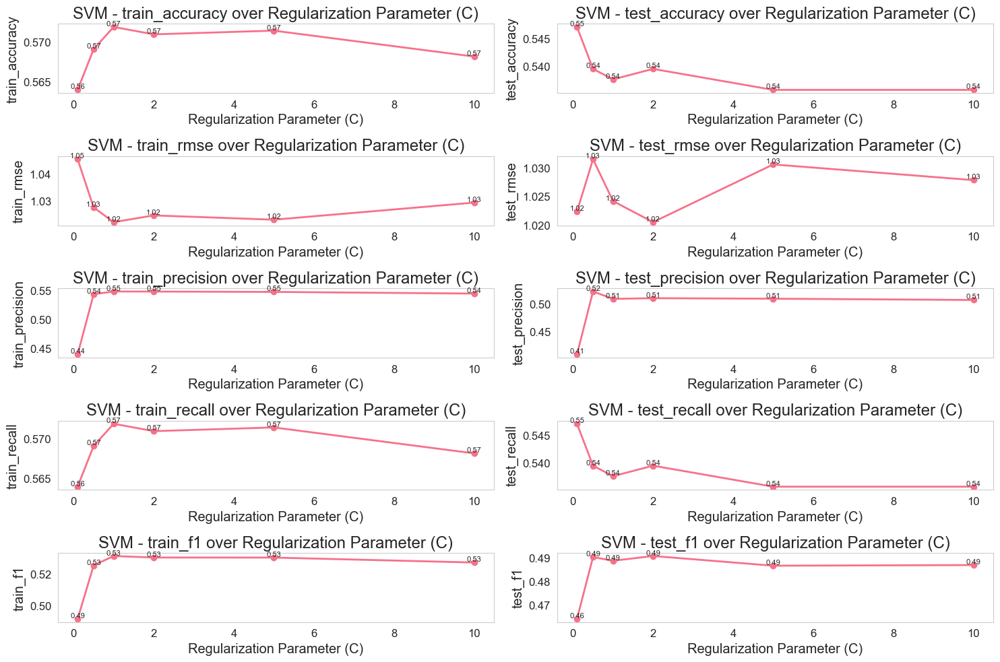

Plotting Metric: train_accuracy
Metric Data: [0.42951127819548873, 0.3975563909774436, 0.3806390977443609, 0.3580827067669173, 0.34774436090225563, 0.35291353383458646, 0.36654135338345867, 0.3707706766917293, 0.3651315789473684, 0.3919172932330827]
Parameter Values: range(1, 11)
Plotting Metric: test_accuracy
Metric Data: [0.39285714285714285, 0.37406015037593987, 0.35150375939849626, 0.3233082706766917, 0.31954887218045114, 0.32142857142857145, 0.3383458646616541, 0.33646616541353386, 0.32894736842105265, 0.35526315789473684]
Parameter Values: range(1, 11)
Plotting Metric: train_rmse
Metric Data: [1.4541876268677774, 1.5748851253011238, 1.6308814905106457, 1.696967662661932, 1.727160301410068, 1.7196618394629983, 1.6953053265933957, 1.691142337597589, 1.6975214129336988, 1.614082760546911]
Parameter Values: range(1, 11)
Plotting Metric: test_rmse
Metric Data: [1.4457612402847764, 1.6041534436196219, 1.6673557472746856, 1.7461019960045654, 1.7627089541790095, 1.7471781760734562, 1.714

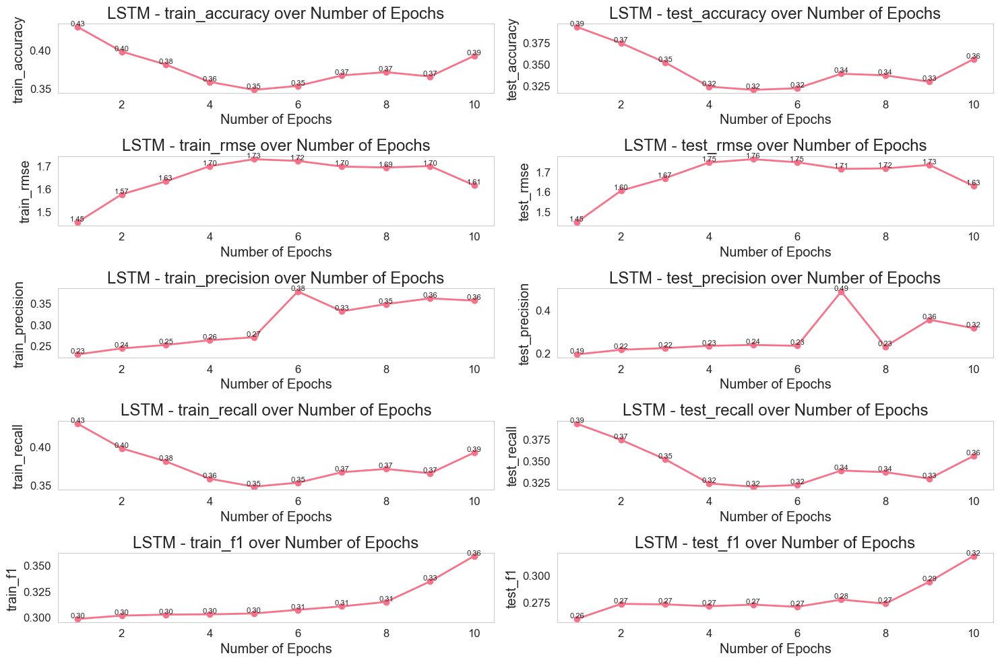

Plotting Metric: train_accuracy
Metric Data: [0.4849624060150376, 0.506578947368421, 0.5136278195488722, 0.5155075187969925, 0.5159774436090225, 0.5155075187969925, 0.5145676691729323]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: test_accuracy
Metric Data: [0.47368421052631576, 0.49624060150375937, 0.49624060150375937, 0.4906015037593985, 0.48872180451127817, 0.48872180451127817, 0.4868421052631579]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: train_rmse
Metric Data: [0.9471464861178621, 0.9364185491798634, 0.9311344039372021, 0.9278481856635263, 0.9306295871996703, 0.9278481856635263, 0.9253123837487516]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: test_rmse
Metric Data: [0.908398574374053, 0.8768106936398546, 0.883218652412824, 0.8895804536176852, 0.8906363358334124, 0.8937964983435144, 0.8916909677432464]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: train_precision
Metric Data: [0.5597814

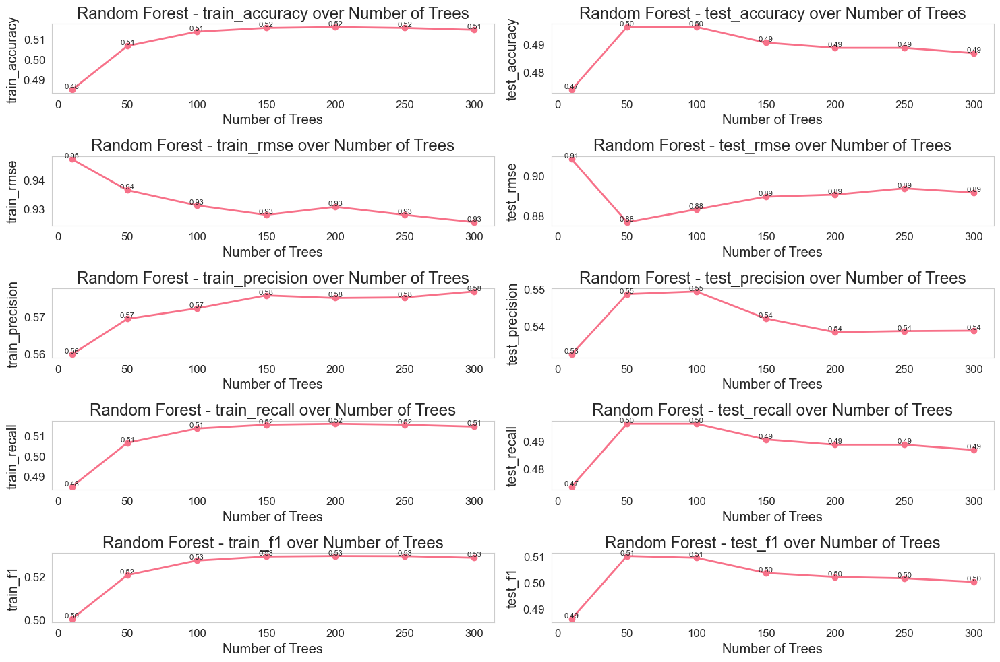

In [115]:
# Define parameter ranges
iterations = np.arange(0, 200, 10)  # for logistic regression [0, 10, ..., 190]
neighbors_range = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49, 51]
c_values = [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]  # for SVM
epochs = range(1, 11)  # for LSTM [1, 2, ..., 10]
rdnboost_iterations = np.arange(10, 210, 10)  # for RDNBoost [10, 20, ..., 200]
n_estimators = [10, 50, 100, 150, 200, 250, 300]  # for Random Forest

# Helper function to safely get metrics
def get_metrics(metrics_obj):
    if isinstance(metrics_obj, tuple):
        return metrics_obj[0]
    return metrics_obj

# Plot metrics for each model
trainer.plot_metrics(get_metrics(metrics_logistic), "Logistic Regression", 
                    param_values=iterations,
                    param_name="Number of Iterations")

trainer.plot_metrics(get_metrics(metrics_knn), "KNN", 
                    param_values=neighbors_range,
                    param_name="Number of Neighbors")

trainer.plot_metrics(get_metrics(metrics_svm), "SVM", 
                    param_values=c_values,
                    param_name="Regularization Parameter (C)")

trainer.plot_metrics(get_metrics(metrics_lstm), "LSTM", 
                    param_values=epochs,
                    param_name="Number of Epochs")

#trainer.plot_metrics(get_metrics(metrics_rdnboost), "RDNBoost", 
                    #param_values=rdnboost_iterations,
                    #param_name="Number of Iterations")

trainer.plot_metrics(get_metrics(metrics_rf), "Random Forest", 
                    param_values=n_estimators,
                    param_name="Number of Trees")



## Comparative Plots


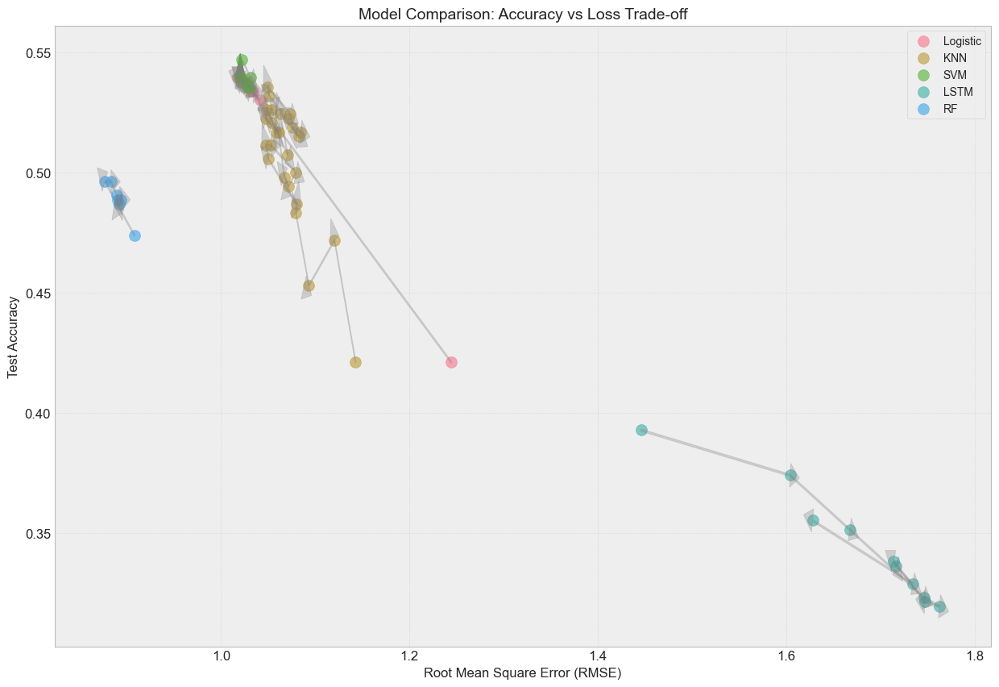

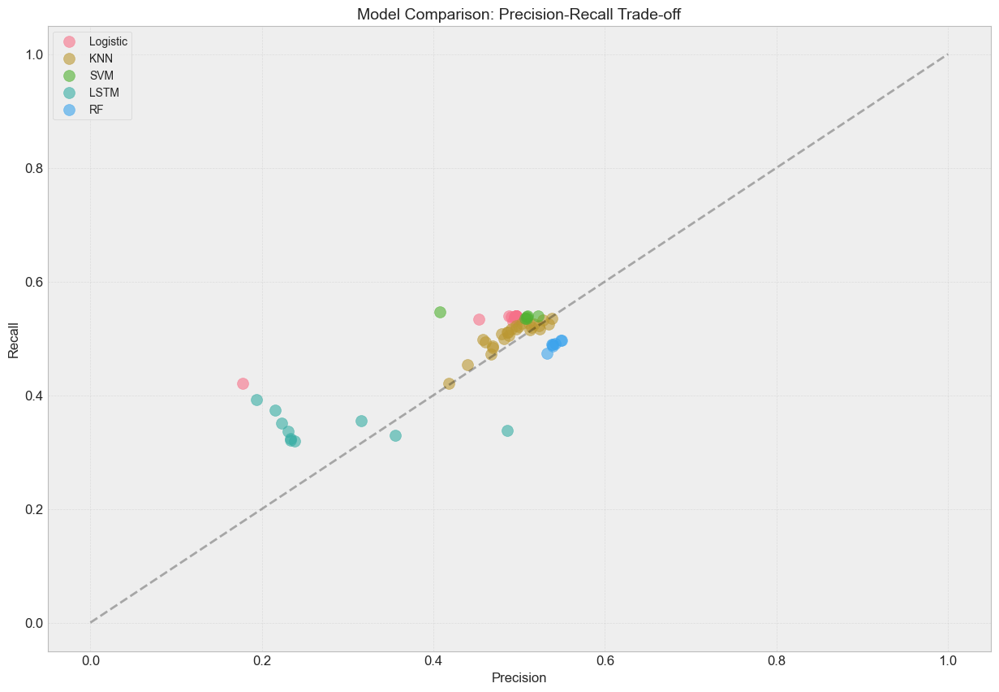

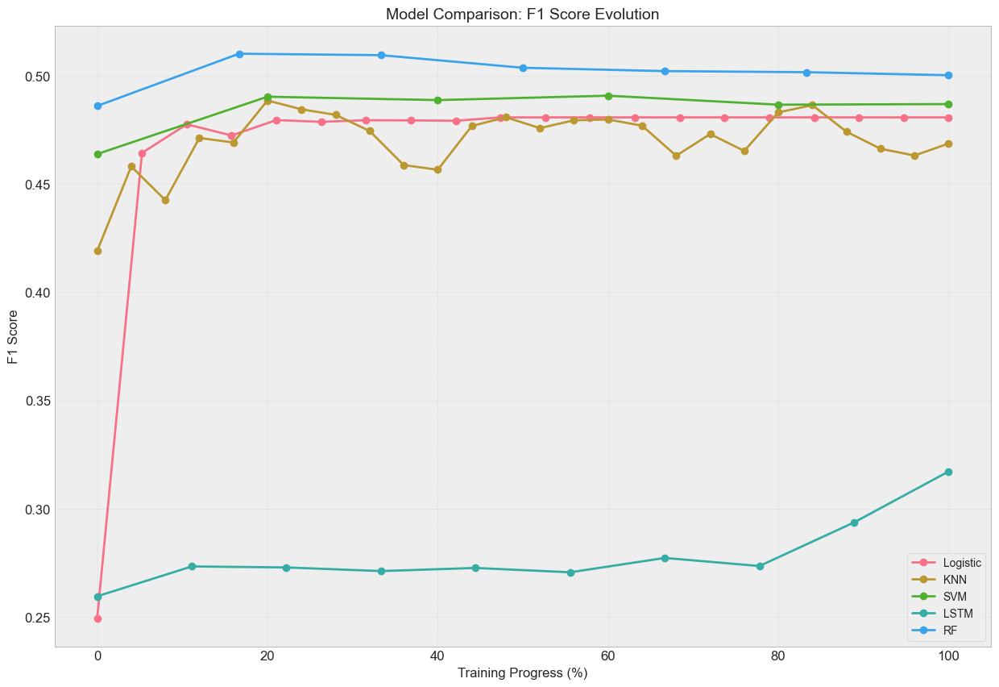

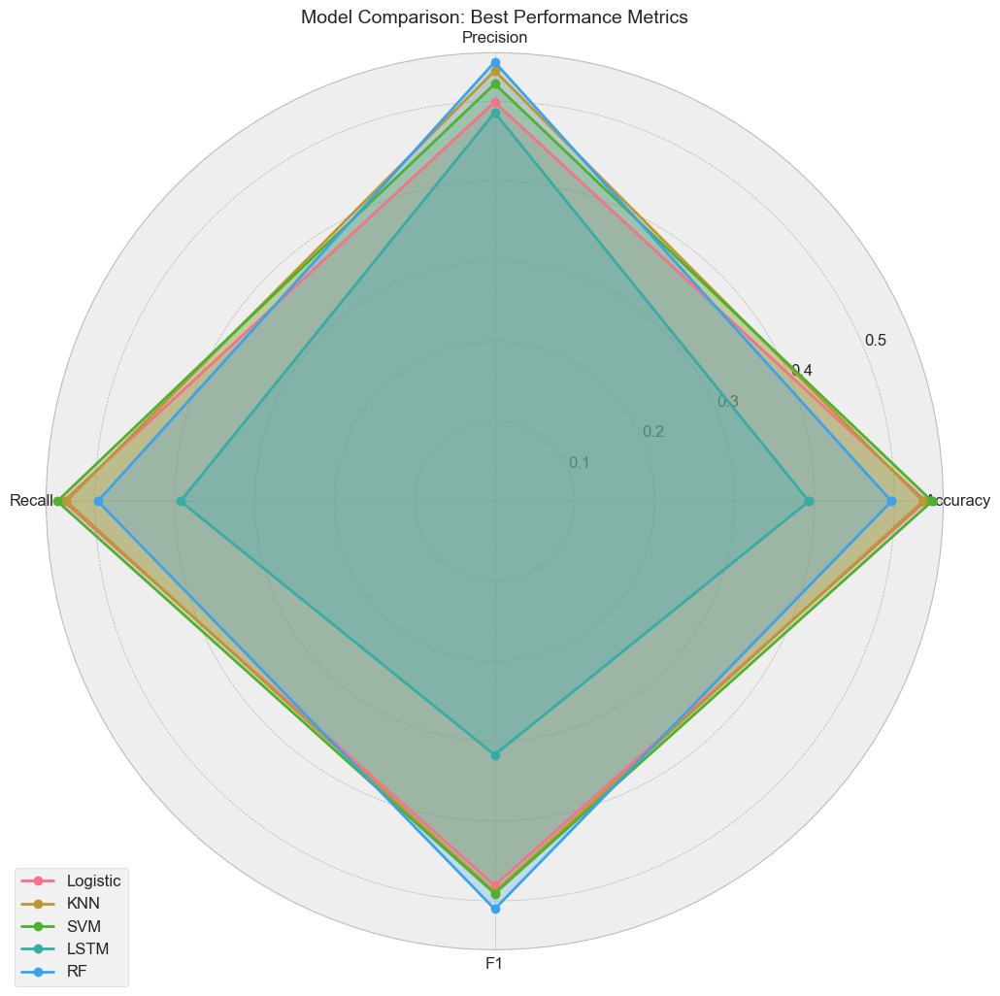

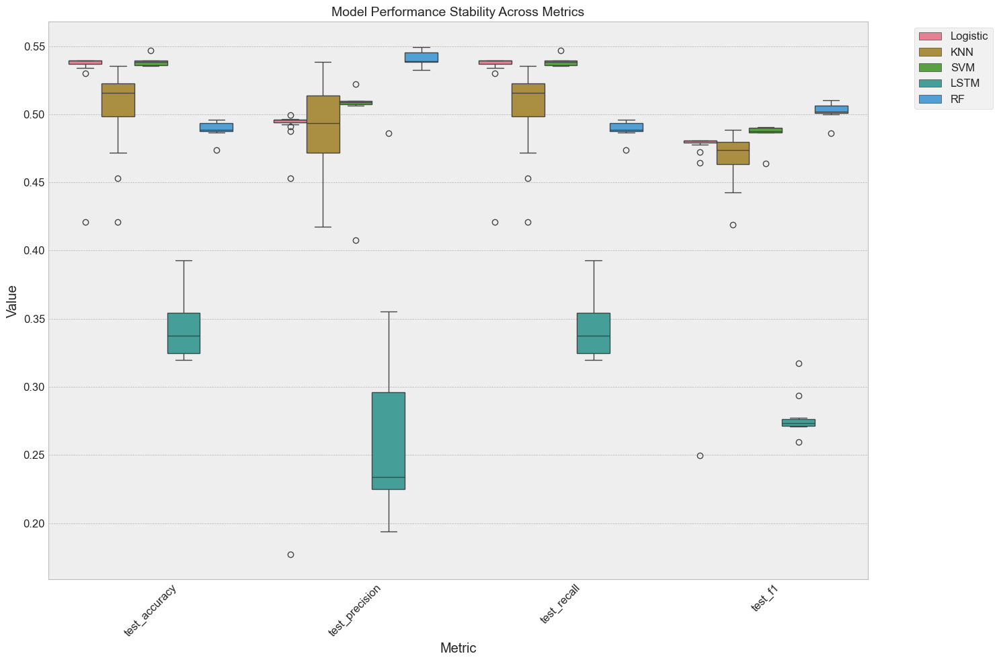

In [116]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# set style
plt.style.use('bmh')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['font.size'] = 12

def create_comparative_plots():
    models = {
        'Logistic': (metrics_logistic, iterations),
        'KNN': (metrics_knn, neighbors_range),
        'SVM': (metrics_svm, c_values),
        'LSTM': (metrics_lstm, epochs),
        ##'RDNBoost': (metrics_rdnboost, rdnboost_iterations),
        'RF': (metrics_rf, n_estimators)
    }

    # 1. Original Accuracy vs Loss Plot
    plt.figure(figsize=(15, 10))
    for model_name, (metrics_tuple, _) in models.items():
        metrics = get_metrics(metrics_tuple)
        plt.scatter(metrics['test_rmse'], metrics['test_accuracy'], 
                   label=model_name, alpha=0.6, s=100)
        
        # Add arrows
        for i in range(len(metrics['test_rmse'])-1):
            plt.arrow(metrics['test_rmse'][i], metrics['test_accuracy'][i],
                     metrics['test_rmse'][i+1]-metrics['test_rmse'][i], 
                     metrics['test_accuracy'][i+1]-metrics['test_accuracy'][i],
                     head_width=0.01, head_length=0.01, fc='gray', ec='gray', alpha=0.3)
    
    plt.title('Model Comparison: Accuracy vs Loss Trade-off', fontsize=14)
    plt.xlabel('Root Mean Square Error (RMSE)', fontsize=12)
    plt.ylabel('Test Accuracy', fontsize=12)
    plt.legend(fontsize=10)
    plt.grid(True, alpha=0.3)
    plt.show()

    # 2. Precision-Recall Trade-off
    plt.figure(figsize=(15, 10))
    for model_name, (metrics_tuple, _) in models.items():
        metrics = get_metrics(metrics_tuple)
        plt.scatter(metrics['test_precision'], metrics['test_recall'], 
                   label=model_name, alpha=0.6, s=100)
        
    plt.plot([0, 1], [0, 1], 'k--', alpha=0.3)  # diagonal line
    plt.title('Model Comparison: Precision-Recall Trade-off', fontsize=14)
    plt.xlabel('Precision', fontsize=12)
    plt.ylabel('Recall', fontsize=12)
    plt.legend(fontsize=10)
    plt.grid(True, alpha=0.3)
    plt.show()

    # 3. F1 Score Evolution
    plt.figure(figsize=(15, 10))
    for model_name, (metrics_tuple, param_values) in models.items():
        metrics = get_metrics(metrics_tuple)
        # Normalize parameter values to percentage
        x_vals = np.linspace(0, 100, len(metrics['test_f1']))
        plt.plot(x_vals, metrics['test_f1'], label=model_name, marker='o')
    
    plt.title('Model Comparison: F1 Score Evolution', fontsize=14)
    plt.xlabel('Training Progress (%)', fontsize=12)
    plt.ylabel('F1 Score', fontsize=12)
    plt.legend(fontsize=10)
    plt.grid(True, alpha=0.3)
    plt.show()

    # 4. Radar Chart (existing)
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(111, projection='polar')
    metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1']
    angles = np.linspace(0, 2*np.pi, len(metrics_names), endpoint=False)
    
    for model_name, (metrics_tuple, _) in models.items():
        metrics = get_metrics(metrics_tuple)
        values = [
            np.max(metrics['test_accuracy']),
            np.max(metrics['test_precision']),
            np.max(metrics['test_recall']),
            np.max(metrics['test_f1'])
        ]
        values += values[:1]
        angles_plot = np.concatenate((angles, [angles[0]]))
        ax.plot(angles_plot, values, 'o-', linewidth=2, label=model_name)
        ax.fill(angles_plot, values, alpha=0.25)
    
    ax.set_xticks(angles)
    ax.set_xticklabels(metrics_names)
    plt.title('Model Comparison: Best Performance Metrics', fontsize=14)
    plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
    plt.show()

    # 5. Performance Stability (Box Plots)
    plt.figure(figsize=(15, 10))
    metrics_to_plot = ['test_accuracy', 'test_precision', 'test_recall', 'test_f1']
    data_for_box = []
    
    for model_name, (metrics_tuple, _) in models.items():
        metrics = get_metrics(metrics_tuple)
        for metric in metrics_to_plot:
            for value in metrics[metric]:
                data_for_box.append({
                    'Model': model_name,
                    'Metric': metric,
                    'Value': value
                })
    
    df_box = pd.DataFrame(data_for_box)
    sns.boxplot(x='Metric', y='Value', hue='Model', data=df_box)
    plt.title('Model Performance Stability Across Metrics', fontsize=14)
    plt.xticks(rotation=45)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


# Create all plots
create_comparative_plots()

## Feature Selection Model Training

These models will be trained with datasets created from our previous feature selection methods. Each of the four models used a specific selection method that corresponded well with the model type. 

In [117]:
missing_features = ['Home Team', 'Match Outcome', 'Date'] # removed during feature selection

logistic_df = df[missing_features + logistic_features]
knn_df = df[missing_features + knn_features]
svm_df = df[missing_features + svm_features]
lstm_df = df[missing_features + lstm_features]
rf_df = df[missing_features + rf_features]
rdnboost_df = df.copy()

In [118]:
print('Preprocessing Data...')
missing_features = ['Home Team', 'Match Outcome', 'Date'] # removed during feature selection

# encoding and standardising for each of the four feature sets
logistic_df = encode_teams(logistic_df)
knn_df = encode_teams(knn_df)
svm_df = encode_teams(svm_df)
lstm_df = encode_teams(lstm_df)
rf_df = encode_teams(rf_df)
rdnboost_df = logistic_df.copy()


logistic_df = standardize_features(logistic_df, logistic_features)
knn_df = standardize_features(knn_df, knn_features)
svm_df = standardize_features(svm_df, svm_features)
lstm_df = standardize_features(lstm_df, lstm_features)
rf_df = standardize_features(rf_df, rf_features)
rdnboost_df = standardize_features(rdnboost_df, logistic_features)

# split the data into X (data) and y (target) for training and testing
logistic_train_df, logistic_test_df = chronological_split(logistic_df)
knn_train_df, knn_test_df = chronological_split(knn_df)
svm_train_df, svm_test_df = chronological_split(svm_df)
lstm_train_df, lstm_test_df = chronological_split(lstm_df)
rf_train_df, rf_test_df = chronological_split(rf_df)
rdnboost_train_df, rdnboost_test_df = chronological_split(rdnboost_df)

logistic_X_train, logistic_y_train = logistic_train_df.drop('Match Outcome', axis=1), logistic_train_df['Match Outcome']
logistic_X_test, logistic_y_test = logistic_test_df.drop('Match Outcome', axis=1), logistic_test_df['Match Outcome']

knn_X_train, knn_y_train = knn_train_df.drop('Match Outcome', axis=1), knn_train_df['Match Outcome']
knn_X_test, knn_y_test = knn_test_df.drop('Match Outcome', axis=1), knn_test_df['Match Outcome']

svm_X_train, svm_y_train = svm_train_df.drop('Match Outcome', axis=1), svm_train_df['Match Outcome']
svm_X_test, svm_y_test = svm_test_df.drop('Match Outcome', axis=1), svm_test_df['Match Outcome']

lstm_X_train, lstm_y_train = lstm_train_df.drop('Match Outcome', axis=1), lstm_train_df['Match Outcome']
lstm_X_test, lstm_y_test = lstm_test_df.drop('Match Outcome', axis=1), lstm_test_df['Match Outcome']

rf_X_train, rf_y_train = rf_train_df.drop('Match Outcome', axis=1), rf_train_df['Match Outcome']
rf_X_test, rf_y_test = rf_test_df.drop('Match Outcome', axis=1), rf_test_df['Match Outcome']

#rdnboost_X_train, rdnboost_y_train = rdnboost_train_df.drop('Match Outcome', axis=1), rdnboost_train_df['Match Outcome']
#rdnboost_X_test, rdnboost_y_test = rdnboost_test_df.drop('Match Outcome', axis=1), rdnboost_test_df['Match Outcome']



Preprocessing Data...


In [119]:
# Model Training
print('Starting Training...')
trainer = RecencyModelTrainingNew()

iterations = np.arange(0, 200, 10)
neighbors_range = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49, 51]
n_estimators_range = [10, 50, 100, 150, 200, 250, 300]

metrics_logistic2 = trainer.train_with_iterations(logistic_X_train, logistic_y_train, logistic_X_test, logistic_y_test, iterations)
metrics_knn2 = trainer.train_and_evaluate_knn(knn_X_train, knn_y_train, knn_X_test, knn_y_test, neighbors_range)
metrics_svm2 = trainer.train_and_evaluate_svm(svm_X_train, svm_y_train, svm_X_test, svm_y_test)
metrics_lstm2 = trainer.train_and_evaluate_lstm(lstm_X_train, lstm_y_train, lstm_X_test, lstm_y_test)
#metrics_rdnboost2 = trainer.train_and_evaluate_rdnboost(rdnboost_X_train, rdnboost_y_train, rdnboost_X_test, rdnboost_y_test, iterations)
metrics_rf2 = trainer.train_and_evaluate_rf(logistic_X_train, logistic_y_train, logistic_X_test, logistic_y_test, n_estimators_range)

Starting Training...


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being s

 1/67 [..............................] - ETA: 21s

2024-12-09 13:57:51.805739: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:57:51.867888: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:57:51.917021: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


 9/67 [===>..........................] - ETA: 0s - loss: 1.0250 - accuracy: 0.5139

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.9466 - accuracy: 0.5174

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.9727 - accuracy: 0.5417

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.8987 - accuracy: 0.6146

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

10/67 [===>..........................] - ETA: 0s - loss: 0.9316 - accuracy: 0.5719

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

10/67 [===>..........................] - ETA: 0s - loss: 0.9458 - accuracy: 0.5406

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.9415 - accuracy: 0.5556

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.9224 - accuracy: 0.5694

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.9259 - accuracy: 0.5486

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

17/17 [==============================] - 0s 4ms/step


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

Plotting Metric: train_accuracy
Metric Data: [0.45347744360902253, 0.5531015037593985, 0.568609022556391, 0.568609022556391, 0.5704887218045113, 0.569078947368421, 0.5676691729323309, 0.5700187969924813, 0.5709586466165414, 0.5695488721804511, 0.5695488721804511, 0.5695488721804511, 0.5695488721804511, 0.5695488721804511, 0.5695488721804511, 0.5695488721804511, 0.5695488721804511, 0.5695488721804511, 0.5695488721804511, 0.5695488721804511]
Parameter Values: [  0  10  20  30  40  50  60  70  80  90 100 110 120 130 140 150 160 170
 180 190]
Plotting Metric: test_accuracy
Metric Data: [0.42105263157894735, 0.5263157894736842, 0.5244360902255639, 0.5338345864661654, 0.5338345864661654, 0.5319548872180451, 0.5244360902255639, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046]
Parameter

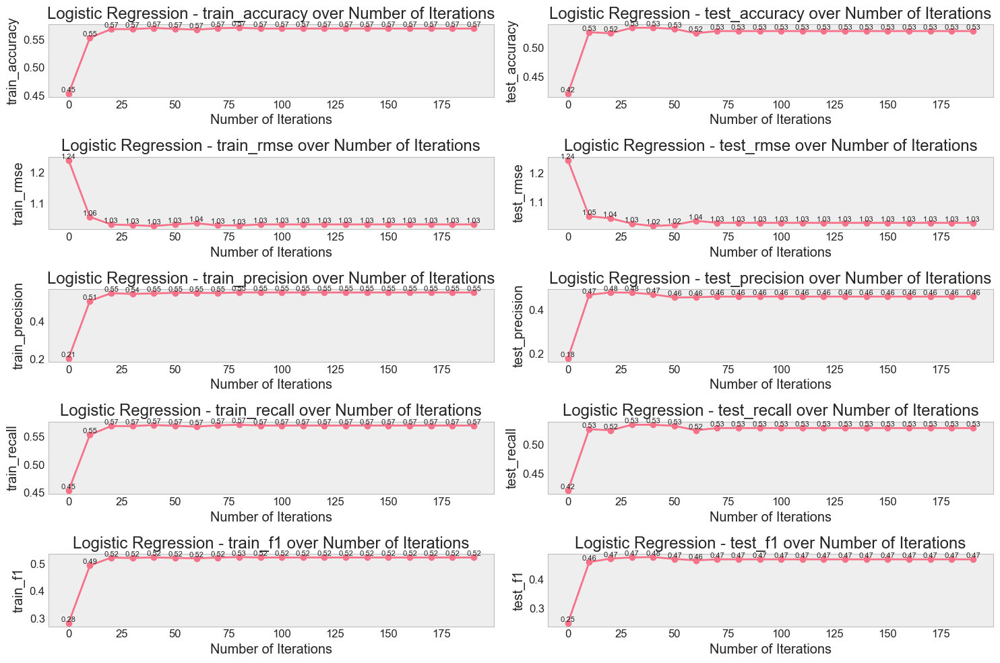

Plotting Metric: train_accuracy
Metric Data: [1.0, 0.6828007518796992, 0.644266917293233, 0.6292293233082706, 0.6038533834586466, 0.5968045112781954, 0.5911654135338346, 0.5883458646616542, 0.5789473684210527, 0.5718984962406015, 0.569078947368421, 0.5648496240601504, 0.5643796992481203, 0.568609022556391, 0.5718984962406015, 0.5709586466165414, 0.5596804511278195, 0.5568609022556391, 0.5578007518796992, 0.5582706766917294, 0.5592105263157895, 0.5582706766917294, 0.5521616541353384, 0.5549812030075187, 0.5549812030075187, 0.555921052631579]
Parameter Values: [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49, 51]
Plotting Metric: test_accuracy
Metric Data: [0.44360902255639095, 0.46616541353383456, 0.462406015037594, 0.48872180451127817, 0.49624060150375937, 0.5093984962406015, 0.4943609022556391, 0.5, 0.5112781954887218, 0.5037593984962406, 0.5112781954887218, 0.5131578947368421, 0.5206766917293233, 0.5150375939849624, 0.5281954887218046, 0.

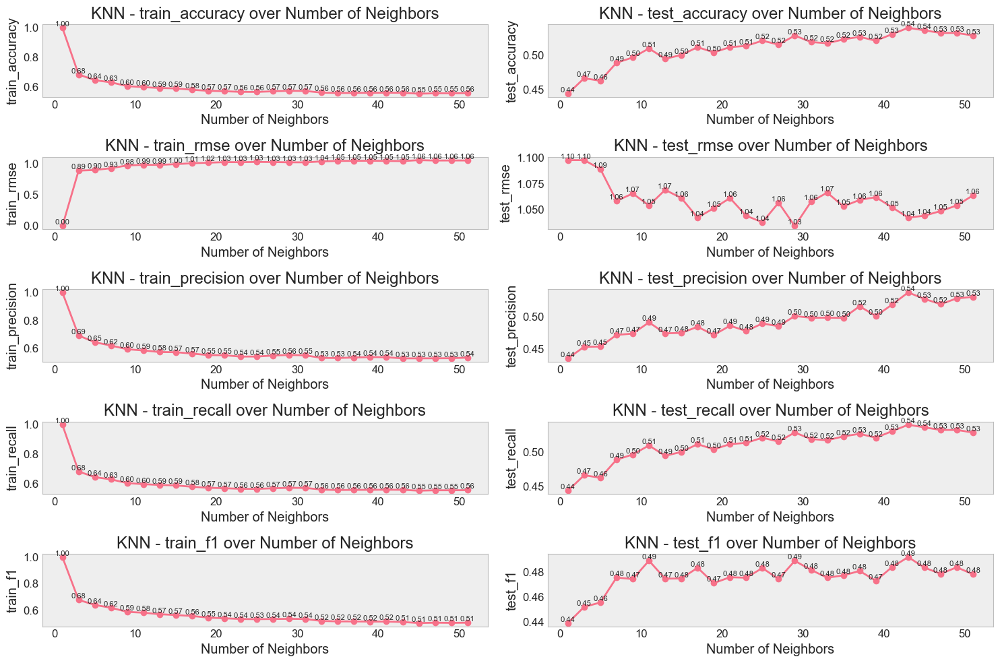

Plotting Metric: train_accuracy
Metric Data: [0.5625, 0.5625, 0.5657894736842105, 0.5639097744360902, 0.5625, 0.5625]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: test_accuracy
Metric Data: [0.5394736842105263, 0.556390977443609, 0.5469924812030075, 0.5601503759398496, 0.5507518796992481, 0.5545112781954887]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: train_rmse
Metric Data: [1.0481813824554964, 1.0373658079717454, 1.0296360405210423, 1.0346442489109535, 1.0394023007753748, 1.0380450828287577]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: test_rmse
Metric Data: [1.0369127108512135, 1.006557447310804, 1.0, 0.9848476085314292, 1.0037523583994616, 0.9962335082737976]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: train_precision
Metric Data: [0.4382396388109028, 0.5112749555726508, 0.5375695563857489, 0.5360877634797719, 0.5380352004629858, 0.5372064217463843]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 

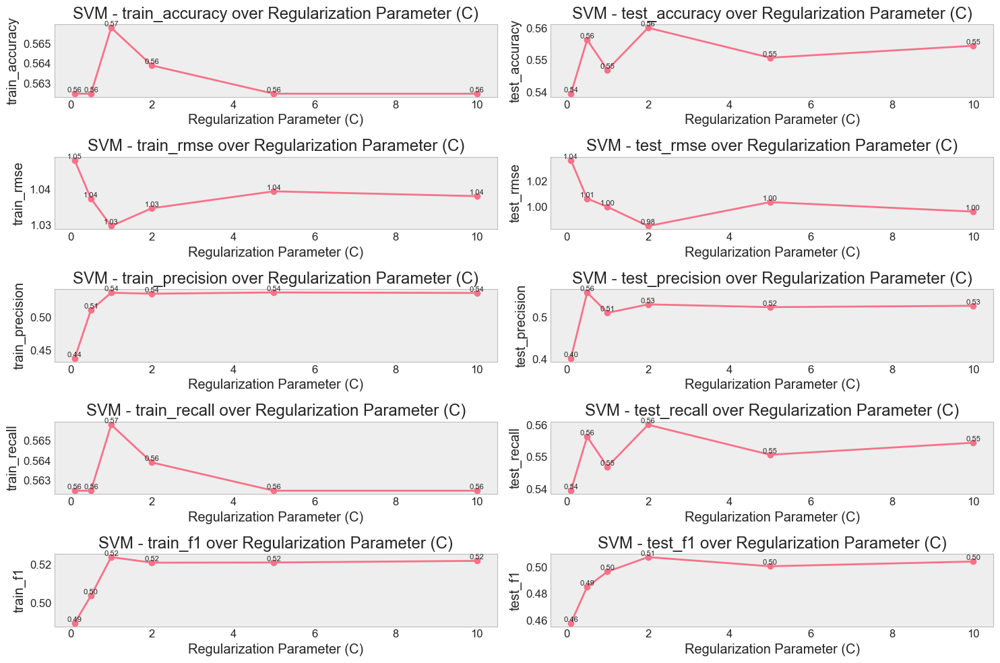

Plotting Metric: train_accuracy
Metric Data: [0.43045112781954886, 0.32471804511278196, 0.3505639097744361, 0.3782894736842105, 0.3858082706766917, 0.3566729323308271, 0.35385338345864664, 0.36701127819548873, 0.3656015037593985, 0.38627819548872183]
Parameter Values: range(1, 11)
Plotting Metric: test_accuracy
Metric Data: [0.39849624060150374, 0.29887218045112784, 0.3157894736842105, 0.34962406015037595, 0.36278195488721804, 0.32706766917293234, 0.32706766917293234, 0.33458646616541354, 0.33458646616541354, 0.3533834586466165]
Parameter Values: range(1, 11)
Plotting Metric: train_rmse
Metric Data: [1.4400618721043628, 1.7505369745447026, 1.7040144992146735, 1.647366319151173, 1.625686668105863, 1.711032313823257, 1.716653283642507, 1.6919757548166043, 1.6936413589162196, 1.6595870942220148]
Parameter Values: range(1, 11)
Plotting Metric: test_rmse
Metric Data: [1.4366313982494223, 1.787067156700159, 1.745025152241333, 1.6953053265933957, 1.6617094196906756, 1.7369275440366194, 1.7342

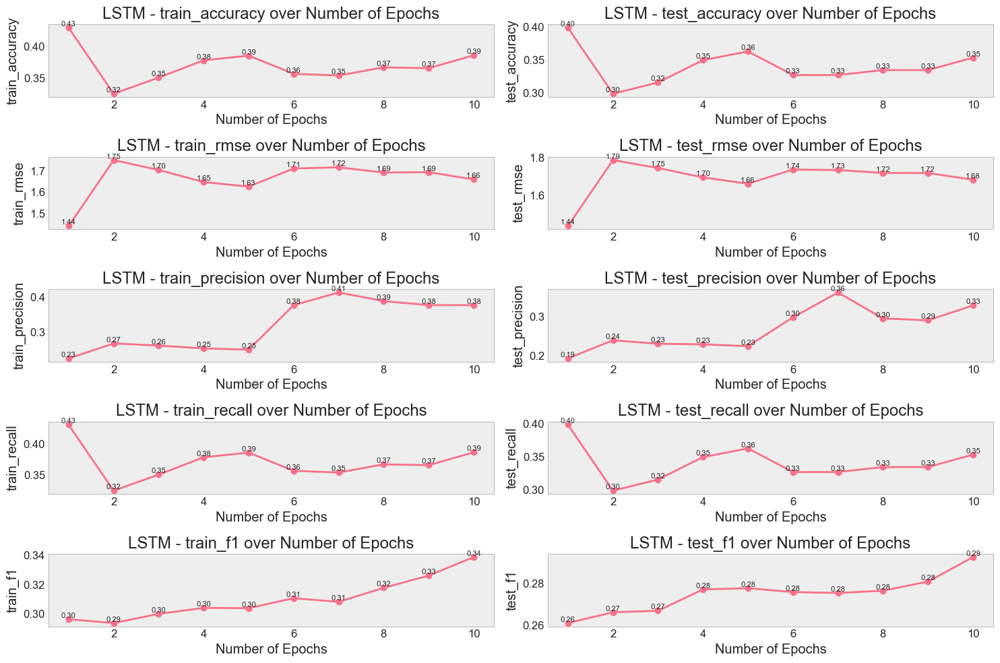

Plotting Metric: train_accuracy
Metric Data: [0.4891917293233083, 0.49624060150375937, 0.5014097744360902, 0.49953007518796994, 0.5, 0.5037593984962406, 0.5046992481203008]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: test_accuracy
Metric Data: [0.48120300751879697, 0.5018796992481203, 0.5056390977443609, 0.5056390977443609, 0.5018796992481203, 0.5093984962406015, 0.5093984962406015]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: train_rmse
Metric Data: [0.9283545148611912, 0.9268346974466253, 0.9225149508742209, 0.9250584212398517, 0.9263275375194874, 0.9235331796067678, 0.9237875614266607]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: test_rmse
Metric Data: [0.8916909677432464, 0.8864052604279183, 0.8551040916279122, 0.8616734897903723, 0.8605820726458334, 0.8594892695730868, 0.8627635262664035]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: train_precision
Metric Data: [0.5680063667036581, 0.5

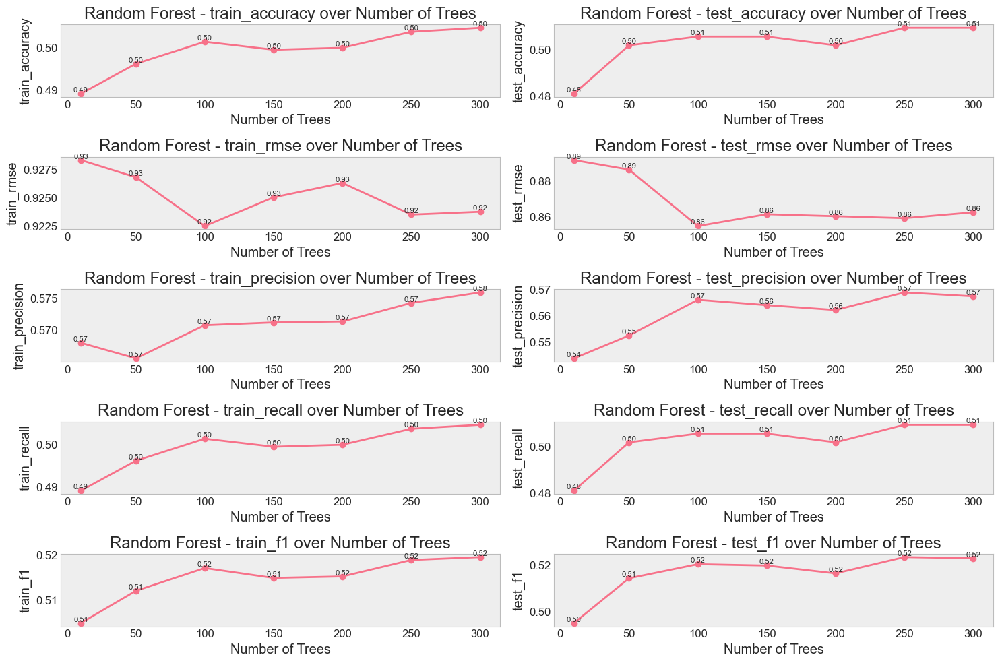

In [120]:
# Define parameter ranges
iterations = np.arange(0, 200, 10)  # for logistic regression [0, 10, ..., 190]
neighbors_range = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49, 51]
c_values = [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]  # for SVM
epochs = range(1, 11)  # for LSTM [1, 2, ..., 10]
rdnboost_iterations = np.arange(10, 210, 10)  # for RDNBoost [10, 20, ..., 200]
n_estimators = [10, 50, 100, 150, 200, 250, 300]  # for Random Forest

# Helper function to safely get metrics
def get_metrics(metrics_obj):
    if isinstance(metrics_obj, tuple):
        return metrics_obj[0]
    return metrics_obj

# Plot metrics for each model
trainer.plot_metrics(get_metrics(metrics_logistic2), "Logistic Regression", 
                    param_values=iterations,
                    param_name="Number of Iterations")

trainer.plot_metrics(get_metrics(metrics_knn2), "KNN", 
                    param_values=neighbors_range,
                    param_name="Number of Neighbors")

trainer.plot_metrics(get_metrics(metrics_svm2), "SVM", 
                    param_values=c_values,
                    param_name="Regularization Parameter (C)")

trainer.plot_metrics(get_metrics(metrics_lstm2), "LSTM", 
                    param_values=epochs,
                    param_name="Number of Epochs")

#trainer.plot_metrics(get_metrics(metrics_rdnboost2), "RDNBoost", 
                    #param_values=rdnboost_iterations,
                    #param_name="Number of Iterations")

trainer.plot_metrics(get_metrics(metrics_rf2), "Random Forest", 
                    param_values=n_estimators,
                    param_name="Number of Trees")


## Embedded Feature Selection Model Training

In the following selection, we will focus on embedded feature selection methods. For the Logistic Regression model, we will use the entire recency data set and try out LASSO regression, Ridge regression, and Elastic Net regularisation to see which technique fairs best.

The KNN model does not support any traditional regularisation techniques as it is non-parametric. It is possible to indirectly apply regularisation-like effects to the model. However, we will not be looking at these indirect methods. 

SVM models, on the other hand, do support traditional regularisation techniques. We will implement L1 and L2 regression. Elastic Net regularisation is not very commonly used and will not be tested.

Similarly, LSTM models allow L1 and L2 regression techniques that control the weights of the model. Furthermore, we will implemented drop out regularisation - where a fraction of the neurons are randomly removed to prevent highly correlated units.  

In [121]:
print('Preprocessing Data...')


full_df = encode_teams(df)
full_df = standardize_features(full_df, numerical_features)

full_train_df, full_test_df = chronological_split(full_df)

full_X_train, full_y_train = full_train_df.drop('Match Outcome', axis=1), full_train_df['Match Outcome']
full_X_test, full_y_test = full_test_df.drop('Match Outcome', axis=1), full_test_df['Match Outcome']

Preprocessing Data...


Starting Training...


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to conver

Logistic Regression => LASSO Regularisation Selected Features (max_iter=190): ['Avg Goals Scored Home Last 1 Games', 'Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 2 Games', 'Avg Goals Scored Home Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Scored Home Last 5 Games', 'Avg Goals Conceded Away Last 1 Games', 'Avg Goals Conceded Home Last 4 Games', 'Avg Goals Conceded Away Last 4 Games', 'Avg Goals Conceded Away Last 5 Games', 'Avg Attack Strength Away Last 1 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Attack Strength Home Last 5 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Midfield Strength Away Last 1 Games', 'Avg Midfield Strength Home Last 2 Games', 'Avg Midfield Strength Away Last 3 Games', 'Avg Midfield Strength Away Last 5 Games', 'Avg Defense Strength Away Last 1 Games', 'Avg Defense Strength Away Last 3 Games', 'Avg Defense Strength Away Last 4 Games', 'Avg Recent Performance Home

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Prec

Logistic Regression => Ridge Regression Selected Features (max_iter=190): Every feature. Just different weights.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter 

Logistic Regression => Elastic Net Selected Features (max_iter=190): ['Avg Goals Scored Home Last 1 Games', 'Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 2 Games', 'Avg Goals Scored Home Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Scored Home Last 4 Games', 'Avg Goals Conceded Away Last 1 Games', 'Avg Goals Conceded Away Last 2 Games', 'Avg Goals Conceded Away Last 4 Games', 'Avg Goals Conceded Home Last 5 Games', 'Avg Goals Conceded Away Last 5 Games', 'Avg Attack Strength Away Last 1 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Attack Strength Home Last 5 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Midfield Strength Away Last 1 Games', 'Avg Midfield Strength Home Last 2 Games', 'Avg Midfield Strength Away Last 3 Games', 'Avg Midfield Strength Home Last 4 Games', 'Avg Midfield Strength Away Last 5 Games', 'Avg Defense Strength Away Last 1 Games', 'Avg Defense Strength Home Last 3 Game

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVM => Selected Features with L1 Regularization (C=0.5): 42/60

['Avg Goals Scored Home Last 1 Games', 'Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 2 Games', 'Avg Goals Scored Away Last 2 Games', 'Avg Goals Scored Home Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Scored Home Last 4 Games', 'Avg Goals Scored Home Last 5 Games', 'Avg Goals Conceded Away Last 1 Games', 'Avg Goals Conceded Away Last 2 Games', 'Avg Goals Conceded Home Last 4 Games', 'Avg Goals Conceded Away Last 4 Games', 'Avg Goals Conceded Away Last 5 Games', 'Avg Attack Strength Home Last 1 Games', 'Avg Attack Strength Away Last 1 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Attack Strength Away Last 4 Games', 'Avg Attack Strength Home Last 5 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Midfield Strength Away Last 1 Games', 'Avg Midfield Strength Home Last 2 Games', 'Avg Midfield Strength Away Last 2 Games', 'Avg Midfield

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVM => Selected Features with L1 Regularization (C=1.0): 44/60

['Avg Goals Scored Home Last 1 Games', 'Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 2 Games', 'Avg Goals Scored Away Last 2 Games', 'Avg Goals Scored Home Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Scored Home Last 4 Games', 'Avg Goals Scored Away Last 4 Games', 'Avg Goals Scored Home Last 5 Games', 'Avg Goals Scored Away Last 5 Games', 'Avg Goals Conceded Away Last 1 Games', 'Avg Goals Conceded Away Last 2 Games', 'Avg Goals Conceded Home Last 4 Games', 'Avg Goals Conceded Away Last 4 Games', 'Avg Goals Conceded Home Last 5 Games', 'Avg Attack Strength Home Last 1 Games', 'Avg Attack Strength Away Last 1 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Attack Strength Away Last 4 Games', 'Avg Attack Strength Home Last 5 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Midfield Strength Away Last 1 Games', 'Avg Midfield Strength 

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVM => Selected Features with L1 Regularization (C=2.0): 47/60

['Avg Goals Scored Home Last 1 Games', 'Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 2 Games', 'Avg Goals Scored Away Last 2 Games', 'Avg Goals Scored Home Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Scored Home Last 4 Games', 'Avg Goals Scored Away Last 4 Games', 'Avg Goals Conceded Away Last 1 Games', 'Avg Goals Conceded Home Last 2 Games', 'Avg Goals Conceded Away Last 2 Games', 'Avg Goals Conceded Home Last 4 Games', 'Avg Goals Conceded Away Last 4 Games', 'Avg Goals Conceded Home Last 5 Games', 'Avg Attack Strength Home Last 1 Games', 'Avg Attack Strength Away Last 1 Games', 'Avg Attack Strength Away Last 2 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Attack Strength Away Last 4 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Midfield Strength Away Last 1 Games', 'Avg Midfield Strength Home Last 2 Games', 'Avg Midfield St

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVM => Selected Features with L1 Regularization (C=5.0): 52/60

['Avg Goals Scored Home Last 1 Games', 'Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 2 Games', 'Avg Goals Scored Away Last 2 Games', 'Avg Goals Scored Home Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Scored Home Last 4 Games', 'Avg Goals Scored Away Last 5 Games', 'Avg Goals Conceded Away Last 1 Games', 'Avg Goals Conceded Home Last 2 Games', 'Avg Goals Conceded Away Last 2 Games', 'Avg Goals Conceded Away Last 3 Games', 'Avg Goals Conceded Home Last 4 Games', 'Avg Goals Conceded Away Last 4 Games', 'Avg Goals Conceded Home Last 5 Games', 'Avg Goals Conceded Away Last 5 Games', 'Avg Attack Strength Home Last 1 Games', 'Avg Attack Strength Away Last 1 Games', 'Avg Attack Strength Away Last 2 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Attack Strength Away Last 4 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Midfield Strength

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVM => Selected Features with L1 Regularization (C=10.0): 59/60

['Avg Goals Scored Home Last 1 Games', 'Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 2 Games', 'Avg Goals Scored Away Last 2 Games', 'Avg Goals Scored Home Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Scored Home Last 4 Games', 'Avg Goals Scored Away Last 4 Games', 'Avg Goals Scored Home Last 5 Games', 'Avg Goals Scored Away Last 5 Games', 'Avg Goals Conceded Home Last 1 Games', 'Avg Goals Conceded Away Last 1 Games', 'Avg Goals Conceded Home Last 2 Games', 'Avg Goals Conceded Away Last 2 Games', 'Avg Goals Conceded Away Last 3 Games', 'Avg Goals Conceded Home Last 4 Games', 'Avg Goals Conceded Away Last 4 Games', 'Avg Goals Conceded Home Last 5 Games', 'Avg Goals Conceded Away Last 5 Games', 'Avg Attack Strength Home Last 1 Games', 'Avg Attack Strength Away Last 1 Games', 'Avg Attack Strength Home Last 2 Games', 'Avg Attack Strength Away Last 2 Games', 'Avg Attack Strength Home Last

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVM => Selected Features with L2 Regularisation (C=2.0): Every feature. Just different weights.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVM => Selected Features with L2 Regularisation (C=5.0): Every feature. Just different weights.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVM => Selected Features with L2 Regularisation (C=10.0): Every feature. Just different weights.


2024-12-09 13:58:29.667191: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:58:29.871321: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:58:29.922651: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:58:30.090815: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:58:30.209503: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


 1/67 [..............................] - ETA: 20s

2024-12-09 13:58:31.584458: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:58:31.646415: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:58:31.701657: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


13/67 [====>.........................] - ETA: 0s - loss: 6.7270 - accuracy: 0.4447

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


13/67 [====>.........................] - ETA: 0s - loss: 1.1854 - accuracy: 0.4519

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


 9/67 [===>..........................] - ETA: 0s - loss: 1.0929 - accuracy: 0.4688

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


13/67 [====>.........................] - ETA: 0s - loss: 1.1080 - accuracy: 0.4495

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


 9/67 [===>..........................] - ETA: 0s - loss: 1.0935 - accuracy: 0.4688

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


13/67 [====>.........................] - ETA: 0s - loss: 1.1090 - accuracy: 0.4519

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


 9/67 [===>..........................] - ETA: 0s - loss: 1.1172 - accuracy: 0.4444

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


13/67 [====>.........................] - ETA: 0s - loss: 1.0961 - accuracy: 0.4639

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


13/67 [====>.........................] - ETA: 0s - loss: 1.1046 - accuracy: 0.4688

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


17/17 [==============================] - 0s 3ms/step


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-09 13:58:44.272582: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:58:44.574115: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:

 3/67 [>.............................] - ETA: 2s - loss: 3.3998 - accuracy: 0.3750  

2024-12-09 13:58:44.789742: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


 1/67 [..............................] - ETA: 21s

2024-12-09 13:58:46.504551: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:58:46.567928: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:58:46.608590: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


 7/67 [==>...........................] - ETA: 1s - loss: 1.4507 - accuracy: 0.4375

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


 8/67 [==>...........................] - ETA: 1s - loss: 1.0873 - accuracy: 0.4883

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


10/67 [===>..........................] - ETA: 0s - loss: 1.0673 - accuracy: 0.4531

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


 7/67 [==>...........................] - ETA: 1s - loss: 1.0526 - accuracy: 0.4509

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


 7/67 [==>...........................] - ETA: 1s - loss: 1.0527 - accuracy: 0.4464

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 8/67 [==>...........................] - ETA: 0s - loss: 0.9735 - accuracy: 0.5508

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 7/67 [==>...........................] - ETA: 1s - loss: 1.0334 - accuracy: 0.5446

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 8/67 [==>...........................] - ETA: 0s - loss: 1.0029 - accuracy: 0.5391

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 7/67 [==>...........................] - ETA: 1s - loss: 0.9933 - accuracy: 0.5580

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

17/17 [==============================] - 0s 3ms/step


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 1/67 [..............................] - ETA: 1:35 - loss: 29.8837 - accuracy: 0.3750

2024-12-09 13:59:02.227234: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


 7/67 [==>...........................] - ETA: 0s 

2024-12-09 13:59:04.463012: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:59:04.523870: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:59:04.568697: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


 7/67 [==>...........................] - ETA: 1s - loss: 7.7184 - accuracy: 0.5134

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


 7/67 [==>...........................] - ETA: 1s - loss: 1.2548 - accuracy: 0.4152

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


 6/67 [=>............................] - ETA: 1s - loss: 1.1325 - accuracy: 0.4167

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


 7/67 [==>...........................] - ETA: 1s - loss: 1.1160 - accuracy: 0.4241

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


 7/67 [==>...........................] - ETA: 1s - loss: 1.0993 - accuracy: 0.4688

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


 6/67 [=>............................] - ETA: 1s - loss: 1.1260 - accuracy: 0.4010

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


 7/67 [==>...........................] - ETA: 1s - loss: 1.0952 - accuracy: 0.4688

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


 7/67 [==>...........................] - ETA: 1s - loss: 1.1226 - accuracy: 0.4063

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


 7/67 [==>...........................] - ETA: 1s - loss: 1.0912 - accuracy: 0.4732

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


17/17 [==============================] - 0s 3ms/step


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-09 13:59:23.120402: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:59:23.301900: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:

 1/67 [..............................] - ETA: 1:36 - loss: 1.0991 - accuracy: 0.3750

2024-12-09 13:59:23.633267: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


 1/67 [..............................] - ETA: 23s

2024-12-09 13:59:25.539065: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:59:25.600499: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-09 13:59:25.661134: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


 9/67 [===>..........................] - ETA: 0s - loss: 1.0170 - accuracy: 0.5243

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.9502 - accuracy: 0.5417

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.9542 - accuracy: 0.5660

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.9555 - accuracy: 0.5382

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.9357 - accuracy: 0.5486

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.9149 - accuracy: 0.5833

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.8801 - accuracy: 0.6111

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.8925 - accuracy: 0.5833

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.9468 - accuracy: 0.5521

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

17/17 [==============================] - 0s 3ms/step

Random Forest => Top 31 Important Features (n_estimators=10):
Avg Attack Strength Home Last 5 Games: 0.1124
Avg Attack Strength Away Last 5 Games: 0.0691
Avg Midfield Strength Home Last 4 Games: 0.0588
Avg Attack Strength Home Last 4 Games: 0.0453
Avg Attack Strength Away Last 4 Games: 0.0424
Avg Midfield Strength Home Last 5 Games: 0.0412
Avg Attack Strength Away Last 3 Games: 0.0402
Avg Midfield Strength Away Last 1 Games: 0.0402
Avg Attack Strength Home Last 3 Games: 0.0378
Avg Goals Scored Away Last 5 Games: 0.0370
Avg Midfield Strength Home Last 3 Games: 0.0356
Avg Attack Strength Away Last 2 Games: 0.0307
Avg Attack Strength Home Last 2 Games: 0.0296
Avg Midfield Strength Away Last 5 Games: 0.0252
Avg Midfield Strength Away Last 4 Games: 0.0250
Avg Recent Performance Home Last 1 Games: 0.0205
Avg Midfield Strength Away Last 2 Games: 0.0185
Avg Recent Performance Home Last 5 Games: 0.0182
Avg Defense Strength Home Last 3 Games:

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res


Random Forest => Top 31 Important Features (n_estimators=100):
Avg Attack Strength Home Last 5 Games: 0.0698
Avg Attack Strength Home Last 4 Games: 0.0651
Avg Midfield Strength Away Last 3 Games: 0.0545
Avg Midfield Strength Home Last 5 Games: 0.0491
Avg Midfield Strength Away Last 5 Games: 0.0469
Avg Midfield Strength Home Last 4 Games: 0.0467
Avg Attack Strength Away Last 5 Games: 0.0388
Avg Attack Strength Away Last 4 Games: 0.0376
Avg Attack Strength Home Last 3 Games: 0.0338
Avg Midfield Strength Away Last 2 Games: 0.0301
Avg Attack Strength Away Last 3 Games: 0.0301
Avg Midfield Strength Home Last 3 Games: 0.0263
Avg Midfield Strength Away Last 4 Games: 0.0249
Avg Midfield Strength Away Last 1 Games: 0.0229
Avg Attack Strength Away Last 2 Games: 0.0226
Avg Attack Strength Home Last 2 Games: 0.0202
Avg Midfield Strength Home Last 2 Games: 0.0194
Avg Attack Strength Home Last 1 Games: 0.0192
Avg Midfield Strength Home Last 1 Games: 0.0170
Avg Attack Strength Away Last 1 Games: 0.0

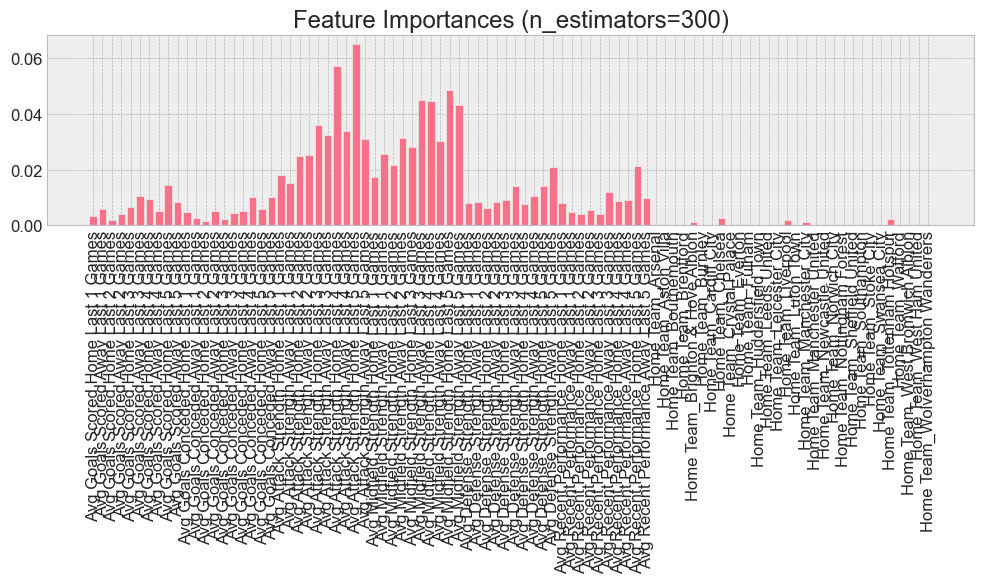

Random Forest => Selected Features with SelectFromModel (n_estimators=10): 31
['Avg Goals Scored Home Last 4 Games', 'Avg Goals Scored Away Last 5 Games', 'Avg Goals Conceded Home Last 3 Games', 'Avg Goals Conceded Away Last 5 Games', 'Avg Attack Strength Home Last 2 Games', 'Avg Attack Strength Away Last 2 Games', 'Avg Attack Strength Home Last 3 Games', 'Avg Attack Strength Away Last 3 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Attack Strength Away Last 4 Games', 'Avg Attack Strength Home Last 5 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Midfield Strength Away Last 1 Games', 'Avg Midfield Strength Home Last 2 Games', 'Avg Midfield Strength Away Last 2 Games', 'Avg Midfield Strength Home Last 3 Games', 'Avg Midfield Strength Away Last 3 Games', 'Avg Midfield Strength Home Last 4 Games', 'Avg Midfield Strength Away Last 4 Games', 'Avg Midfield Strength Home Last 5 Games', 'Avg Midfield Strength Away Last 5 Games', 'Avg De

In [122]:
# Model Training
print('Starting Training...')
trainer = RecencyModelTrainingNew()

iterations = np.arange(0, 200, 10)
neighbors_range = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49, 51]

metrics_logistic_l1 = trainer.train_with_iterations_l1(full_X_train, full_y_train, full_X_test, full_y_test, iterations)
metrics_logistic_l2 = trainer.train_with_iterations_l2(full_X_train, full_y_train, full_X_test, full_y_test, iterations)
metrics_logistic_l1_l2 = trainer.train_with_iterations_l1_l2(full_X_train, full_y_train, full_X_test, full_y_test, iterations, l1_ratio=0.5)

metrics_svm_l1 = trainer.train_and_evaluate_svm_l1(full_X_train, full_y_train, full_X_test, full_y_test)
metrics_svm_l2 = trainer.train_and_evaluate_svm_l2(full_X_train, full_y_train, full_X_test, full_y_test)

metrics_lstm_l1 = trainer.train_and_evaluate_lstm_l1(full_X_train, full_y_train, full_X_test, full_y_test)
metrics_lstm_l2 = trainer.train_and_evaluate_lstm_l2(full_X_train, full_y_train, full_X_test, full_y_test)
metrics_lstm_l1_l2 = trainer.train_and_evaluate_lstm_l1_l2(full_X_train, full_y_train, full_X_test, full_y_test)
metrics_lstm_dropout = trainer.train_and_evaluate_lstm_dropout(full_X_train, full_y_train, full_X_test, full_y_test)

metrics_rf_importance = trainer.train_and_evaluate_rf_importance(full_X_train, full_y_train, full_X_test, full_y_test)  # Basic feature importance
metrics_rf_l1 = trainer.train_and_evaluate_rf_selectfrommodel(full_X_train, full_y_train, full_X_test, full_y_test)    # SelectFromModel (L1-like)
metrics_rf_rfe = trainer.train_and_evaluate_rf_rfe(full_X_train, full_y_train, full_X_test, full_y_test)               # Recursive Feature Elimination


Plotting Metric: train_accuracy
Metric Data: [0.3294172932330827, 0.568609022556391, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609]
Parameter Values: [  0  10  20  30  40  50  60  70  80  90 100 110 120 130 140 150 160 170
 180 190]
Plotting Metric: test_accuracy
Metric Data: [0.3233082706766917, 0.5375939849624061, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857]
Parameter

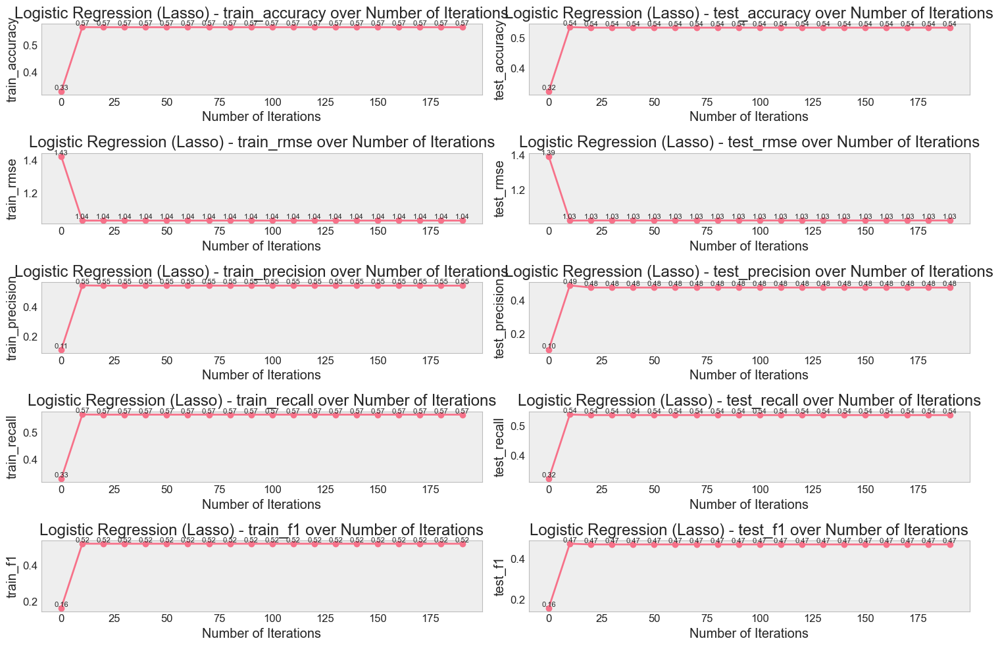

Plotting Metric: train_accuracy
Metric Data: [0.45347744360902253, 0.5502819548872181, 0.5718984962406015, 0.5714285714285714, 0.5700187969924813, 0.5700187969924813, 0.5737781954887218, 0.5718984962406015, 0.5733082706766918, 0.5728383458646616, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218]
Parameter Values: [  0  10  20  30  40  50  60  70  80  90 100 110 120 130 140 150 160 170
 180 190]
Plotting Metric: test_accuracy
Metric Data: [0.42105263157894735, 0.5338345864661654, 0.5338345864661654, 0.5300751879699248, 0.5375939849624061, 0.5394736842105263, 0.5357142857142857, 0.5375939849624061, 0.5375939849624061, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263]
Parame

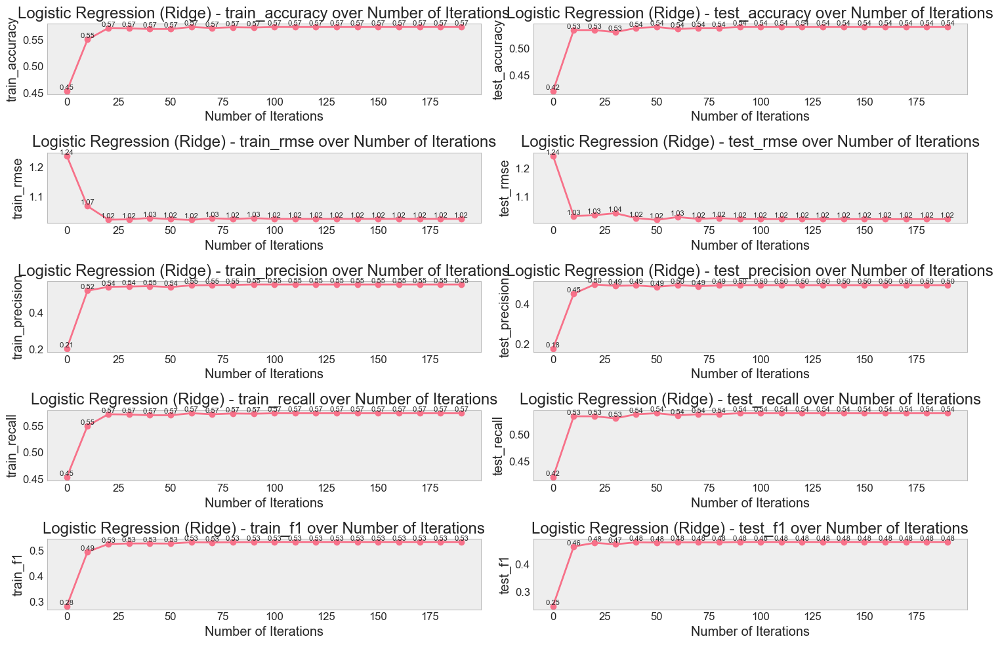

Plotting Metric: train_accuracy
Metric Data: [0.3294172932330827, 0.5671992481203008, 0.5700187969924813, 0.5714285714285714, 0.5714285714285714, 0.5723684210526315, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015]
Parameter Values: [  0  10  20  30  40  50  60  70  80  90 100 110 120 130 140 150 160 170
 180 190]
Plotting Metric: test_accuracy
Metric Data: [0.3233082706766917, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061]
Paramete

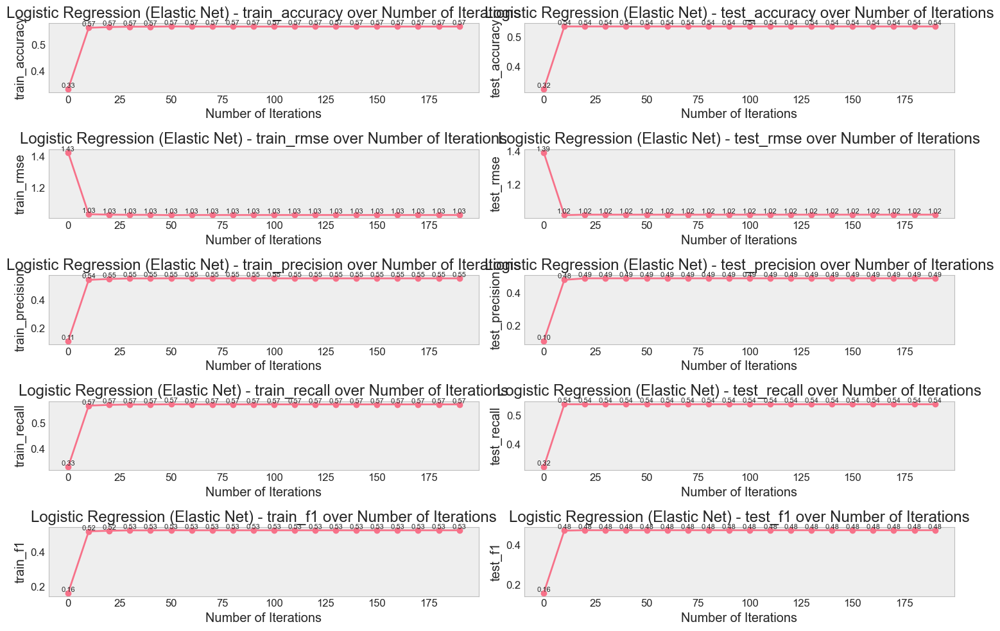

Plotting Metric: train_accuracy
Metric Data: [0.5606203007518797, 0.5676691729323309, 0.5714285714285714, 0.5676691729323309, 0.5676691729323309, 0.5671992481203008]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: test_accuracy
Metric Data: [0.5413533834586466, 0.5357142857142857, 0.5375939849624061, 0.5413533834586466, 0.5375939849624061, 0.5319548872180451]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: train_rmse
Metric Data: [1.053770530441551, 1.0369127108512135, 1.0303204115108755, 1.0375922823348784, 1.0389500917912673, 1.036459415655409]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: test_rmse
Metric Data: [1.0305484341786026, 1.025061890667704, 1.0241446091500594, 1.0167765666389865, 1.0130724502589556, 1.015851803767678]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: train_precision
Metric Data: [0.560409610239601, 0.5497472243768613, 0.5546499783888852, 0.5516020739442221, 0.554274278118567, 0.549

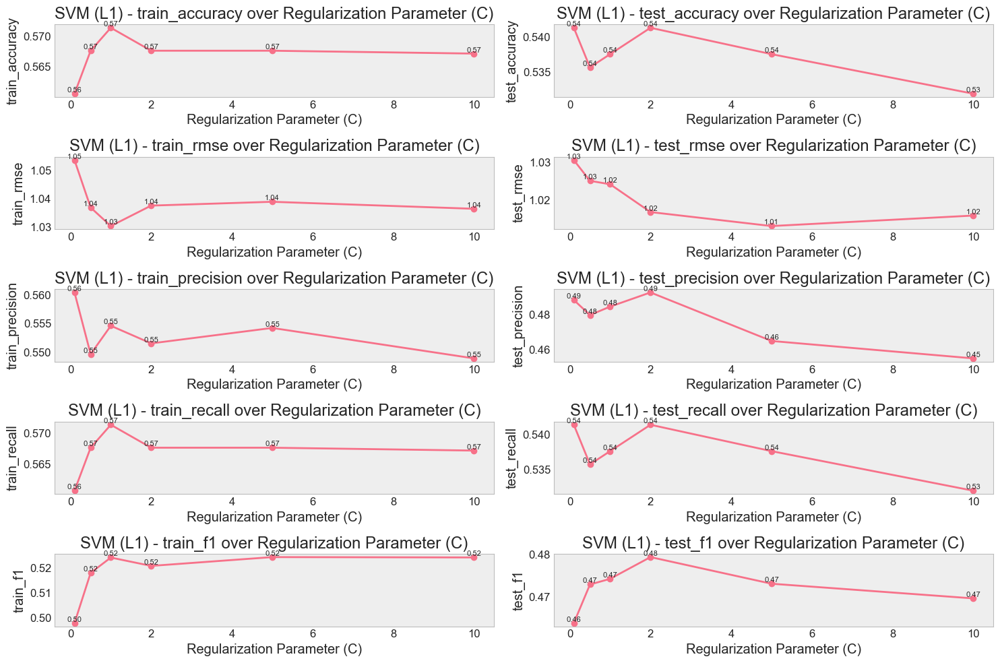

Plotting Metric: train_accuracy
Metric Data: [0.569078947368421, 0.5728383458646616, 0.5695488721804511, 0.568609022556391, 0.568609022556391, 0.5662593984962406]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: test_accuracy
Metric Data: [0.5338345864661654, 0.5375939849624061, 0.5413533834586466, 0.5338345864661654, 0.5319548872180451, 0.5300751879699248]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: train_rmse
Metric Data: [1.0362326936980524, 1.0316877915571747, 1.0325983723095058, 1.0371392841546607, 1.0371392841546607, 1.0403061290337874]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: test_rmse
Metric Data: [1.0314600207647848, 1.0213878218907677, 1.0112153039671836, 1.0149261982873063, 1.015851803767678, 1.0167765666389865]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: train_precision
Metric Data: [0.5554019762482275, 0.5630795231005391, 0.551538637978688, 0.5551199651939237, 0.5550835688419904, 0.55

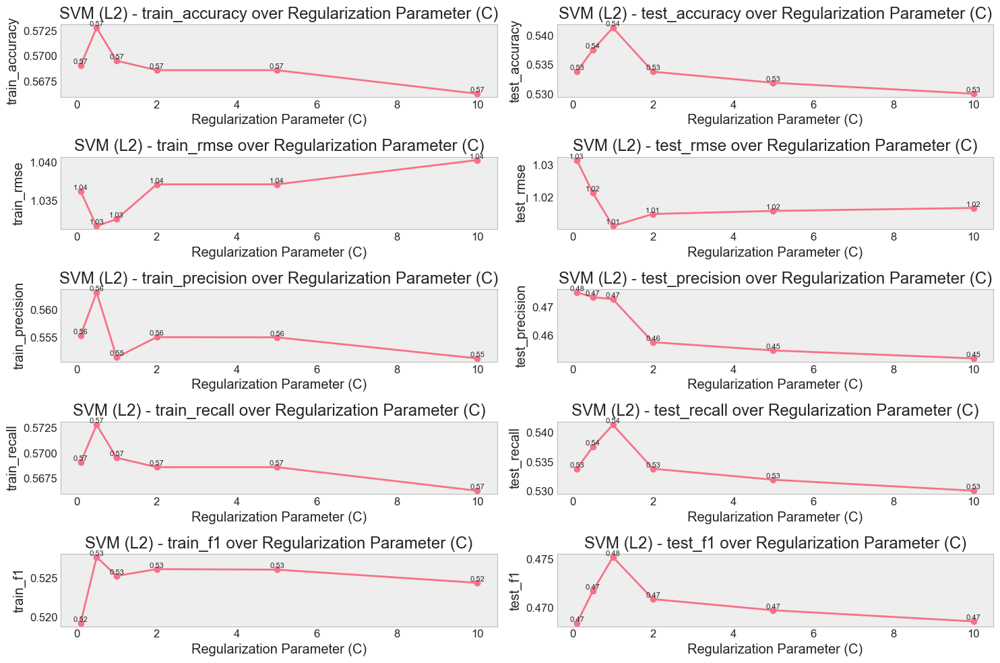

Plotting Metric: train_accuracy
Metric Data: [0.45347744360902253, 0.45347744360902253, 0.45347744360902253, 0.45347744360902253, 0.45347744360902253, 0.45347744360902253, 0.45347744360902253, 0.45347744360902253, 0.45347744360902253, 0.45347744360902253]
Parameter Values: range(1, 11)
Plotting Metric: test_accuracy
Metric Data: [0.42105263157894735, 0.42105263157894735, 0.42105263157894735, 0.42105263157894735, 0.42105263157894735, 0.42105263157894735, 0.42105263157894735, 0.42105263157894735, 0.42105263157894735, 0.42105263157894735]
Parameter Values: range(1, 11)
Plotting Metric: train_rmse
Metric Data: [1.2388601358063893, 1.2388601358063893, 1.2388601358063893, 1.2388601358063893, 1.2388601358063893, 1.2388601358063893, 1.2388601358063893, 1.2388601358063893, 1.2388601358063893, 1.2388601358063893]
Parameter Values: range(1, 11)
Plotting Metric: test_rmse
Metric Data: [1.244536934145037, 1.244536934145037, 1.244536934145037, 1.244536934145037, 1.244536934145037, 1.244536934145037,

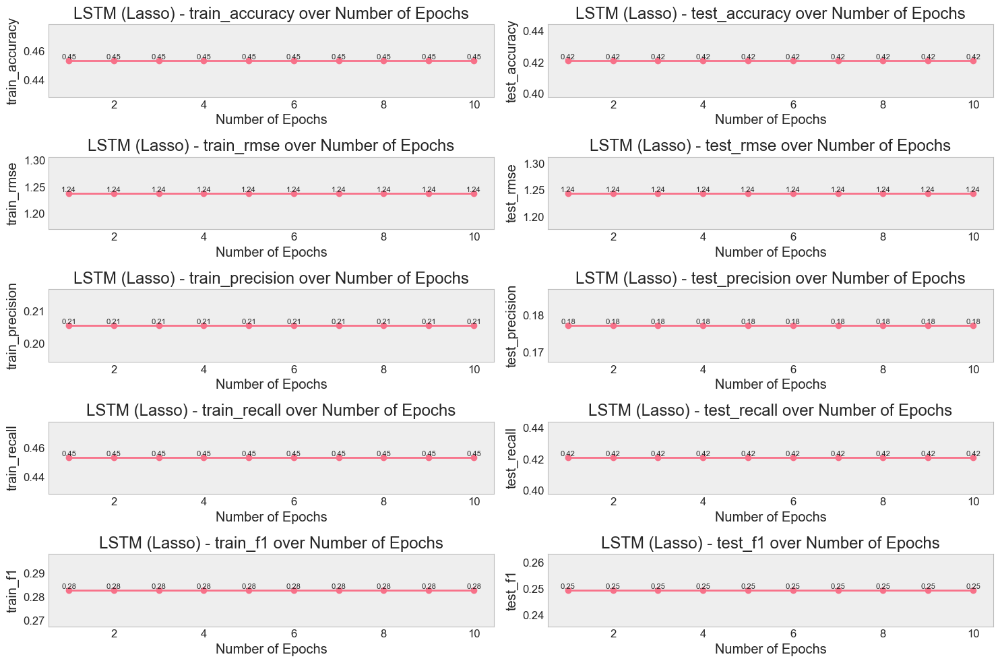

Plotting Metric: train_accuracy
Metric Data: [0.45347744360902253, 0.45347744360902253, 0.45347744360902253, 0.45347744360902253, 0.45347744360902253, 0.4008458646616541, 0.33035714285714285, 0.3580827067669173, 0.3674812030075188, 0.37546992481203006]
Parameter Values: range(1, 11)
Plotting Metric: test_accuracy
Metric Data: [0.42105263157894735, 0.42105263157894735, 0.42105263157894735, 0.42105263157894735, 0.42105263157894735, 0.37218045112781956, 0.3007518796992481, 0.3308270676691729, 0.34210526315789475, 0.3458646616541353]
Parameter Values: range(1, 11)
Plotting Metric: train_rmse
Metric Data: [1.2388601358063893, 1.2388601358063893, 1.2388601358063893, 1.2388601358063893, 1.251690586090776, 1.5621522169341182, 1.7249822925973577, 1.6680601943665208, 1.6420805617960927, 1.6305933234458447]
Parameter Values: range(1, 11)
Plotting Metric: test_rmse
Metric Data: [1.244536934145037, 1.244536934145037, 1.244536934145037, 1.244536934145037, 1.2505637826340927, 1.5906210070189333, 1.77

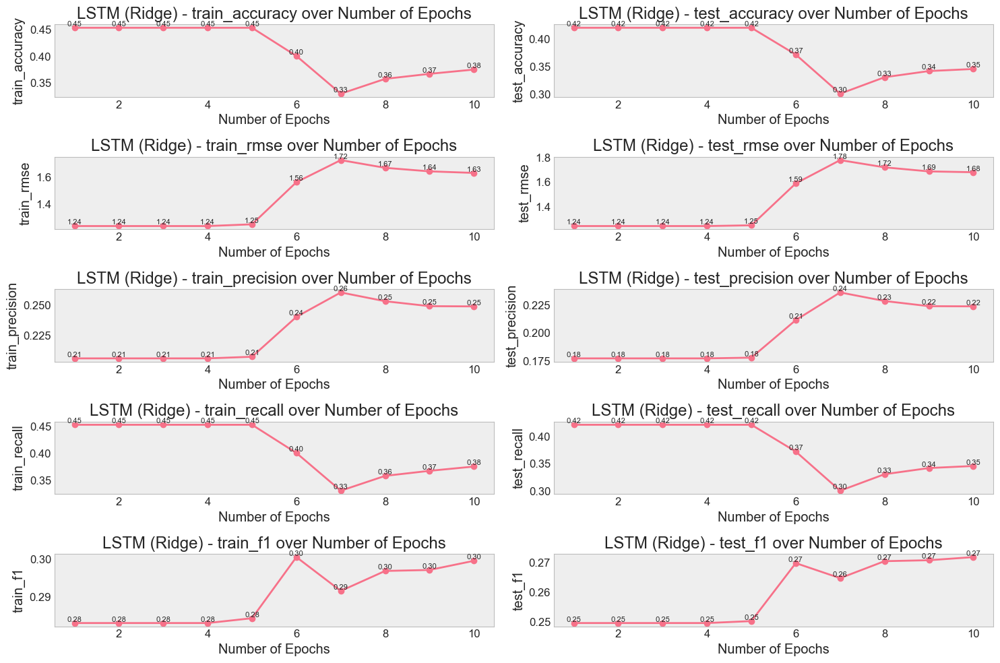

Plotting Metric: train_accuracy
Metric Data: [0.45347744360902253, 0.45347744360902253, 0.45347744360902253, 0.45347744360902253, 0.45347744360902253, 0.45347744360902253, 0.45347744360902253, 0.45347744360902253, 0.45347744360902253, 0.45347744360902253]
Parameter Values: range(1, 11)
Plotting Metric: test_accuracy
Metric Data: [0.42105263157894735, 0.42105263157894735, 0.42105263157894735, 0.42105263157894735, 0.42105263157894735, 0.42105263157894735, 0.42105263157894735, 0.42105263157894735, 0.42105263157894735, 0.42105263157894735]
Parameter Values: range(1, 11)
Plotting Metric: train_rmse
Metric Data: [1.2388601358063893, 1.2388601358063893, 1.2388601358063893, 1.2388601358063893, 1.2388601358063893, 1.2388601358063893, 1.2388601358063893, 1.2388601358063893, 1.2388601358063893, 1.2388601358063893]
Parameter Values: range(1, 11)
Plotting Metric: test_rmse
Metric Data: [1.244536934145037, 1.244536934145037, 1.244536934145037, 1.244536934145037, 1.244536934145037, 1.244536934145037,

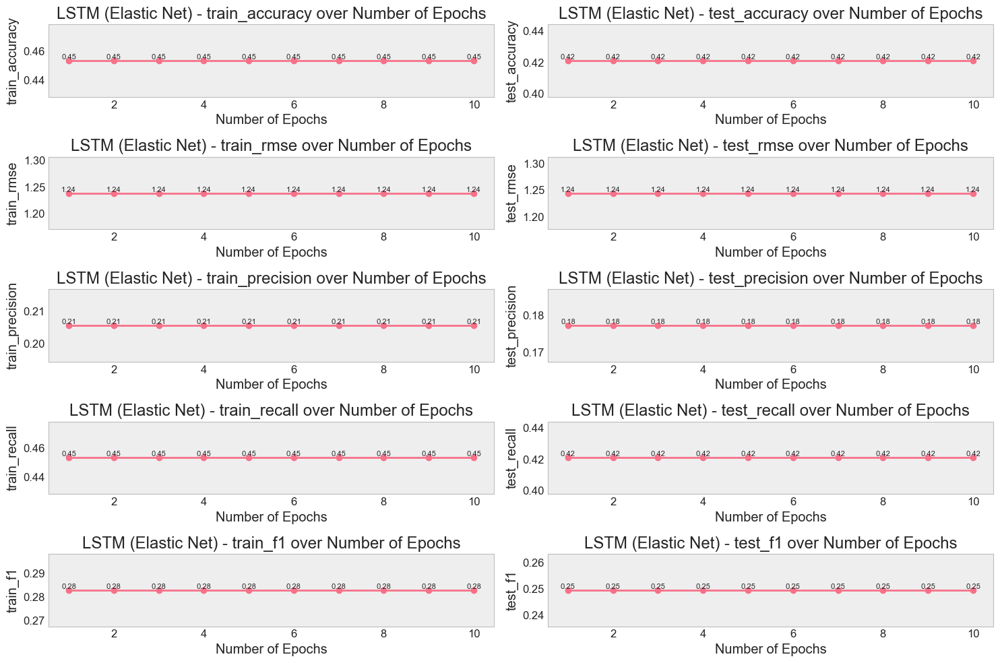

Plotting Metric: train_accuracy
Metric Data: [0.34962406015037595, 0.37406015037593987, 0.3656015037593985, 0.42152255639097747, 0.3890977443609023, 0.3355263157894737, 0.3843984962406015, 0.37640977443609025, 0.35949248120300753, 0.36137218045112784]
Parameter Values: range(1, 11)
Plotting Metric: test_accuracy
Metric Data: [0.3233082706766917, 0.3458646616541353, 0.34398496240601506, 0.38345864661654133, 0.3609022556390977, 0.3101503759398496, 0.35526315789473684, 0.33458646616541354, 0.31954887218045114, 0.33270676691729323]
Parameter Values: range(1, 11)
Plotting Metric: train_rmse
Metric Data: [1.6771910817828808, 1.6278531921022834, 1.6670738850890396, 1.507188289947007, 1.6167009013764042, 1.747716017605689, 1.6395029505347132, 1.6792911590884056, 1.7130909056812542, 1.7055305879597016]
Parameter Values: range(1, 11)
Plotting Metric: test_rmse
Metric Data: [1.7320508075688772, 1.6791512356486689, 1.7156949095210345, 1.5062526323566054, 1.647508942095828, 1.782327615598016, 1.670

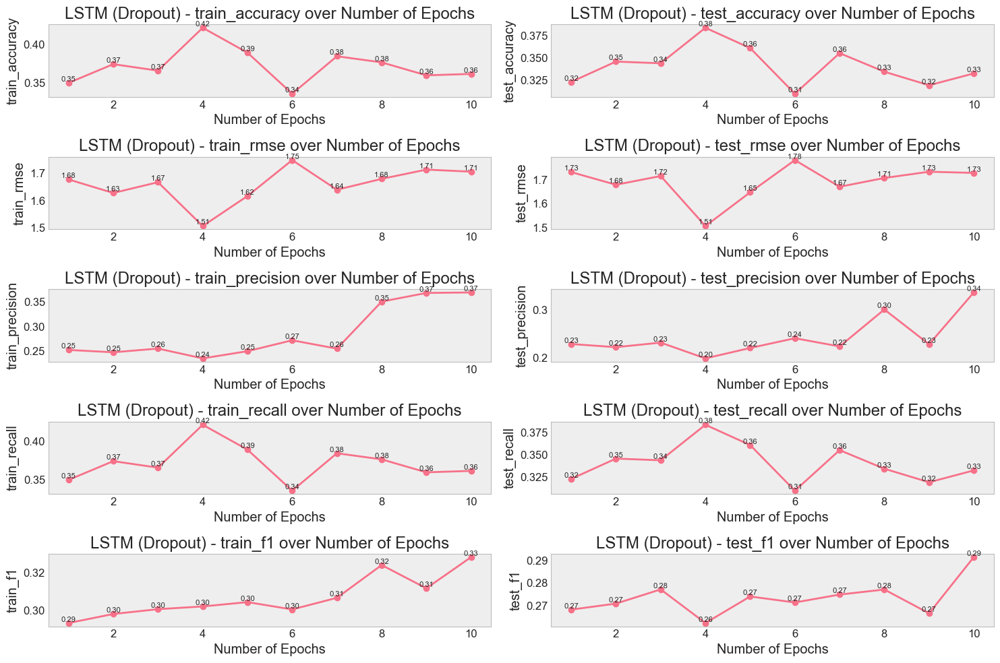

Plotting Metric: train_accuracy
Metric Data: [0.47462406015037595, 0.5098684210526315, 0.5084586466165414, 0.5070488721804511, 0.5075187969924813, 0.5, 0.5070488721804511]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: test_accuracy
Metric Data: [0.4755639097744361, 0.4774436090225564, 0.4849624060150376, 0.4793233082706767, 0.4849624060150376, 0.4943609022556391, 0.4830827067669173]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: train_rmse
Metric Data: [0.9354143466934853, 0.9384237303821558, 0.9331509399297251, 0.9323952500177375, 0.9344090649987722, 0.9354143466934853, 0.9323952500177375]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: test_rmse
Metric Data: [0.9197090092274487, 0.8906363358334124, 0.8864052604279183, 0.8800205055710713, 0.883218652412824, 0.8874649204122979, 0.8746642750135405]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: train_precision
Metric Data: [0.5630864813756029, 0.5637

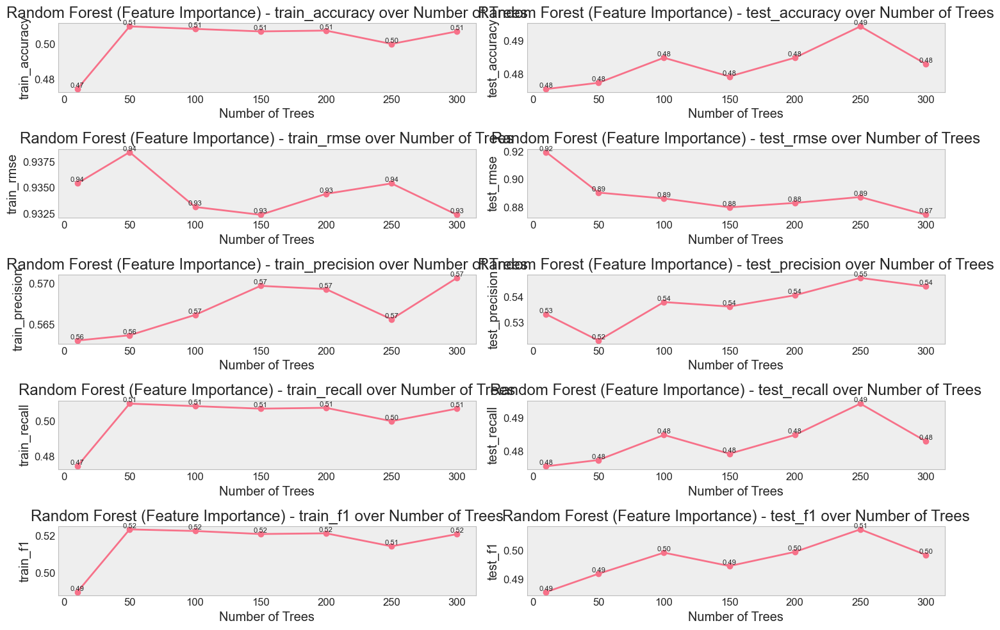

Plotting Metric: train_accuracy
Metric Data: [0.4901315789473684, 0.5023496240601504, 0.49859022556390975, 0.5014097744360902, 0.5042293233082706, 0.5042293233082706, 0.5051691729323309]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: test_accuracy
Metric Data: [0.45864661654135336, 0.48120300751879697, 0.47368421052631576, 0.4868421052631579, 0.4718045112781955, 0.4774436090225564, 0.4755639097744361]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: train_rmse
Metric Data: [0.9217505411717294, 0.935665498355064, 0.9308820297886615, 0.9286075759303216, 0.930124496477417, 0.9293663456954304, 0.9273415800097813]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: test_rmse
Metric Data: [0.9073633619871875, 0.8948474058180245, 0.8864052604279183, 0.8853443321477613, 0.896945526883037, 0.8937964983435144, 0.8948474058180245]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: train_precision
Metric Data: [0.57021761

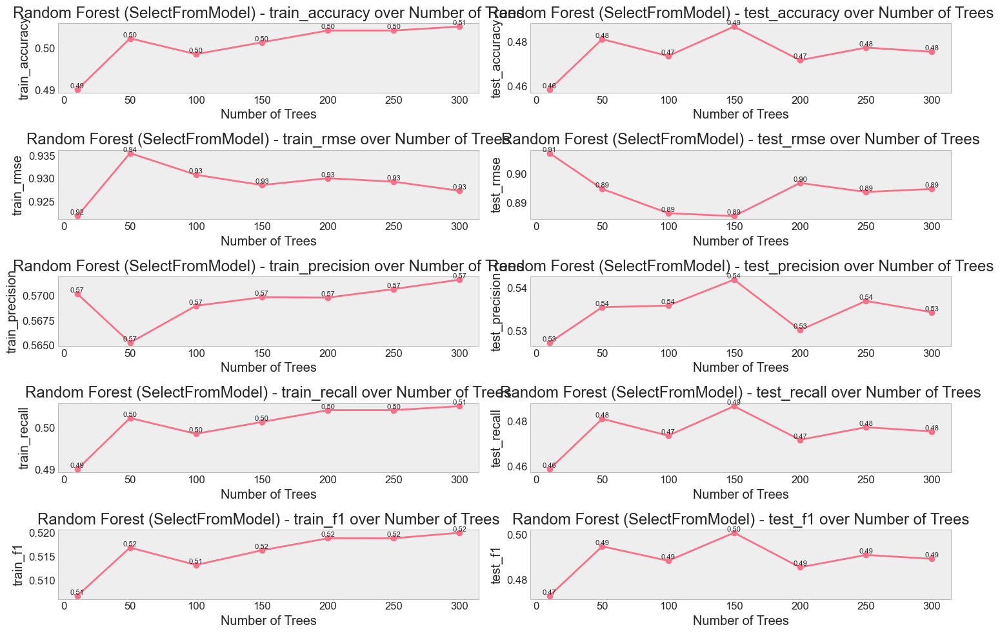

Plotting Metric: train_accuracy
Metric Data: [0.49530075187969924, 0.506578947368421, 0.506109022556391, 0.5108082706766918, 0.5042293233082706, 0.506578947368421, 0.5103383458646616]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: test_accuracy
Metric Data: [0.4605263157894737, 0.4830827067669173, 0.4774436090225564, 0.4774436090225564, 0.4774436090225564, 0.48120300751879697, 0.4849624060150376]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: train_rmse
Metric Data: [0.9212405823270683, 0.9341575755405774, 0.9306295871996703, 0.9258200997725514, 0.930124496477417, 0.9296191313238493, 0.9260738534020314]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: test_rmse
Metric Data: [0.896945526883037, 0.8937964983435144, 0.8874649204122979, 0.8874649204122979, 0.8906363358334124, 0.8821538917455415, 0.8768106936398546]
Parameter Values: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: train_precision
Metric Data: [0.574710298655

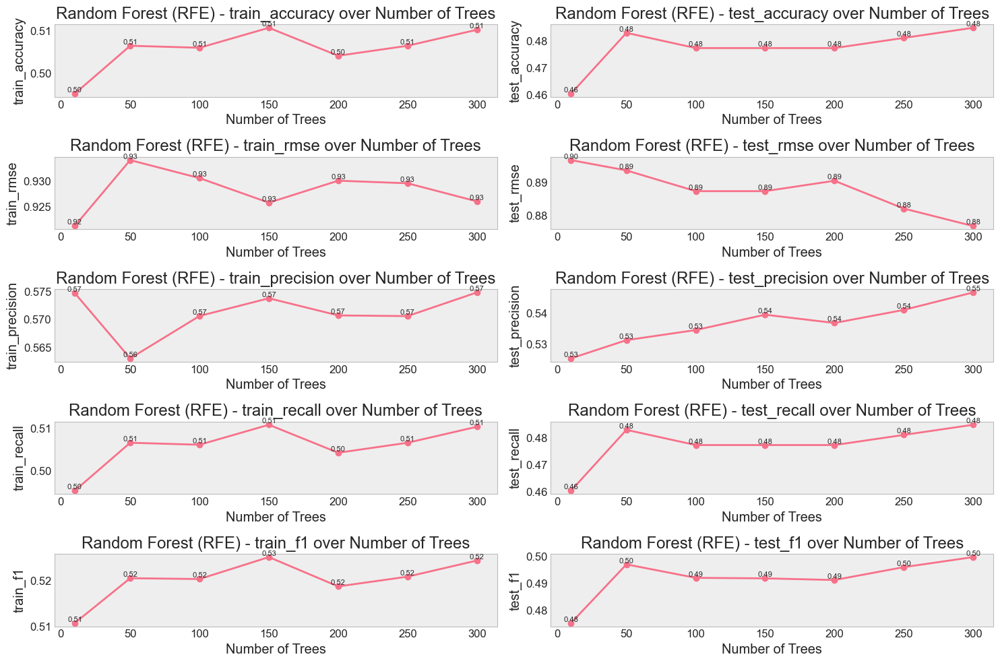

In [123]:
# Define parameter ranges
iterations = np.arange(0, 200, 10)
c_values = [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
epochs = range(1, 11)
n_estimators = [10, 50, 100, 150, 200, 250, 300]
def get_metrics(metrics_obj):
    if isinstance(metrics_obj, tuple):
        return metrics_obj[0]
    return metrics_obj
# Plot metrics for regularized models
trainer.plot_metrics(get_metrics(metrics_logistic_l1), "Logistic Regression (Lasso)", 
                    param_values=iterations,
                    param_name="Number of Iterations")

trainer.plot_metrics(get_metrics(metrics_logistic_l2), "Logistic Regression (Ridge)", 
                    param_values=iterations,
                    param_name="Number of Iterations")

trainer.plot_metrics(get_metrics(metrics_logistic_l1_l2), "Logistic Regression (Elastic Net)", 
                    param_values=iterations,
                    param_name="Number of Iterations")

trainer.plot_metrics(get_metrics(metrics_svm_l1), "SVM (L1)", 
                    param_values=c_values,
                    param_name="Regularization Parameter (C)")

trainer.plot_metrics(get_metrics(metrics_svm_l2), "SVM (L2)", 
                    param_values=c_values,
                    param_name="Regularization Parameter (C)")

trainer.plot_metrics(get_metrics(metrics_lstm_l1), "LSTM (Lasso)", 
                    param_values=epochs,
                    param_name="Number of Epochs")

trainer.plot_metrics(get_metrics(metrics_lstm_l2), "LSTM (Ridge)", 
                    param_values=epochs,
                    param_name="Number of Epochs")

trainer.plot_metrics(get_metrics(metrics_lstm_l1_l2), "LSTM (Elastic Net)", 
                    param_values=epochs,
                    param_name="Number of Epochs")

trainer.plot_metrics(get_metrics(metrics_lstm_dropout), "LSTM (Dropout)", 
                    param_values=epochs,
                    param_name="Number of Epochs")

trainer.plot_metrics(get_metrics(metrics_rf_importance), "Random Forest (Feature Importance)", 
                    param_values=n_estimators,
                    param_name="Number of Trees")

trainer.plot_metrics(get_metrics(metrics_rf_l1), "Random Forest (SelectFromModel)", 
                    param_values=n_estimators,
                    param_name="Number of Trees")

trainer.plot_metrics(get_metrics(metrics_rf_rfe), "Random Forest (RFE)", 
                    param_values=n_estimators,
                    param_name="Number of Trees")

## K-Fold Validation

In [124]:
missing_features = ['Home Team', 'Match Outcome', 'Date'] # removed during feature selection

logistic_df = df[missing_features + logistic_features]
knn_df = df[missing_features + knn_features]
svm_df = df[missing_features + svm_features]
lstm_df = df[missing_features + lstm_features]
rf_df = df[missing_features + rf_features]
rdnboost_df = df.copy()
# encoding and standardising for each of the four feature sets
logistic_df = encode_teams(logistic_df)
knn_df = encode_teams(knn_df)
svm_df = encode_teams(svm_df)
lstm_df = encode_teams(lstm_df)
rf_df = encode_teams(rf_df)
rdnboost_df = encode_teams(rdnboost_df)


logistic_df = standardize_features(logistic_df, logistic_features)
knn_df = standardize_features(knn_df, knn_features)
svm_df = standardize_features(svm_df, svm_features)
lstm_df = standardize_features(lstm_df, lstm_features)
rf_df = standardize_features(rf_df, rf_features)
rdnboost_df = standardize_features(rdnboost_df, None)

# split the data into X (data) and y (target) for training and testing
logistic_train_df, logistic_test_df = chronological_split(logistic_df)
knn_train_df, knn_test_df = chronological_split(knn_df)
svm_train_df, svm_test_df = chronological_split(svm_df)
lstm_train_df, lstm_test_df = chronological_split(lstm_df)
rf_train_df, rf_test_df = chronological_split(rf_df)
rdnboost_train_df, rdnboost_test_df = chronological_split(rdnboost_df)

logistic_X_train, logistic_y_train = logistic_train_df.drop('Match Outcome', axis=1), logistic_train_df['Match Outcome']
logistic_X_test, logistic_y_test = logistic_test_df.drop('Match Outcome', axis=1), logistic_test_df['Match Outcome']

knn_X_train, knn_y_train = knn_train_df.drop('Match Outcome', axis=1), knn_train_df['Match Outcome']
knn_X_test, knn_y_test = knn_test_df.drop('Match Outcome', axis=1), knn_test_df['Match Outcome']

svm_X_train, svm_y_train = svm_train_df.drop('Match Outcome', axis=1), svm_train_df['Match Outcome']
svm_X_test, svm_y_test = svm_test_df.drop('Match Outcome', axis=1), svm_test_df['Match Outcome']

lstm_X_train, lstm_y_train = lstm_train_df.drop('Match Outcome', axis=1), lstm_train_df['Match Outcome']
lstm_X_test, lstm_y_test = lstm_test_df.drop('Match Outcome', axis=1), lstm_test_df['Match Outcome']

rf_X_train, rf_y_train = rf_train_df.drop('Match Outcome', axis=1), rf_train_df['Match Outcome']
rf_X_test, rf_y_test = rf_test_df.drop('Match Outcome', axis=1), rf_test_df['Match Outcome']

rdnboost_X_train, rdnboost_y_train = rdnboost_train_df.drop('Match Outcome', axis=1), rdnboost_train_df['Match Outcome']
rdnboost_X_test, rdnboost_y_test = rdnboost_test_df.drop('Match Outcome', axis=1), rdnboost_test_df['Match Outcome']



In [125]:
class KFoldModelWrapper:
    def __init__(self, n_splits=10, random_state=42):
        self.n_splits = n_splits
        self.kf = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)
        
    def evaluate_model(self, model_fn, X, y, **model_params):
        # model_fn creates and returnas model
        # X; features dataframe
        # y; target array
        
        fold_metrics = {
            'accuracy': [],
            'precision': [],
            'recall': [],
            'f1': [],
            'rmse': []
        }
        
        for fold, (train_idx, val_idx) in enumerate(self.kf.split(X), 1):
            X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
            y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
            
            # Create and train model
            model = model_fn(**model_params)
            model.fit(X_train, y_train)
            
            # Get predictions
            y_pred = model.predict(X_val)
            
            # Calculate metrics
            fold_metrics['accuracy'].append(accuracy_score(y_val, y_pred))
            precision, recall, f1, _ = precision_recall_fscore_support(y_val, y_pred, average='weighted')
            fold_metrics['precision'].append(precision)
            fold_metrics['recall'].append(recall)
            fold_metrics['f1'].append(f1)
            fold_metrics['rmse'].append(np.sqrt(np.mean((y_val - y_pred) ** 2)))
            
            print(f"\nFold {fold} Results:")
            print(f"Accuracy: {fold_metrics['accuracy'][-1]:.4f}")
            print(f"Precision: {fold_metrics['precision'][-1]:.4f}")
            print(f"Recall: {fold_metrics['recall'][-1]:.4f}")
            print(f"F1: {fold_metrics['f1'][-1]:.4f}")
            print(f"RMSE: {fold_metrics['rmse'][-1]:.4f}")
        
        # Calculate and store averages
        avg_metrics = {
            'avg_accuracy': np.mean(fold_metrics['accuracy']),
            'std_accuracy': np.std(fold_metrics['accuracy']),
            'avg_precision': np.mean(fold_metrics['precision']),
            'std_precision': np.std(fold_metrics['precision']),
            'avg_recall': np.mean(fold_metrics['recall']),
            'std_recall': np.std(fold_metrics['recall']),
            'avg_f1': np.mean(fold_metrics['f1']),
            'std_f1': np.std(fold_metrics['f1']),
            'avg_rmse': np.mean(fold_metrics['rmse']),
            'std_rmse': np.std(fold_metrics['rmse'])
        }
        
        return fold_metrics, avg_metrics

    def plot_kfold_results(self, fold_metrics, model_name):
        """
        Creates beautiful plots for k-fold validation results with enhanced styling
        """
        # Set style
        sns.set_style("whitegrid")
        colors = ['#2ecc71', '#3498db', '#e74c3c', '#f1c40f', '#9b59b6']
        
        # Create figure
        fig = plt.figure(figsize=(15, 10))
        fig.suptitle(f'K-Fold Cross Validation Results: {model_name}', 
                    fontsize=16, fontweight='bold', y=1.02)
        
        # Define metrics and their display names
        metrics = {
            'accuracy': 'Accuracy',
            'precision': 'Precision',
            'recall': 'Recall',
            'f1': 'F1 Score',
            'rmse': 'RMSE'
        }
        
        for i, (metric, display_name) in enumerate(metrics.items(), 1):
            ax = plt.subplot(2, 3, i)
            values = fold_metrics[metric]
            mean_val = np.mean(values)
            std_val = np.std(values)
            
            # Plot individual fold results
            ax.plot(range(1, len(values) + 1), values, 'o-', 
                    color=colors[i-1], linewidth=2, 
                    label=f'Fold Scores', markersize=8)
            
            # Plot mean line
            ax.axhline(y=mean_val, color='gray', linestyle='--', 
                    label=f'Mean: {mean_val:.3f}')
            
            # Add confidence interval
            ax.fill_between(range(1, len(values) + 1), 
                            mean_val - std_val, mean_val + std_val,
                            alpha=0.2, color=colors[i-1],
                            label=f'±1 std: {std_val:.3f}')
            
            # Customize plot
            ax.set_title(f'{display_name}', fontsize=12, pad=10)
            ax.set_xlabel('Fold Number', fontsize=10)
            ax.set_ylabel(display_name, fontsize=10)
            ax.grid(True, alpha=0.3)
            ax.legend(loc='lower right', fontsize=8)
            
            # Add value annotations
            for j, value in enumerate(values, 1):
                ax.annotate(f'{value:.3f}', 
                        (j, value), 
                        textcoords="offset points",
                        xytext=(0,10), 
                        ha='center',
                        fontsize=8)
                
            # Set y-axis limits with padding
            ymin = min(values) - std_val
            ymax = max(values) + std_val
            ax.set_ylim(ymin - 0.05*(ymax-ymin), ymax + 0.05*(ymax-ymin))
            
            # Set x-axis ticks
            ax.set_xticks(range(1, len(values) + 1))
        
        # Add a text box with summary statistics
        summary_text = (
            f"Summary Statistics for {model_name}\n"
            f"{'='*40}\n"
            f"Metric     Mean ± Std     Min    Max\n"
            f"{'-'*40}\n"
        )
        for metric, display_name in metrics.items():
            values = fold_metrics[metric]
            summary_text += (
                f"{display_name:<10} "
                f"{np.mean(values):.3f} ± {np.std(values):.3f}  "
                f"{np.min(values):.3f}  {np.max(values):.3f}\n"
            )
        
        # Add text box
        plt.figtext(0.5, -0.1, summary_text,
                    ha='center', va='center',
                    bbox=dict(boxstyle='round,pad=1', 
                            facecolor='white',
                            alpha=0.8,
                            edgecolor='gray'),
                    fontfamily='monospace',
                    fontsize=10)
        
        # Adjust layout
        plt.tight_layout()
        plt.subplots_adjust(bottom=0.2)
        
        # Show plot
        plt.show()


Evaluating Logistic Regression...

Fold 1 Results:
Accuracy: 0.5657
Precision: 0.4942
Recall: 0.5657
F1: 0.5185
RMSE: 1.0128

Fold 2 Results:
Accuracy: 0.4906
Precision: 0.4616
Recall: 0.4906
F1: 0.4443
RMSE: 1.1332

Fold 3 Results:
Accuracy: 0.5305
Precision: 0.4881
Recall: 0.5305
F1: 0.4975
RMSE: 1.0470

Fold 4 Results:
Accuracy: 0.5482
Precision: 0.5561
Recall: 0.5482
F1: 0.4949
RMSE: 1.0694

Fold 5 Results:
Accuracy: 0.5529
Precision: 0.5081
Recall: 0.5529
F1: 0.5095
RMSE: 1.0672


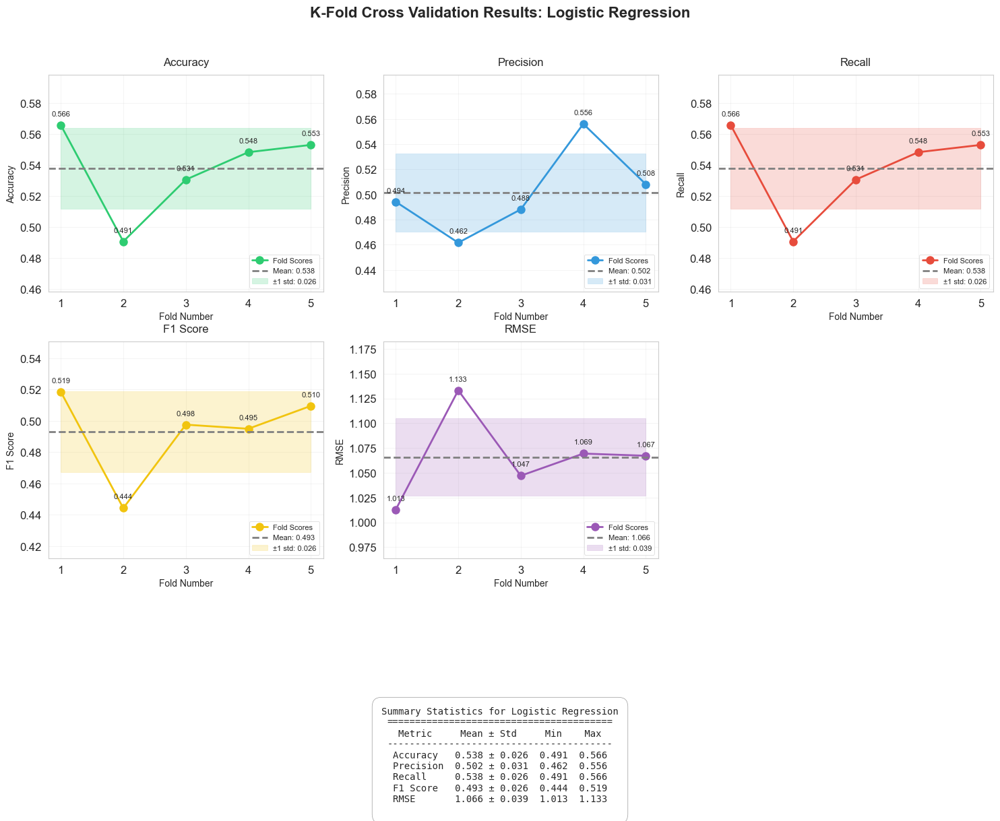


Logistic Regression Average Results:
avg_accuracy: 0.5376
std_accuracy: 0.0261
avg_precision: 0.5016
std_precision: 0.0312
avg_recall: 0.5376
std_recall: 0.0261
avg_f1: 0.4929
std_f1: 0.0258
avg_rmse: 1.0659
std_rmse: 0.0393

Evaluating SVM...

Fold 1 Results:
Accuracy: 0.5540
Precision: 0.4849
Recall: 0.5540
F1: 0.5085
RMSE: 1.0357

Fold 2 Results:
Accuracy: 0.4765
Precision: 0.4496
Recall: 0.4765
F1: 0.4345
RMSE: 1.1516

Fold 3 Results:
Accuracy: 0.5117
Precision: 0.4447
Recall: 0.5117
F1: 0.4586
RMSE: 1.1207

Fold 4 Results:
Accuracy: 0.5435
Precision: 0.5156
Recall: 0.5435
F1: 0.4954
RMSE: 1.0616

Fold 5 Results:
Accuracy: 0.5318
Precision: 0.5055
Recall: 0.5318
F1: 0.4917
RMSE: 1.1157


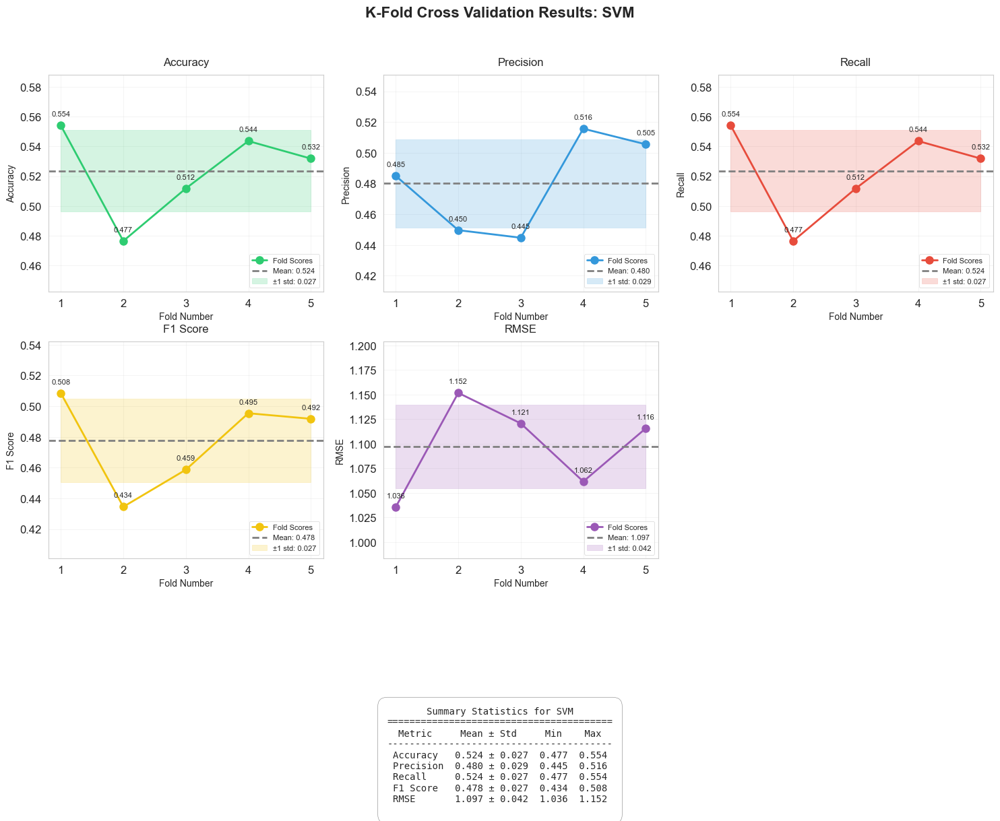


SVM Average Results:
avg_accuracy: 0.5235
std_accuracy: 0.0274
avg_precision: 0.4801
std_precision: 0.0287
avg_recall: 0.5235
std_recall: 0.0274
avg_f1: 0.4777
std_f1: 0.0272
avg_rmse: 1.0971
std_rmse: 0.0422

Evaluating KNN...

Fold 1 Results:
Accuracy: 0.4836
Precision: 0.4889
Recall: 0.4836
F1: 0.4831
RMSE: 1.0984

Fold 2 Results:
Accuracy: 0.4296
Precision: 0.4148
Recall: 0.4296
F1: 0.4194
RMSE: 1.1598

Fold 3 Results:
Accuracy: 0.4718
Precision: 0.4797
Recall: 0.4718
F1: 0.4669
RMSE: 1.1259

Fold 4 Results:
Accuracy: 0.4824
Precision: 0.4737
Recall: 0.4824
F1: 0.4750
RMSE: 1.1061

Fold 5 Results:
Accuracy: 0.5012
Precision: 0.4992
Recall: 0.5012
F1: 0.4981
RMSE: 1.0649


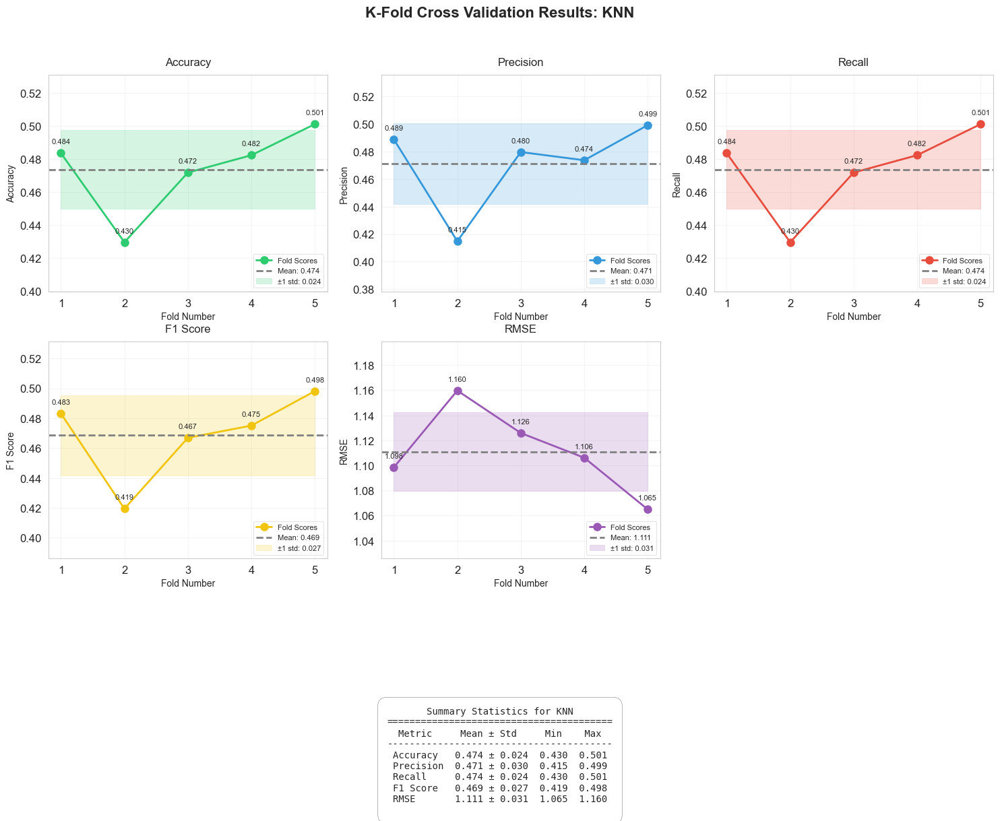


KNN Average Results:
avg_accuracy: 0.4737
std_accuracy: 0.0240
avg_precision: 0.4713
std_precision: 0.0295
avg_recall: 0.4737
std_recall: 0.0240
avg_f1: 0.4685
std_f1: 0.0266
avg_rmse: 1.1110
std_rmse: 0.0313

Evaluating Random Forest...

Fold 1 Results:
Accuracy: 0.5469
Precision: 0.5057
Recall: 0.5469
F1: 0.5109
RMSE: 1.0626

Fold 2 Results:
Accuracy: 0.4765
Precision: 0.4729
Recall: 0.4765
F1: 0.4324
RMSE: 1.1698

Fold 3 Results:
Accuracy: 0.5258
Precision: 0.4343
Recall: 0.5258
F1: 0.4690
RMSE: 1.0692

Fold 4 Results:
Accuracy: 0.5176
Precision: 0.4879
Recall: 0.5176
F1: 0.4648
RMSE: 1.1093

Fold 5 Results:
Accuracy: 0.5365
Precision: 0.5126
Recall: 0.5365
F1: 0.5008
RMSE: 1.1008


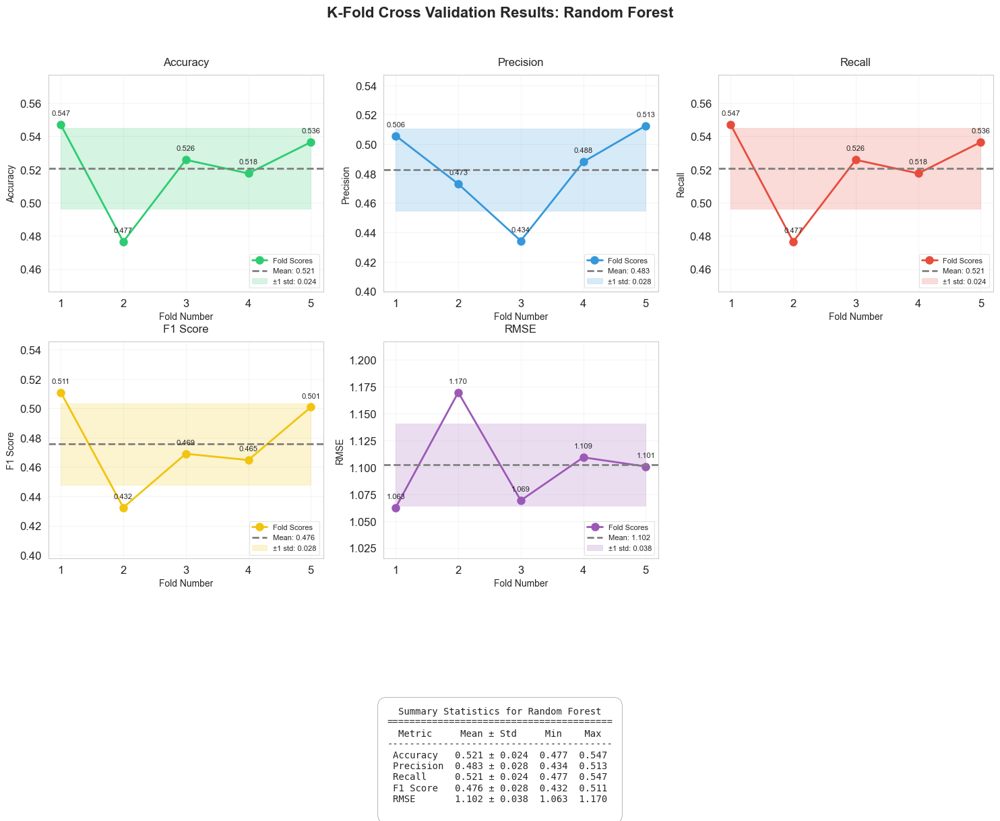


Random Forest Average Results:
avg_accuracy: 0.5207
std_accuracy: 0.0242
avg_precision: 0.4827
std_precision: 0.0279
avg_recall: 0.5207
std_recall: 0.0242
avg_f1: 0.4756
std_f1: 0.0280
avg_rmse: 1.1024
std_rmse: 0.0382

Evaluating RDNBoost...
Class weights: {0: 1.0005878894767783, 1: 1.5088652482269505, 2: 0.7474747474747475}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


[0]	validation_0-mlogloss:1.08046	validation_1-mlogloss:1.08093
[1]	validation_0-mlogloss:1.06528	validation_1-mlogloss:1.06525
[2]	validation_0-mlogloss:1.05296	validation_1-mlogloss:1.05354
[3]	validation_0-mlogloss:1.04065	validation_1-mlogloss:1.04461
[4]	validation_0-mlogloss:1.03039	validation_1-mlogloss:1.03636
[5]	validation_0-mlogloss:1.02068	validation_1-mlogloss:1.02916
[6]	validation_0-mlogloss:1.01232	validation_1-mlogloss:1.02287
[7]	validation_0-mlogloss:1.00450	validation_1-mlogloss:1.01666
[8]	validation_0-mlogloss:0.99968	validation_1-mlogloss:1.01263
[9]	validation_0-mlogloss:0.99500	validation_1-mlogloss:1.00858
[10]	validation_0-mlogloss:0.98988	validation_1-mlogloss:1.00540
[11]	validation_0-mlogloss:0.98533	validation_1-mlogloss:1.00219
[12]	validation_0-mlogloss:0.98135	validation_1-mlogloss:0.99879
[13]	validation_0-mlogloss:0.97888	validation_1-mlogloss:0.99750
[14]	validation_0-mlogloss:0.97524	validation_1-mlogloss:0.99536
[15]	validation_0-mlogloss:0.97289	

/Users/lukemciver/football/venv/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [14:02:26] WARNING: /private/var/folders/06/bvfn_ss977sd_c5gb17ymlfh0000gn/T/pip-install-7vi_l3eh/xgboost_7614077fb869492ca845d09ecf74ae30/cpp_src/src/learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/skl


Fold 1 Results:
Accuracy: 0.5540
Precision: 0.4359
Recall: 0.5540
F1: 0.4824
RMSE: 1.0855
Class weights: {0: 1.029643073200242, 1: 1.5715604801477379, 2: 0.7181434599156118}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


[0]	validation_0-mlogloss:1.07301	validation_1-mlogloss:1.07898
[1]	validation_0-mlogloss:1.05206	validation_1-mlogloss:1.06445
[2]	validation_0-mlogloss:1.03328	validation_1-mlogloss:1.05203
[3]	validation_0-mlogloss:1.01767	validation_1-mlogloss:1.04342
[4]	validation_0-mlogloss:1.00420	validation_1-mlogloss:1.03510
[5]	validation_0-mlogloss:0.99376	validation_1-mlogloss:1.02978
[6]	validation_0-mlogloss:0.98482	validation_1-mlogloss:1.02488
[7]	validation_0-mlogloss:0.97701	validation_1-mlogloss:1.02073
[8]	validation_0-mlogloss:0.97002	validation_1-mlogloss:1.01814
[9]	validation_0-mlogloss:0.96317	validation_1-mlogloss:1.01463
[10]	validation_0-mlogloss:0.95860	validation_1-mlogloss:1.01328
[11]	validation_0-mlogloss:0.95322	validation_1-mlogloss:1.01132
[12]	validation_0-mlogloss:0.94867	validation_1-mlogloss:1.00997
[13]	validation_0-mlogloss:0.94421	validation_1-mlogloss:1.00781
[14]	validation_0-mlogloss:0.94059	validation_1-mlogloss:1.00793
[15]	validation_0-mlogloss:0.93898	

/Users/lukemciver/football/venv/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [14:03:00] WARNING: /private/var/folders/06/bvfn_ss977sd_c5gb17ymlfh0000gn/T/pip-install-7vi_l3eh/xgboost_7614077fb869492ca845d09ecf74ae30/cpp_src/src/learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/skl


Fold 2 Results:
Accuracy: 0.4765
Precision: 0.3639
Recall: 0.4765
F1: 0.4056
RMSE: 1.1759
Class weights: {0: 0.9866666666666667, 1: 1.5416666666666667, 2: 0.7474747474747475}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


[0]	validation_0-mlogloss:1.07578	validation_1-mlogloss:1.08168
[1]	validation_0-mlogloss:1.05619	validation_1-mlogloss:1.06903
[2]	validation_0-mlogloss:1.03846	validation_1-mlogloss:1.05798
[3]	validation_0-mlogloss:1.02284	validation_1-mlogloss:1.04789
[4]	validation_0-mlogloss:1.01154	validation_1-mlogloss:1.03991
[5]	validation_0-mlogloss:1.00224	validation_1-mlogloss:1.03443
[6]	validation_0-mlogloss:0.99316	validation_1-mlogloss:1.03053
[7]	validation_0-mlogloss:0.98557	validation_1-mlogloss:1.02789
[8]	validation_0-mlogloss:0.97851	validation_1-mlogloss:1.02521
[9]	validation_0-mlogloss:0.97249	validation_1-mlogloss:1.02222
[10]	validation_0-mlogloss:0.96753	validation_1-mlogloss:1.02012
[11]	validation_0-mlogloss:0.96161	validation_1-mlogloss:1.01920
[12]	validation_0-mlogloss:0.95635	validation_1-mlogloss:1.01832
[13]	validation_0-mlogloss:0.95233	validation_1-mlogloss:1.01728
[14]	validation_0-mlogloss:0.94821	validation_1-mlogloss:1.01743
[15]	validation_0-mlogloss:0.94578	

/Users/lukemciver/football/venv/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [14:03:27] WARNING: /private/var/folders/06/bvfn_ss977sd_c5gb17ymlfh0000gn/T/pip-install-7vi_l3eh/xgboost_7614077fb869492ca845d09ecf74ae30/cpp_src/src/learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (


Fold 3 Results:
Accuracy: 0.5399
Precision: 0.5284
Recall: 0.5399
F1: 0.4743
RMSE: 1.0855
Class weights: {0: 1.011883541295306, 1: 1.5510018214936248, 2: 0.7315292096219931}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


[0]	validation_0-mlogloss:1.07608	validation_1-mlogloss:1.08009
[1]	validation_0-mlogloss:1.05748	validation_1-mlogloss:1.06531
[2]	validation_0-mlogloss:1.04185	validation_1-mlogloss:1.05353
[3]	validation_0-mlogloss:1.03104	validation_1-mlogloss:1.04496
[4]	validation_0-mlogloss:1.01966	validation_1-mlogloss:1.03736
[5]	validation_0-mlogloss:1.00957	validation_1-mlogloss:1.02972
[6]	validation_0-mlogloss:1.00106	validation_1-mlogloss:1.02459
[7]	validation_0-mlogloss:0.99397	validation_1-mlogloss:1.01962
[8]	validation_0-mlogloss:0.98716	validation_1-mlogloss:1.01516
[9]	validation_0-mlogloss:0.98259	validation_1-mlogloss:1.01193
[10]	validation_0-mlogloss:0.97932	validation_1-mlogloss:1.00929
[11]	validation_0-mlogloss:0.97528	validation_1-mlogloss:1.00754
[12]	validation_0-mlogloss:0.97072	validation_1-mlogloss:1.00650
[13]	validation_0-mlogloss:0.96784	validation_1-mlogloss:1.00404
[14]	validation_0-mlogloss:0.96565	validation_1-mlogloss:1.00286
[15]	validation_0-mlogloss:0.96390	

/Users/lukemciver/football/venv/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [14:03:42] WARNING: /private/var/folders/06/bvfn_ss977sd_c5gb17ymlfh0000gn/T/pip-install-7vi_l3eh/xgboost_7614077fb869492ca845d09ecf74ae30/cpp_src/src/learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/skl


Fold 4 Results:
Accuracy: 0.5341
Precision: 0.4136
Recall: 0.5341
F1: 0.4587
RMSE: 1.0890
Class weights: {0: 1.0321212121212122, 1: 1.5057471264367817, 2: 0.7315292096219931}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


[0]	validation_0-mlogloss:1.07519	validation_1-mlogloss:1.08294
[1]	validation_0-mlogloss:1.05550	validation_1-mlogloss:1.07210
[2]	validation_0-mlogloss:1.03878	validation_1-mlogloss:1.06100
[3]	validation_0-mlogloss:1.02581	validation_1-mlogloss:1.05400
[4]	validation_0-mlogloss:1.01464	validation_1-mlogloss:1.04830
[5]	validation_0-mlogloss:1.00444	validation_1-mlogloss:1.04313
[6]	validation_0-mlogloss:0.99588	validation_1-mlogloss:1.03855
[7]	validation_0-mlogloss:0.98938	validation_1-mlogloss:1.03589
[8]	validation_0-mlogloss:0.98286	validation_1-mlogloss:1.03450
[9]	validation_0-mlogloss:0.97853	validation_1-mlogloss:1.03338
[10]	validation_0-mlogloss:0.97428	validation_1-mlogloss:1.03155
[11]	validation_0-mlogloss:0.96916	validation_1-mlogloss:1.02986
[12]	validation_0-mlogloss:0.96546	validation_1-mlogloss:1.02866
[13]	validation_0-mlogloss:0.96317	validation_1-mlogloss:1.02818
[14]	validation_0-mlogloss:0.96063	validation_1-mlogloss:1.02641
[15]	validation_0-mlogloss:0.95907	

/Users/lukemciver/football/venv/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [14:04:15] WARNING: /private/var/folders/06/bvfn_ss977sd_c5gb17ymlfh0000gn/T/pip-install-7vi_l3eh/xgboost_7614077fb869492ca845d09ecf74ae30/cpp_src/src/learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))



Fold 5 Results:
Accuracy: 0.5365
Precision: 0.4282
Recall: 0.5365
F1: 0.4673
RMSE: 1.1199


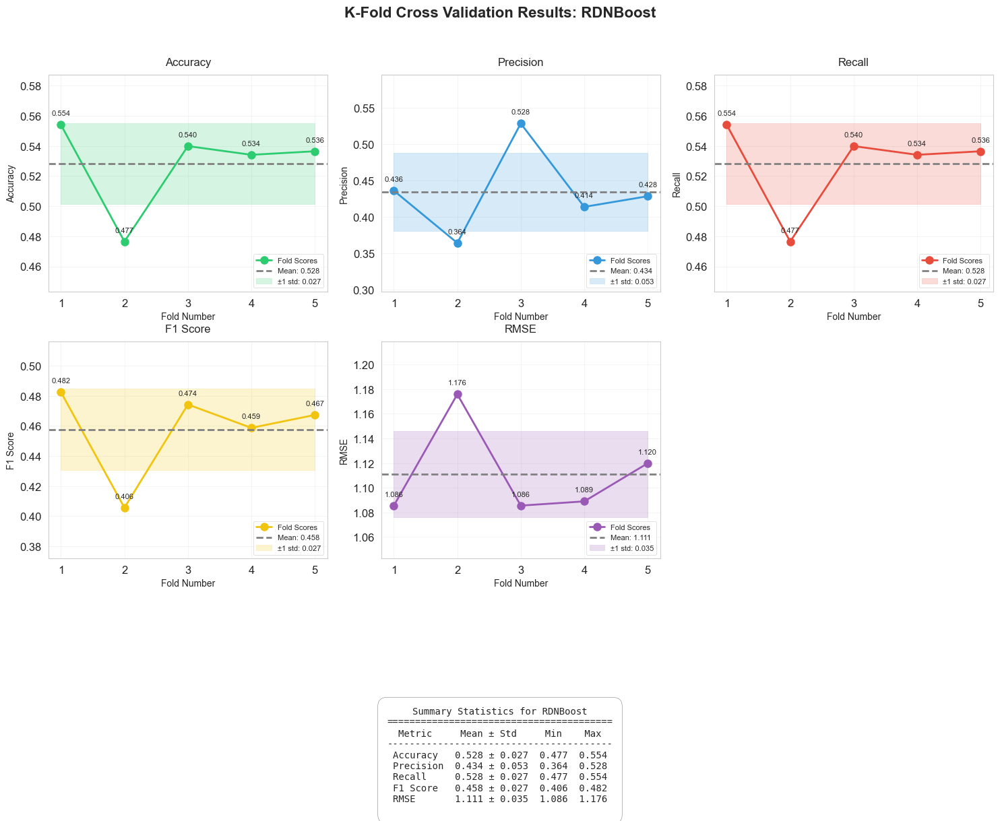


RDNBoost Average Results:
avg_accuracy: 0.5282
std_accuracy: 0.0267
avg_precision: 0.4340
std_precision: 0.0534
avg_recall: 0.5282
std_recall: 0.0267
avg_f1: 0.4577
std_f1: 0.0272
avg_rmse: 1.1112
std_rmse: 0.0348


In [126]:
# Initialize the wrapper
kfold_wrapper = KFoldModelWrapper(n_splits=5)  

def create_logistic():
    return LogisticRegression(random_state=42)

def create_svm():
    return SVC(kernel='linear', random_state=42)

def create_knn():
    return KNeighborsClassifier(n_neighbors=5)

def create_rf():
    return RandomForestClassifier(n_estimators=100, random_state=42)

# THESE SHUD MATCH THE PREV ONES!
def create_rdnboost():
    return RDNBoost(
        n_iterations=100,  # Use n_iterations instead of n_estimators
        learning_rate=0.1,
        max_depth=3,
        mi_threshold=0.1,  # Adjust as needed
        validation_threshold=0.2,  # Adjust as needed
        use_feature_selection=True
    )
models = {
    'Logistic Regression': (create_logistic, logistic_X_train, logistic_y_train),
    'SVM': (create_svm, svm_X_train, svm_y_train),
    'KNN': (create_knn, knn_X_train, knn_y_train),
    'Random Forest': (create_rf, rf_X_train, rf_y_train),
    'RDNBoost': (create_rdnboost, rdnboost_X_train, rdnboost_y_train)
}

results = {}
for model_name, (model_fn, X, y) in models.items():
    print(f"\nEvaluating {model_name}...")
    fold_metrics, avg_metrics = kfold_wrapper.evaluate_model(model_fn, X, y)
    results[model_name] = (fold_metrics, avg_metrics)
    
    # Plot results
    kfold_wrapper.plot_kfold_results(fold_metrics, model_name)
    
    print(f"\n{model_name} Average Results:")
    for metric, value in avg_metrics.items():
        print(f"{metric}: {value:.4f}")

In [2]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import make_scorer, accuracy_score, precision_recall_fscore_support
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from tensorflow.keras.layers import Dense, LSTM, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras import regularizers
from keras.utils import to_categorical
import numpy as np
import itertools
from sklearn.ensemble import RandomForestClassifier

class HyperparameterOptimization:
    def __init__(self, X_train, y_train, X_test, y_test, cv=5, n_jobs=-1):
        self.X_train = X_train
        self.y_train = y_train
        self.X_test = X_test
        self.y_test = y_test
        self.cv = cv
        self.n_jobs = n_jobs
        
    def optimize_logistic_regression(self):
        """Basic Logistic Regression"""
        param_grid = {
            'max_iter': [100, 200, 300, 400, 500],
            'C': [0.001, 0.01, 0.1, 1, 10, 100],
            'solver': ['lbfgs', 'newton-cg', 'sag']
        }
        
        model = LogisticRegression(multi_class='multinomial', random_state=31)
        return self._run_grid_search(model, param_grid, "Basic Logistic Regression")

    def optimize_logistic_regression_l1(self):
        """Logistic Regression with L1"""
        param_grid = {
            'max_iter': [100, 200, 300, 400, 500],
            'C': [0.001, 0.01, 0.1, 1, 10, 100],
            'solver': ['liblinear', 'saga']
        }
        
        model = LogisticRegression(penalty='l1', random_state=31)
        return self._run_grid_search(model, param_grid, "L1 Logistic Regression")

    def optimize_logistic_regression_l2(self):
        """Logistic Regression with L2"""
        param_grid = {
            'max_iter': [100, 200, 300, 400, 500],
            'C': [0.001, 0.01, 0.1, 1, 10, 100],
            'solver': ['lbfgs', 'newton-cg', 'sag', 'saga']
        }
        
        model = LogisticRegression(penalty='l2', random_state=31)
        return self._run_grid_search(model, param_grid, "L2 Logistic Regression")

    def optimize_logistic_regression_elastic(self):
        """Logistic Regression with Elastic Net"""
        param_grid = {
            'max_iter': [100, 200, 300, 400, 500],
            'C': [0.001, 0.01, 0.1, 1, 10, 100],
            'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9]
        }
        
        model = LogisticRegression(penalty='elasticnet', solver='saga', random_state=31)
        return self._run_grid_search(model, param_grid, "Elastic Net Logistic Regression")

    def optimize_knn(self):
        """K-Nearest Neighbors"""
        param_grid = {
            'n_neighbors': [3, 5, 7, 9, 11, 13, 15],
            'weights': ['uniform', 'distance'],
            'metric': ['euclidean', 'manhattan', 'minkowski']
        }
        
        model = KNeighborsClassifier()
        return self._run_grid_search(model, param_grid, "KNN")

    def optimize_svm(self):
        """Support Vector Machine"""
        param_grid = {
            'C': [0.1, 1, 10],
            'kernel': ['linear', 'rbf', 'poly'],
            'gamma': ['scale', 'auto', 0.1, 1],
            'degree': [2, 3, 4]
        }
        
        model = SVC(random_state=31)
        return self._run_grid_search(model, param_grid, "SVM")

    def optimize_svm_l1(self):
        """Linear SVM with L1"""
        param_grid = {
            'C': [0.1, 1, 10],
            'dual': [False],
            'max_iter': [1000, 2000, 3000]
        }
        
        model = LinearSVC(penalty='l1', random_state=31)
        return self._run_grid_search(model, param_grid, "L1 SVM")

    def optimize_svm_l2(self):
        """Linear SVM with L2"""
        param_grid = {
            'C': [0.1, 1, 10],
            'dual': [True, False],
            'max_iter': [1000, 2000, 3000]
        }
        
        model = LinearSVC(penalty='l2', random_state=31)
        return self._run_grid_search(model, param_grid, "L2 SVM")

    def optimize_lstm(self):
        """Basic LSTM"""
        param_grid = {
            'units': [32, 64, 128],
            'layers': [1, 2],
            'dropout': [0.1, 0.2, 0.3],
            'batch_size': [16, 32, 64],
            'epochs': [10, 20, 30]
        }
        
        return self._run_keras_grid_search(self._create_lstm_model, param_grid, "Basic LSTM")

    def optimize_lstm_l1(self):
        """LSTM with L1"""
        param_grid = {
            'units': [32, 64, 128],
            'layers': [1, 2],
            'l1_penalty': [0.01, 0.001, 0.0001],
            'batch_size': [16, 32, 64],
            'epochs': [10, 20, 30]
        }
        
        return self._run_keras_grid_search(self._create_lstm_l1_model, param_grid, "L1 LSTM")
    
    def optimize_random_forest(self):
        """Random Forest optimization"""
        param_grid = {
            'n_estimators': [100, 200, 300],
            'max_depth': [10, 20, None],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2', None]
        }
        
        model = RandomForestClassifier(random_state=42)
        return self._run_grid_search(model, param_grid, "Random Forest")

    def _create_lstm_model(self, units=50, layers=1, dropout=0.2, batch_size=32, epochs=100):
        n_classes = len(np.unique(self.y_train))
        model = Sequential()
        
        model.add(LSTM(units=units, 
                    input_shape=(1, self.X_train.shape[1]),
                    return_sequences=layers > 1))
        model.add(Dropout(dropout))
        
        for i in range(layers - 1):
            model.add(LSTM(units=units, 
                        return_sequences=(i < layers-2)))
            model.add(Dropout(dropout))
        
        model.add(Dense(n_classes, activation='softmax'))
        
        model.compile(
            optimizer='adam',
            loss='categorical_crossentropy',
            metrics=['accuracy']
        )
        return model

    def _create_lstm_l1_model(self, units=50, layers=1, l1_penalty=0.01, batch_size=32, epochs=100):
        n_classes = len(np.unique(self.y_train))
        model = Sequential()
        
        model.add(LSTM(units=units, 
                    kernel_regularizer=regularizers.l1(l1_penalty),
                    input_shape=(1, self.X_train.shape[1]),
                    return_sequences=layers > 1))
        
        for i in range(layers - 1):
            model.add(LSTM(units=units,
                        kernel_regularizer=regularizers.l1(l1_penalty),
                        return_sequences=(i < layers-2)))
        
        model.add(Dense(n_classes, activation='softmax'))
        
        model.compile(
            optimizer='adam',
            loss='categorical_crossentropy',
            metrics=['accuracy']
        )
        return model

    def _run_grid_search(self, model, param_grid, name):
        """Run GridSearchCV for sklearn models"""
        grid_search = GridSearchCV(
            model, param_grid, 
            cv=self.cv, 
            n_jobs=self.n_jobs,
            scoring='accuracy',
            verbose=2
        )
        
        grid_search.fit(self.X_train, self.y_train)
        
        best_model = grid_search.best_estimator_
        best_score = grid_search.best_score_
        best_params = grid_search.best_params_
        
        test_score = best_model.score(self.X_test, self.y_test)
        
        print(f"\n=== {name} Results ===")
        print(f"Best parameters: {best_params}")
        print(f"Best CV score: {best_score:.4f}")
        print(f"Test set score: {test_score:.4f}")
        
        return best_model, best_params, best_score, test_score

    def _run_keras_grid_search(self, model_fn, param_grid, name):
        """Run grid search for Keras models"""
        best_score = -np.inf
        best_params = None
        best_model = None
        
        n_classes = len(np.unique(self.y_train))
        
        param_combinations = [dict(zip(param_grid.keys(), v)) 
                            for v in itertools.product(*param_grid.values())]
        
        for params in param_combinations:
            model = model_fn(**params)
            
            X_train_reshaped = self.X_train.values.reshape((self.X_train.shape[0], 1, self.X_train.shape[1]))
            X_test_reshaped = self.X_test.values.reshape((self.X_test.shape[0], 1, self.X_test.shape[1]))
            y_train_cat = to_categorical(self.y_train, num_classes=n_classes)
            
            history = model.fit(
                X_train_reshaped, y_train_cat,
                epochs=params['epochs'],
                batch_size=params['batch_size'],
                validation_split=0.2,
                verbose=0
            )
            
            score = np.max(history.history['val_accuracy'])
            
            if score > best_score:
                best_score = score
                best_params = params
                best_model = model
        
        X_test_reshaped = self.X_test.values.reshape((self.X_test.shape[0], 1, self.X_test.shape[1]))
        y_test_cat = to_categorical(self.y_test, num_classes=n_classes)
        test_score = best_model.evaluate(X_test_reshaped, y_test_cat, verbose=0)[1]
        
        print(f"\n=== {name} Results ===")
        print(f"Best parameters: {best_params}")
        print(f"Best validation score: {best_score:.4f}")
        print(f"Test set score: {test_score:.4f}")
        
        return best_model, best_params, best_score, test_score

In [3]:


# Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X, 
    y,
    test_size=0.2,
    random_state=42,
    shuffle=True
)

# Now you can initialize the optimizer
optimizer = HyperparameterOptimization(X_train, y_train, X_test, y_test, cv=5)

# Store results
results = {}

# Run optimization for each model
print("Optimizing Logistic Regression models...")
results['lr_basic'] = optimizer.optimize_logistic_regression()
results['lr_l1'] = optimizer.optimize_logistic_regression_l1()
results['lr_l2'] = optimizer.optimize_logistic_regression_l2()
results['lr_elastic'] = optimizer.optimize_logistic_regression_elastic()

print("\nOptimizing KNN...")
results['knn'] = optimizer.optimize_knn()

print("\nOptimizing SVM models...")
results['svm_basic'] = optimizer.optimize_svm()
results['svm_l1'] = optimizer.optimize_svm_l1()
results['svm_l2'] = optimizer.optimize_svm_l2()

print("\nOptimizing LSTM models...")
results['lstm_basic'] = optimizer.optimize_lstm()

print("\nOptimizing Random Forest models...")
results['rf_basic'] = optimizer.optimize_random_forest()
results['rf_selectfrommodel'] = optimizer.optimize_rf_selectfrommodel()

print("\n=== Summary of Best Results ===")
for model_name, (best_model, best_params, best_score, test_score) in results.items():
    print(f"\n{model_name}:")
    print(f"Best CV Score: {best_score:.4f}")
    print(f"Test Score: {test_score:.4f}")
    print(f"Best Parameters: {best_params}")

for model_name, (best_model, _, _, _) in results.items():
    joblib.dump(best_model, f'best_{model_name}.joblib')

NameError: name 'train_test_split' is not defined